<a href="https://colab.research.google.com/github/open-mmlab/mmpose/blob/main/demo/MMPose_Tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## Install MMPose

We recommend to use a conda environment to install mmpose and its dependencies. And compilers `nvcc` and `gcc` are required.

In [ ]:
# install pytorch
!pip install torch
# install mmcv-full
!pip install mmcv-full==1.3.9 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
# install mmdet for inference demo
!pip install mmdet
# clone mmpose repo
# !rm -rf mmpose
# !git clone https://github.com/open-mmlab/mmpose.git


In [ ]:
%cd /content/gdrive/MyDrive/project_cv/mmpose
# install mmpose dependencies
!pip install -r requirements.txt
# install mmpose in develop mode
!pip install -e .

## Unzip Penn Action Dataset (with COCO annotations format)

In [ ]:
!rm -r /content/dataset

In [ ]:
%cd /content
!unzip '/content/gdrive/MyDrive/project_cv/dataset.zip' 

## Check environment info

In [ ]:
!nvcc -V
!gcc --version
!which python
!nvidia-smi

In [1]:
# Check Pytorch installation
import torch, torchvision
print('torch version:', torch.__version__, torch.cuda.is_available())
print('torchvision version:', torchvision.__version__)
# Check MMPose installation
import mmpose
print('mmpose version:', mmpose.__version__)
# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print('cuda version:', get_compiling_cuda_version())
print('compiler information:', get_compiler_version())

torch version: 1.10.0+cu111 True
torchvision version: 0.11.1+cu111
mmpose version: 0.20.0
cuda version: 11.1
compiler information: GCC 7.5


## Huấn luyện mô hình Human Pose Estimation với custom dataset

Quá trình này gồm 3 bước:
1. Tạo dataset với format được hỗ trợ ở MMPose, cụ thể là COCO keypoint annotation format
1. Khởi tạo config
1. Huấn luyện và đánh giá




In [2]:
%cd /content/gdrive/MyDrive/project_cv/mmpose

/content/gdrive/MyDrive/project_cv/mmpose


In [3]:
# check the annotation format
import json
import pprint

anns = [json.load(open('/content/dataset/penn_coco_format/annotations/val.json'))]

print(type(anns), len(anns))
# pprint.pprint(anns[0][0], compact=True)


<class 'list'> 1


### Train and Evaluation


In [4]:
from mmcv import Config
cfg = Config.fromfile('./configs/body/2d_kpt_sview_rgb_img/associative_embedding/coco/mobilenetv2_coco_512x512_custom.py')
cfg.train_pipeline[5].max_num_people=1
cfg.model.test_cfg.max_num_people=1

cfg.model.backbone.frozen_stages = 0
cfg.optimizer.lr=1e-4
cfg.work_dir = '/content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_1e-4_frozen0/'
cfg.total_epochs = 10

In [5]:
from mmpose.datasets.builder import DATASETS
from mmpose.datasets import build_dataset
from mmpose.models import build_posenet
from mmpose.apis import train_model
import mmcv

# build dataset
datasets = [build_dataset(cfg.data.train)]

# build model
model = build_posenet(cfg.model)

# create work_dir
mmcv.mkdir_or_exist(cfg.work_dir)

# train model
train_model(
    model, datasets, cfg, distributed=False, validate=True, meta=dict())

loading annotations into memory...
Done (t=0.26s)
creating index...
index created!
=> num_images: 11145
Use load_from_mmcls loader


Downloading: "https://download.openmmlab.com/mmclassification/v0/mobilenet_v2/mobilenet_v2_batch256_imagenet_20200708-3b2dc3af.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2_batch256_imagenet_20200708-3b2dc3af.pth


  0%|          | 0.00/13.5M [00:00<?, ?B/s]

2021-11-29 22:47:37,682 - mmpose - INFO - Start running, host: root@faa247342c38, work_dir: /content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_1e-4_frozen0
2021-11-29 22:47:37,684 - mmpose - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) CheckpointHook                     
(NORMAL      ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) EvalHook                           
(LOW         ) IterTimerHook                      
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_iter:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) EvalHook                           
(LOW         ) IterTimerHook                      
 -------------------- 
after_train_iter:
(ABOVE_NORMAL) OptimizerHook                 

loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
=> num_images: 2553


2021-11-29 22:47:40,737 - mmpose - INFO - Epoch [1][1/349]	lr: 1.000e-05, eta: 2:56:48, time: 3.041, data_time: 2.464, memory: 7663, heatmap_loss: 0.0012, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-29 22:47:41,114 - mmpose - INFO - Epoch [1][2/349]	lr: 1.009e-05, eta: 1:39:18, time: 0.376, data_time: 0.008, memory: 7768, heatmap_loss: 0.0012, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-29 22:47:41,487 - mmpose - INFO - Epoch [1][3/349]	lr: 1.018e-05, eta: 1:13:25, time: 0.373, data_time: 0.007, memory: 7768, heatmap_loss: 0.0012, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-29 22:47:41,873 - mmpose - INFO - Epoch [1][4/349]	lr: 1.027e-05, eta: 1:00:39, time: 0.386, data_time: 0.007, memory: 7768, heatmap_loss: 0.0012, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-29 22:47:42,254 - mmpose - INFO - Epoch [1][5/349]	lr: 1.036e-05, eta: 0:52:56, time: 0.381, data_time: 0.007, memory: 7768, heatmap_loss: 0.0011, push_loss: 0.0000, pu

[                              ] 11/2553, 21.6 task/s, elapsed: 1s, ETA:   118s

/content/gdrive/MyDrive/project_cv/mmpose/mmpose/core/post_processing/group.py:231: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y = ind // W


[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.6 task/s, elapsed: 52s, ETA:     0s

/usr/local/lib/python3.7/dist-packages/json_tricks/encoders.py:367: UserWarning: json-tricks: numpy scalar serialization is experimental and may work differently in future versions
  warnings.warn('json-tricks: numpy scalar serialization is experimental and may work differently in future versions')


Loading and preparing results...
DONE (t=0.17s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.71s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.099
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.367
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.015
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.024
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.106
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.146
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.433
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.058
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.037
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= larg

2021-11-29 22:50:47,491 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_1.pth.
2021-11-29 22:50:47,494 - mmpose - INFO - Best AP is 0.0987 at 1 epoch.
2021-11-29 22:50:47,498 - mmpose - INFO - Epoch(val) [1][2553]	AP: 0.0987, AP .5: 0.3673, AP .75: 0.0146, AP (M): 0.0240, AP (L): 0.1064, AR: 0.1461, AR .5: 0.4328, AR .75: 0.0584, AR (M): 0.0375, AR (L): 0.1613
2021-11-29 22:50:50,287 - mmpose - INFO - Epoch [2][1/349]	lr: 4.040e-05, eta: 0:20:39, time: 2.781, data_time: 2.388, memory: 7768, heatmap_loss: 0.0008, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0008
2021-11-29 22:50:50,685 - mmpose - INFO - Epoch [2][2/349]	lr: 4.048e-05, eta: 0:20:39, time: 0.398, data_time: 0.008, memory: 7768, heatmap_loss: 0.0008, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0008
2021-11-29 22:50:51,077 - mmpose - INFO - Epoch [2][3/349]	lr: 4.057e-05, eta: 0:20:38, time: 0.392, data_time: 0.009, memory: 7768, heatmap_loss: 0.0009, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0009
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.5 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.95s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.240
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.633
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.128
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.082
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.257
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.293
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.676
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.219
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 22:53:57,374 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_2.pth.
2021-11-29 22:53:57,375 - mmpose - INFO - Best AP is 0.2403 at 2 epoch.
2021-11-29 22:53:57,380 - mmpose - INFO - Epoch(val) [2][2553]	AP: 0.2403, AP .5: 0.6331, AP .75: 0.1275, AP (M): 0.0817, AP (L): 0.2574, AR: 0.2925, AR .5: 0.6765, AR .75: 0.2190, AR (M): 0.1159, AR (L): 0.3174
2021-11-29 22:54:00,193 - mmpose - INFO - Epoch [3][1/349]	lr: 6.587e-05, eta: 0:18:11, time: 2.803, data_time: 2.404, memory: 7768, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-29 22:54:00,588 - mmpose - INFO - Epoch [3][2/349]	lr: 6.595e-05, eta: 0:18:11, time: 0.396, data_time: 0.011, memory: 7768, heatmap_loss: 0.0007, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0007
2021-11-29 22:54:00,991 - mmpose - INFO - Epoch [3][3/349]	lr: 6.603e-05, eta: 0:18:11, time: 0.401, data_time: 0.007, memory: 7768, heatmap_loss: 0.0007, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0007
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.4 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.97s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.273
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.692
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.177
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.291
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.329
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.734
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.271
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 22:57:07,952 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_3.pth.
2021-11-29 22:57:07,955 - mmpose - INFO - Best AP is 0.2729 at 3 epoch.
2021-11-29 22:57:07,963 - mmpose - INFO - Epoch(val) [3][2553]	AP: 0.2729, AP .5: 0.6921, AP .75: 0.1774, AP (M): 0.0935, AP (L): 0.2913, AR: 0.3289, AR .5: 0.7340, AR .75: 0.2707, AR (M): 0.1343, AR (L): 0.3563
2021-11-29 22:57:10,741 - mmpose - INFO - Epoch [4][1/349]	lr: 7.939e-05, eta: 0:15:53, time: 2.770, data_time: 2.387, memory: 7768, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-29 22:57:11,122 - mmpose - INFO - Epoch [4][2/349]	lr: 7.939e-05, eta: 0:15:53, time: 0.382, data_time: 0.013, memory: 7768, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-29 22:57:11,526 - mmpose - INFO - Epoch [4][3/349]	lr: 7.939e-05, eta: 0:15:52, time: 0.404, data_time: 0.009, memory: 7768, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.1 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.78s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.292
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.687
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.205
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.109
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.311
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.731
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.300
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 23:00:18,293 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_4.pth.
2021-11-29 23:00:18,294 - mmpose - INFO - Best AP is 0.2922 at 4 epoch.
2021-11-29 23:00:18,298 - mmpose - INFO - Epoch(val) [4][2553]	AP: 0.2922, AP .5: 0.6869, AP .75: 0.2046, AP (M): 0.1085, AP (L): 0.3108, AR: 0.3491, AR .5: 0.7313, AR .75: 0.3004, AR (M): 0.1549, AR (L): 0.3764
2021-11-29 23:00:21,087 - mmpose - INFO - Epoch [5][1/349]	lr: 6.545e-05, eta: 0:13:36, time: 2.780, data_time: 2.398, memory: 7768, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 23:00:21,462 - mmpose - INFO - Epoch [5][2/349]	lr: 6.545e-05, eta: 0:13:35, time: 0.375, data_time: 0.011, memory: 7768, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 23:00:21,856 - mmpose - INFO - Epoch [5][3/349]	lr: 6.545e-05, eta: 0:13:35, time: 0.393, data_time: 0.008, memory: 7768, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.7 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 23:03:29,028 - mmpose - INFO - Epoch(val) [5][2553]	AP: 0.2861, AP .5: 0.7179, AP .75: 0.1884, AP (M): 0.0957, AP (L): 0.3055, AR: 0.3461, AR .5: 0.7618, AR .75: 0.2859, AR (M): 0.1371, AR (L): 0.3756


DONE (t=0.74s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.286
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.718
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.188
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.096
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.306
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.762
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.286
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.137
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.376


2021-11-29 23:03:31,858 - mmpose - INFO - Epoch [6][1/349]	lr: 5.000e-05, eta: 0:11:19, time: 2.822, data_time: 2.415, memory: 7768, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 23:03:32,237 - mmpose - INFO - Epoch [6][2/349]	lr: 5.000e-05, eta: 0:11:19, time: 0.379, data_time: 0.013, memory: 7768, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 23:03:32,629 - mmpose - INFO - Epoch [6][3/349]	lr: 5.000e-05, eta: 0:11:18, time: 0.392, data_time: 0.007, memory: 7768, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 23:03:33,020 - mmpose - INFO - Epoch [6][4/349]	lr: 5.000e-05, eta: 0:11:18, time: 0.391, data_time: 0.008, memory: 7768, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 23:03:33,409 - mmpose - INFO - Epoch [6][5/349]	lr: 5.000e-05, eta: 0:11:17, time: 0.389, data_time: 0.019, memory: 7768, heatmap_loss: 0.0005, push_loss: 0.0000, pu

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.9 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.79s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.738
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.104
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.327
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.367
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.781
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.326
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 23:06:40,899 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_6.pth.
2021-11-29 23:06:40,901 - mmpose - INFO - Best AP is 0.3060 at 6 epoch.
2021-11-29 23:06:40,906 - mmpose - INFO - Epoch(val) [6][2553]	AP: 0.3060, AP .5: 0.7376, AP .75: 0.2215, AP (M): 0.1039, AP (L): 0.3271, AR: 0.3674, AR .5: 0.7814, AR .75: 0.3259, AR (M): 0.1441, AR (L): 0.3988
2021-11-29 23:06:43,718 - mmpose - INFO - Epoch [7][1/349]	lr: 3.455e-05, eta: 0:09:03, time: 2.801, data_time: 2.401, memory: 7768, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 23:06:44,113 - mmpose - INFO - Epoch [7][2/349]	lr: 3.455e-05, eta: 0:09:02, time: 0.395, data_time: 0.011, memory: 7768, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 23:06:44,521 - mmpose - INFO - Epoch [7][3/349]	lr: 3.455e-05, eta: 0:09:02, time: 0.409, data_time: 0.017, memory: 7768, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.3 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.17s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.73s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.311
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.725
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.231
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.109
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.335
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.375
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.777
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 23:09:52,198 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_7.pth.
2021-11-29 23:09:52,200 - mmpose - INFO - Best AP is 0.3112 at 7 epoch.
2021-11-29 23:09:52,206 - mmpose - INFO - Epoch(val) [7][2553]	AP: 0.3112, AP .5: 0.7252, AP .75: 0.2310, AP (M): 0.1087, AP (L): 0.3346, AR: 0.3755, AR .5: 0.7771, AR .75: 0.3369, AR (M): 0.1502, AR (L): 0.4072
2021-11-29 23:09:55,003 - mmpose - INFO - Epoch [8][1/349]	lr: 2.061e-05, eta: 0:06:47, time: 2.790, data_time: 2.408, memory: 7768, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 23:09:55,385 - mmpose - INFO - Epoch [8][2/349]	lr: 2.061e-05, eta: 0:06:46, time: 0.383, data_time: 0.017, memory: 7768, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 23:09:55,789 - mmpose - INFO - Epoch [8][3/349]	lr: 2.061e-05, eta: 0:06:46, time: 0.403, data_time: 0.007, memory: 7768, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.9 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.89s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.313
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.764
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.215
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.101
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.373
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.806
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.314
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 23:13:04,809 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_8.pth.
2021-11-29 23:13:04,811 - mmpose - INFO - Best AP is 0.3133 at 8 epoch.
2021-11-29 23:13:04,816 - mmpose - INFO - Epoch(val) [8][2553]	AP: 0.3133, AP .5: 0.7642, AP .75: 0.2152, AP (M): 0.1010, AP (L): 0.3367, AR: 0.3729, AR .5: 0.8061, AR .75: 0.3137, AR (M): 0.1394, AR (L): 0.4058
2021-11-29 23:13:07,632 - mmpose - INFO - Epoch [9][1/349]	lr: 9.550e-06, eta: 0:04:31, time: 2.806, data_time: 2.421, memory: 7768, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 23:13:08,043 - mmpose - INFO - Epoch [9][2/349]	lr: 9.550e-06, eta: 0:04:31, time: 0.412, data_time: 0.022, memory: 7768, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 23:13:08,434 - mmpose - INFO - Epoch [9][3/349]	lr: 9.550e-06, eta: 0:04:30, time: 0.390, data_time: 0.008, memory: 7768, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.8 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.74s).
Accumulating evaluation results...
DONE (t=0.20s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.320
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.785
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.235
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.106
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.379
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.823
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.331
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 23:16:17,204 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_9.pth.
2021-11-29 23:16:17,206 - mmpose - INFO - Best AP is 0.3201 at 9 epoch.
2021-11-29 23:16:17,214 - mmpose - INFO - Epoch(val) [9][2553]	AP: 0.3201, AP .5: 0.7849, AP .75: 0.2352, AP (M): 0.1061, AP (L): 0.3441, AR: 0.3789, AR .5: 0.8226, AR .75: 0.3310, AR (M): 0.1470, AR (L): 0.4116
2021-11-29 23:16:20,042 - mmpose - INFO - Epoch [10][1/349]	lr: 2.448e-06, eta: 0:02:15, time: 2.810, data_time: 2.419, memory: 7768, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 23:16:20,418 - mmpose - INFO - Epoch [10][2/349]	lr: 2.448e-06, eta: 0:02:15, time: 0.376, data_time: 0.009, memory: 7768, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 23:16:20,814 - mmpose - INFO - Epoch [10][3/349]	lr: 2.448e-06, eta: 0:02:14, time: 0.396, data_time: 0.009, memory: 7768, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003


[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.5 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.82s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.321
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.774
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.233
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.108
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.381
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.819
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.334
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 23:19:30,150 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_10.pth.
2021-11-29 23:19:30,151 - mmpose - INFO - Best AP is 0.3209 at 10 epoch.
2021-11-29 23:19:30,160 - mmpose - INFO - Epoch(val) [10][2553]	AP: 0.3209, AP .5: 0.7742, AP .75: 0.2332, AP (M): 0.1084, AP (L): 0.3445, AR: 0.3813, AR .5: 0.8190, AR .75: 0.3341, AR (M): 0.1495, AR (L): 0.4139


In [6]:
model

AssociativeEmbedding(
  (backbone): MobileNetV2(
    (conv1): ConvModule(
      (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (activate): ReLU6(inplace=True)
    )
    (layer1): Sequential(
      (0): InvertedResidual(
        (conv): Sequential(
          (0): ConvModule(
            (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (activate): ReLU6(inplace=True)
          )
          (1): ConvModule(
            (conv): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
            (bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          )
        )
      )
    )
    (layer2): Sequential(
      (0): InvertedResidual(
        (conv): Sequential(


In [54]:
from mmcv import Config
cfg = Config.fromfile('./configs/body/2d_kpt_sview_rgb_img/associative_embedding/coco/mobilenetv2_coco_512x512_custom.py')
cfg.train_pipeline[5].max_num_people=1
cfg.model.test_cfg.max_num_people=1

cfg.model.backbone.frozen_stages = 1
cfg.optimizer.lr=5e-4
cfg.work_dir = '/content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_5e-4_frozen1/'
cfg.total_epochs = 10

In [55]:
from mmpose.datasets.builder import DATASETS
from mmpose.datasets import build_dataset
from mmpose.models import build_posenet
from mmpose.apis import train_model
import mmcv

# build dataset
datasets = [build_dataset(cfg.data.train)]

# build model
model = build_posenet(cfg.model)

# create work_dir
mmcv.mkdir_or_exist(cfg.work_dir)

# train model
train_model(
    model, datasets, cfg, distributed=False, validate=True, meta=dict())

loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
=> num_images: 11145
Use load_from_mmcls loader
loading annotations into memory...
Done (t=0.03s)
creating index...


2021-11-29 15:50:14,048 - mmpose - INFO - Start running, host: root@95dcb3a7cf17, work_dir: /content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_5e-4_frozen1
2021-11-29 15:50:14,050 - mmpose - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) CheckpointHook                     
(NORMAL      ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) EvalHook                           
(LOW         ) IterTimerHook                      
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_iter:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) EvalHook                           
(LOW         ) IterTimerHook                      
 -------------------- 
after_train_iter:
(ABOVE_NORMAL) OptimizerHook                 

index created!
=> num_images: 2553


2021-11-29 15:50:16,815 - mmpose - INFO - Epoch [1][1/349]	lr: 5.000e-05, eta: 2:40:01, time: 2.752, data_time: 2.385, memory: 8253, heatmap_loss: 0.0013, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0013
2021-11-29 15:50:17,174 - mmpose - INFO - Epoch [1][2/349]	lr: 5.045e-05, eta: 1:30:23, time: 0.358, data_time: 0.008, memory: 8253, heatmap_loss: 0.0014, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0015
2021-11-29 15:50:17,543 - mmpose - INFO - Epoch [1][3/349]	lr: 5.090e-05, eta: 1:07:24, time: 0.370, data_time: 0.008, memory: 8253, heatmap_loss: 0.0011, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-29 15:50:17,898 - mmpose - INFO - Epoch [1][4/349]	lr: 5.135e-05, eta: 0:55:41, time: 0.355, data_time: 0.006, memory: 8253, heatmap_loss: 0.0011, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0011
2021-11-29 15:50:18,261 - mmpose - INFO - Epoch [1][5/349]	lr: 5.180e-05, eta: 0:48:45, time: 0.363, data_time: 0.008, memory: 8253, heatmap_loss: 0.0011, push_loss: 0.0000, pu

[                               ] 5/2553, 33.0 task/s, elapsed: 0s, ETA:    77s

/content/gdrive/MyDrive/project_cv/mmpose/mmpose/core/post_processing/group.py:231: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y = ind // W


[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.9 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.89s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.156
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.500
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.058
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.022
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.172
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.211
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.580
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.125
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 15:53:16,007 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_1.pth.
2021-11-29 15:53:16,008 - mmpose - INFO - Best AP is 0.1564 at 1 epoch.
2021-11-29 15:53:16,013 - mmpose - INFO - Epoch(val) [1][2553]	AP: 0.1564, AP .5: 0.5002, AP .75: 0.0584, AP (M): 0.0217, AP (L): 0.1720, AR: 0.2114, AR .5: 0.5797, AR .75: 0.1250, AR (M): 0.0438, AR (L): 0.2349
2021-11-29 15:53:18,746 - mmpose - INFO - Epoch [2][1/349]	lr: 2.020e-04, eta: 0:19:31, time: 2.724, data_time: 2.358, memory: 8253, heatmap_loss: 0.0007, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0007
2021-11-29 15:53:19,138 - mmpose - INFO - Epoch [2][2/349]	lr: 2.024e-04, eta: 0:19:31, time: 0.393, data_time: 0.012, memory: 8253, heatmap_loss: 0.0007, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0007
2021-11-29 15:53:19,524 - mmpose - INFO - Epoch [2][3/349]	lr: 2.029e-04, eta: 0:19:31, time: 0.385, data_time: 0.011, memory: 8253, heatmap_loss: 0.0007, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0007
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.6 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.25s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.87s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.252
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.642
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.170
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.051
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.273
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.323
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.715
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.284
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 15:56:18,816 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_2.pth.
2021-11-29 15:56:18,818 - mmpose - INFO - Best AP is 0.2524 at 2 epoch.
2021-11-29 15:56:18,823 - mmpose - INFO - Epoch(val) [2][2553]	AP: 0.2524, AP .5: 0.6420, AP .75: 0.1695, AP (M): 0.0515, AP (L): 0.2728, AR: 0.3228, AR .5: 0.7148, AR .75: 0.2836, AR (M): 0.1070, AR (L): 0.3532
2021-11-29 15:56:21,569 - mmpose - INFO - Epoch [3][1/349]	lr: 3.293e-04, eta: 0:17:13, time: 2.737, data_time: 2.368, memory: 8253, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 15:56:21,948 - mmpose - INFO - Epoch [3][2/349]	lr: 3.297e-04, eta: 0:17:12, time: 0.379, data_time: 0.011, memory: 8253, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-29 15:56:22,322 - mmpose - INFO - Epoch [3][3/349]	lr: 3.301e-04, eta: 0:17:12, time: 0.374, data_time: 0.010, memory: 8253, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.5 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.78s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.707
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.223
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.108
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.327
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.359
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.745
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.322
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 15:59:21,776 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_3.pth.
2021-11-29 15:59:21,778 - mmpose - INFO - Best AP is 0.3059 at 3 epoch.
2021-11-29 15:59:21,789 - mmpose - INFO - Epoch(val) [3][2553]	AP: 0.3059, AP .5: 0.7070, AP .75: 0.2227, AP (M): 0.1075, AP (L): 0.3275, AR: 0.3594, AR .5: 0.7450, AR .75: 0.3220, AR (M): 0.1457, AR (L): 0.3895
2021-11-29 15:59:24,516 - mmpose - INFO - Epoch [4][1/349]	lr: 3.969e-04, eta: 0:15:02, time: 2.719, data_time: 2.352, memory: 8253, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 15:59:24,896 - mmpose - INFO - Epoch [4][2/349]	lr: 3.969e-04, eta: 0:15:01, time: 0.380, data_time: 0.011, memory: 8253, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 15:59:25,271 - mmpose - INFO - Epoch [4][3/349]	lr: 3.969e-04, eta: 0:15:01, time: 0.375, data_time: 0.011, memory: 8253, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.0 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.90s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.311
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.727
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.234
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.092
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.336
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.369
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.778
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 16:02:25,199 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_4.pth.
2021-11-29 16:02:25,200 - mmpose - INFO - Best AP is 0.3110 at 4 epoch.
2021-11-29 16:02:25,207 - mmpose - INFO - Epoch(val) [4][2553]	AP: 0.3110, AP .5: 0.7275, AP .75: 0.2340, AP (M): 0.0920, AP (L): 0.3365, AR: 0.3690, AR .5: 0.7783, AR .75: 0.3373, AR (M): 0.1276, AR (L): 0.4030
2021-11-29 16:02:27,950 - mmpose - INFO - Epoch [5][1/349]	lr: 3.273e-04, eta: 0:12:52, time: 2.735, data_time: 2.360, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:02:28,334 - mmpose - INFO - Epoch [5][2/349]	lr: 3.273e-04, eta: 0:12:52, time: 0.384, data_time: 0.012, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:02:28,710 - mmpose - INFO - Epoch [5][3/349]	lr: 3.273e-04, eta: 0:12:51, time: 0.376, data_time: 0.009, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.8 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.08s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.327
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.762
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.235
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.113
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.390
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.809
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 16:05:29,284 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_5.pth.
2021-11-29 16:05:29,286 - mmpose - INFO - Best AP is 0.3275 at 5 epoch.
2021-11-29 16:05:29,290 - mmpose - INFO - Epoch(val) [5][2553]	AP: 0.3275, AP .5: 0.7623, AP .75: 0.2353, AP (M): 0.1128, AP (L): 0.3503, AR: 0.3898, AR .5: 0.8089, AR .75: 0.3380, AR (M): 0.1584, AR (L): 0.4224
2021-11-29 16:05:32,055 - mmpose - INFO - Epoch [6][1/349]	lr: 2.500e-04, eta: 0:10:42, time: 2.744, data_time: 2.368, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:05:32,445 - mmpose - INFO - Epoch [6][2/349]	lr: 2.500e-04, eta: 0:10:42, time: 0.390, data_time: 0.012, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:05:32,821 - mmpose - INFO - Epoch [6][3/349]	lr: 2.500e-04, eta: 0:10:42, time: 0.375, data_time: 0.021, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.7 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 16:08:32,766 - mmpose - INFO - Epoch(val) [6][2553]	AP: 0.2893, AP .5: 0.7272, AP .75: 0.1944, AP (M): 0.0750, AP (L): 0.3127, AR: 0.3556, AR .5: 0.7744, AR .75: 0.3000, AR (M): 0.1137, AR (L): 0.3896


DONE (t=0.86s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.289
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.727
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.194
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.075
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.313
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.356
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.774
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.300
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.114
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.390


2021-11-29 16:08:35,518 - mmpose - INFO - Epoch [7][1/349]	lr: 1.727e-04, eta: 0:08:34, time: 2.739, data_time: 2.362, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:08:35,904 - mmpose - INFO - Epoch [7][2/349]	lr: 1.727e-04, eta: 0:08:33, time: 0.386, data_time: 0.012, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:08:36,272 - mmpose - INFO - Epoch [7][3/349]	lr: 1.727e-04, eta: 0:08:33, time: 0.368, data_time: 0.015, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:08:36,635 - mmpose - INFO - Epoch [7][4/349]	lr: 1.727e-04, eta: 0:08:33, time: 0.363, data_time: 0.007, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:08:36,998 - mmpose - INFO - Epoch [7][5/349]	lr: 1.727e-04, eta: 0:08:32, time: 0.363, data_time: 0.008, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pu

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.2 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 16:11:36,672 - mmpose - INFO - Epoch(val) [7][2553]	AP: 0.3134, AP .5: 0.7571, AP .75: 0.2076, AP (M): 0.0962, AP (L): 0.3392, AR: 0.3786, AR .5: 0.7893, AR .75: 0.3302, AR (M): 0.1257, AR (L): 0.4142


DONE (t=0.96s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.313
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.757
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.208
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.096
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.379
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.789
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.330
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.126
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.414


2021-11-29 16:11:39,442 - mmpose - INFO - Epoch [8][1/349]	lr: 1.031e-04, eta: 0:06:25, time: 2.756, data_time: 2.382, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:11:39,825 - mmpose - INFO - Epoch [8][2/349]	lr: 1.031e-04, eta: 0:06:25, time: 0.383, data_time: 0.014, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:11:40,191 - mmpose - INFO - Epoch [8][3/349]	lr: 1.031e-04, eta: 0:06:24, time: 0.366, data_time: 0.018, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:11:40,553 - mmpose - INFO - Epoch [8][4/349]	lr: 1.031e-04, eta: 0:06:24, time: 0.363, data_time: 0.008, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:11:40,910 - mmpose - INFO - Epoch [8][5/349]	lr: 1.031e-04, eta: 0:06:23, time: 0.357, data_time: 0.008, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pu

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.1 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 16:14:40,588 - mmpose - INFO - Epoch(val) [8][2553]	AP: 0.3032, AP .5: 0.7423, AP .75: 0.2016, AP (M): 0.0881, AP (L): 0.3281, AR: 0.3715, AR .5: 0.7897, AR .75: 0.3141, AR (M): 0.1276, AR (L): 0.4059


DONE (t=0.79s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.303
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.742
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.202
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.088
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.328
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.372
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.790
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.314
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.128
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.406


2021-11-29 16:14:43,331 - mmpose - INFO - Epoch [9][1/349]	lr: 4.775e-05, eta: 0:04:16, time: 2.734, data_time: 2.369, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:14:43,717 - mmpose - INFO - Epoch [9][2/349]	lr: 4.775e-05, eta: 0:04:16, time: 0.386, data_time: 0.021, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:14:44,094 - mmpose - INFO - Epoch [9][3/349]	lr: 4.775e-05, eta: 0:04:16, time: 0.377, data_time: 0.009, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:14:44,454 - mmpose - INFO - Epoch [9][4/349]	lr: 4.775e-05, eta: 0:04:15, time: 0.359, data_time: 0.007, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:14:44,816 - mmpose - INFO - Epoch [9][5/349]	lr: 4.775e-05, eta: 0:04:15, time: 0.362, data_time: 0.007, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pu

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.8 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 16:17:44,915 - mmpose - INFO - Epoch(val) [9][2553]	AP: 0.3136, AP .5: 0.7543, AP .75: 0.2166, AP (M): 0.0990, AP (L): 0.3383, AR: 0.3815, AR .5: 0.7904, AR .75: 0.3325, AR (M): 0.1298, AR (L): 0.4169


DONE (t=0.80s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.314
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.754
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.217
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.099
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.382
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.790
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.333
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.130
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.417


2021-11-29 16:17:47,673 - mmpose - INFO - Epoch [10][1/349]	lr: 1.224e-05, eta: 0:02:08, time: 2.748, data_time: 2.383, memory: 8253, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 16:17:48,034 - mmpose - INFO - Epoch [10][2/349]	lr: 1.224e-05, eta: 0:02:07, time: 0.361, data_time: 0.010, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:17:48,412 - mmpose - INFO - Epoch [10][3/349]	lr: 1.224e-05, eta: 0:02:07, time: 0.379, data_time: 0.013, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:17:48,786 - mmpose - INFO - Epoch [10][4/349]	lr: 1.224e-05, eta: 0:02:07, time: 0.373, data_time: 0.020, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:17:49,142 - mmpose - INFO - Epoch [10][5/349]	lr: 1.224e-05, eta: 0:02:06, time: 0.356, data_time: 0.007, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.7 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 16:20:49,673 - mmpose - INFO - Epoch(val) [10][2553]	AP: 0.3154, AP .5: 0.7450, AP .75: 0.2201, AP (M): 0.0969, AP (L): 0.3403, AR: 0.3844, AR .5: 0.7830, AR .75: 0.3423, AR (M): 0.1248, AR (L): 0.4209


DONE (t=1.03s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.315
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.745
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.220
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.097
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.340
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.384
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.783
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.125
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.421


In [56]:
from mmcv import Config
cfg = Config.fromfile('./configs/body/2d_kpt_sview_rgb_img/associative_embedding/coco/mobilenetv2_coco_512x512_custom.py')
cfg.train_pipeline[5].max_num_people=1
cfg.model.test_cfg.max_num_people=1

cfg.model.backbone.frozen_stages = 1
cfg.optimizer.lr=2e-4
cfg.work_dir = '/content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_2e-4_frozen1/'
cfg.total_epochs = 10

In [57]:
from mmpose.datasets.builder import DATASETS
from mmpose.datasets import build_dataset
from mmpose.models import build_posenet
from mmpose.apis import train_model
import mmcv

# build dataset
datasets = [build_dataset(cfg.data.train)]

# build model
model = build_posenet(cfg.model)

# create work_dir
mmcv.mkdir_or_exist(cfg.work_dir)

# train model
train_model(
    model, datasets, cfg, distributed=False, validate=True, meta=dict())

loading annotations into memory...
Done (t=0.15s)
creating index...
index created!


2021-11-29 16:34:55,396 - mmpose - INFO - Start running, host: root@95dcb3a7cf17, work_dir: /content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_2e-4_frozen1
2021-11-29 16:34:55,398 - mmpose - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) CheckpointHook                     
(NORMAL      ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) EvalHook                           
(LOW         ) IterTimerHook                      
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_iter:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) EvalHook                           
(LOW         ) IterTimerHook                      
 -------------------- 
after_train_iter:
(ABOVE_NORMAL) OptimizerHook                 

=> num_images: 11145
Use load_from_mmcls loader
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
=> num_images: 2553


2021-11-29 16:34:58,165 - mmpose - INFO - Epoch [1][1/349]	lr: 2.000e-05, eta: 2:40:03, time: 2.753, data_time: 2.389, memory: 8253, heatmap_loss: 0.0013, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0013
2021-11-29 16:34:58,542 - mmpose - INFO - Epoch [1][2/349]	lr: 2.018e-05, eta: 1:30:55, time: 0.376, data_time: 0.009, memory: 8253, heatmap_loss: 0.0012, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-29 16:34:58,920 - mmpose - INFO - Epoch [1][3/349]	lr: 2.036e-05, eta: 1:07:55, time: 0.378, data_time: 0.009, memory: 8253, heatmap_loss: 0.0011, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0011
2021-11-29 16:34:59,287 - mmpose - INFO - Epoch [1][4/349]	lr: 2.054e-05, eta: 0:56:16, time: 0.367, data_time: 0.007, memory: 8253, heatmap_loss: 0.0011, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0011
2021-11-29 16:34:59,657 - mmpose - INFO - Epoch [1][5/349]	lr: 2.072e-05, eta: 0:49:18, time: 0.370, data_time: 0.007, memory: 8253, heatmap_loss: 0.0011, push_loss: 0.0000, pu

[                               ] 3/2553, 23.2 task/s, elapsed: 0s, ETA:   110s

/content/gdrive/MyDrive/project_cv/mmpose/mmpose/core/post_processing/group.py:231: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y = ind // W


[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.8 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.74s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.149
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.465
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.057
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.065
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.155
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.195
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.528
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.114
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 16:37:57,755 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_1.pth.
2021-11-29 16:37:57,757 - mmpose - INFO - Best AP is 0.1489 at 1 epoch.
2021-11-29 16:37:57,761 - mmpose - INFO - Epoch(val) [1][2553]	AP: 0.1489, AP .5: 0.4648, AP .75: 0.0569, AP (M): 0.0653, AP (L): 0.1548, AR: 0.1950, AR .5: 0.5276, AR .75: 0.1140, AR (M): 0.1035, AR (L): 0.2079
2021-11-29 16:38:00,518 - mmpose - INFO - Epoch [2][1/349]	lr: 8.079e-05, eta: 0:19:33, time: 2.748, data_time: 2.376, memory: 8253, heatmap_loss: 0.0008, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0008
2021-11-29 16:38:00,893 - mmpose - INFO - Epoch [2][2/349]	lr: 8.097e-05, eta: 0:19:33, time: 0.375, data_time: 0.009, memory: 8253, heatmap_loss: 0.0008, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0008
2021-11-29 16:38:01,272 - mmpose - INFO - Epoch [2][3/349]	lr: 8.114e-05, eta: 0:19:33, time: 0.379, data_time: 0.009, memory: 8253, heatmap_loss: 0.0008, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0008
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.4 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.76s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.239
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.627
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.128
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.085
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.253
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.293
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.671
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.228
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 16:41:00,333 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_2.pth.
2021-11-29 16:41:00,335 - mmpose - INFO - Best AP is 0.2386 at 2 epoch.
2021-11-29 16:41:00,339 - mmpose - INFO - Epoch(val) [2][2553]	AP: 0.2386, AP .5: 0.6272, AP .75: 0.1283, AP (M): 0.0851, AP (L): 0.2530, AR: 0.2930, AR .5: 0.6706, AR .75: 0.2276, AR (M): 0.1279, AR (L): 0.3162
2021-11-29 16:41:03,074 - mmpose - INFO - Epoch [3][1/349]	lr: 1.317e-04, eta: 0:17:13, time: 2.725, data_time: 2.365, memory: 8253, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-29 16:41:03,451 - mmpose - INFO - Epoch [3][2/349]	lr: 1.319e-04, eta: 0:17:13, time: 0.377, data_time: 0.012, memory: 8253, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-29 16:41:03,828 - mmpose - INFO - Epoch [3][3/349]	lr: 1.321e-04, eta: 0:17:13, time: 0.377, data_time: 0.008, memory: 8253, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.1 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.83s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.265
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.666
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.168
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.085
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.286
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.323
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.717
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.268
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 16:44:03,415 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_3.pth.
2021-11-29 16:44:03,417 - mmpose - INFO - Best AP is 0.2654 at 3 epoch.
2021-11-29 16:44:03,421 - mmpose - INFO - Epoch(val) [3][2553]	AP: 0.2654, AP .5: 0.6665, AP .75: 0.1681, AP (M): 0.0846, AP (L): 0.2856, AR: 0.3229, AR .5: 0.7172, AR .75: 0.2675, AR (M): 0.1162, AR (L): 0.3520
2021-11-29 16:44:06,156 - mmpose - INFO - Epoch [4][1/349]	lr: 1.588e-04, eta: 0:15:02, time: 2.724, data_time: 2.360, memory: 8253, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 16:44:06,536 - mmpose - INFO - Epoch [4][2/349]	lr: 1.588e-04, eta: 0:15:01, time: 0.379, data_time: 0.009, memory: 8253, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 16:44:06,895 - mmpose - INFO - Epoch [4][3/349]	lr: 1.588e-04, eta: 0:15:01, time: 0.361, data_time: 0.011, memory: 8253, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.2 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.99s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.293
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.734
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.172
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.105
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.313
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.773
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.292
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 16:47:06,522 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_4.pth.
2021-11-29 16:47:06,524 - mmpose - INFO - Best AP is 0.2930 at 4 epoch.
2021-11-29 16:47:06,528 - mmpose - INFO - Epoch(val) [4][2553]	AP: 0.2930, AP .5: 0.7343, AP .75: 0.1721, AP (M): 0.1053, AP (L): 0.3125, AR: 0.3546, AR .5: 0.7732, AR .75: 0.2922, AR (M): 0.1406, AR (L): 0.3847
2021-11-29 16:47:09,281 - mmpose - INFO - Epoch [5][1/349]	lr: 1.309e-04, eta: 0:12:52, time: 2.743, data_time: 2.371, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:47:09,663 - mmpose - INFO - Epoch [5][2/349]	lr: 1.309e-04, eta: 0:12:51, time: 0.382, data_time: 0.010, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:47:10,050 - mmpose - INFO - Epoch [5][3/349]	lr: 1.309e-04, eta: 0:12:51, time: 0.386, data_time: 0.008, memory: 8253, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.0 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.74s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.313
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.769
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.204
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.101
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.377
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.809
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.322
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 16:50:10,121 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_5.pth.
2021-11-29 16:50:10,123 - mmpose - INFO - Best AP is 0.3132 at 5 epoch.
2021-11-29 16:50:10,128 - mmpose - INFO - Epoch(val) [5][2553]	AP: 0.3132, AP .5: 0.7693, AP .75: 0.2035, AP (M): 0.1013, AP (L): 0.3382, AR: 0.3765, AR .5: 0.8092, AR .75: 0.3224, AR (M): 0.1311, AR (L): 0.4111
2021-11-29 16:50:12,869 - mmpose - INFO - Epoch [6][1/349]	lr: 1.000e-04, eta: 0:10:42, time: 2.733, data_time: 2.364, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:50:13,244 - mmpose - INFO - Epoch [6][2/349]	lr: 1.000e-04, eta: 0:10:42, time: 0.375, data_time: 0.010, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:50:13,617 - mmpose - INFO - Epoch [6][3/349]	lr: 1.000e-04, eta: 0:10:42, time: 0.374, data_time: 0.009, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.9 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.98s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.323
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.786
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.207
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.107
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.386
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.826
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.326
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 16:53:12,810 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_6.pth.
2021-11-29 16:53:12,812 - mmpose - INFO - Best AP is 0.3233 at 6 epoch.
2021-11-29 16:53:12,818 - mmpose - INFO - Epoch(val) [6][2553]	AP: 0.3233, AP .5: 0.7855, AP .75: 0.2067, AP (M): 0.1067, AP (L): 0.3465, AR: 0.3861, AR .5: 0.8261, AR .75: 0.3263, AR (M): 0.1489, AR (L): 0.4195
2021-11-29 16:53:15,546 - mmpose - INFO - Epoch [7][1/349]	lr: 6.910e-05, eta: 0:08:34, time: 2.718, data_time: 2.355, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:53:15,927 - mmpose - INFO - Epoch [7][2/349]	lr: 6.910e-05, eta: 0:08:33, time: 0.381, data_time: 0.010, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:53:16,289 - mmpose - INFO - Epoch [7][3/349]	lr: 6.910e-05, eta: 0:08:33, time: 0.362, data_time: 0.010, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.6 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 16:56:15,297 - mmpose - INFO - Epoch(val) [7][2553]	AP: 0.3061, AP .5: 0.7443, AP .75: 0.1963, AP (M): 0.0884, AP (L): 0.3317, AR: 0.3686, AR .5: 0.7897, AR .75: 0.3090, AR (M): 0.1175, AR (L): 0.4039


DONE (t=0.77s).
Accumulating evaluation results...
DONE (t=0.04s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.744
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.196
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.088
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.332
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.369
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.790
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.309
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.117
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.404


2021-11-29 16:56:18,053 - mmpose - INFO - Epoch [8][1/349]	lr: 4.122e-05, eta: 0:06:25, time: 2.748, data_time: 2.371, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:56:18,420 - mmpose - INFO - Epoch [8][2/349]	lr: 4.122e-05, eta: 0:06:25, time: 0.366, data_time: 0.013, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:56:18,800 - mmpose - INFO - Epoch [8][3/349]	lr: 4.122e-05, eta: 0:06:24, time: 0.380, data_time: 0.012, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 16:56:19,176 - mmpose - INFO - Epoch [8][4/349]	lr: 4.122e-05, eta: 0:06:24, time: 0.376, data_time: 0.010, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:56:19,539 - mmpose - INFO - Epoch [8][5/349]	lr: 4.122e-05, eta: 0:06:23, time: 0.363, data_time: 0.007, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pu

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 50.0 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 16:59:17,559 - mmpose - INFO - Epoch(val) [8][2553]	AP: 0.3113, AP .5: 0.7633, AP .75: 0.1998, AP (M): 0.0940, AP (L): 0.3364, AR: 0.3754, AR .5: 0.8092, AR .75: 0.3114, AR (M): 0.1222, AR (L): 0.4110


DONE (t=0.78s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.311
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.763
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.200
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.336
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.375
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.809
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.311
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.122
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.411


2021-11-29 16:59:20,307 - mmpose - INFO - Epoch [9][1/349]	lr: 1.910e-05, eta: 0:04:16, time: 2.740, data_time: 2.373, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:59:20,686 - mmpose - INFO - Epoch [9][2/349]	lr: 1.910e-05, eta: 0:04:16, time: 0.379, data_time: 0.013, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:59:21,083 - mmpose - INFO - Epoch [9][3/349]	lr: 1.910e-05, eta: 0:04:16, time: 0.397, data_time: 0.008, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:59:21,444 - mmpose - INFO - Epoch [9][4/349]	lr: 1.910e-05, eta: 0:04:15, time: 0.361, data_time: 0.007, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 16:59:21,801 - mmpose - INFO - Epoch [9][5/349]	lr: 1.910e-05, eta: 0:04:15, time: 0.357, data_time: 0.007, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pu

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.8 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 17:02:19,976 - mmpose - INFO - Epoch(val) [9][2553]	AP: 0.3112, AP .5: 0.7727, AP .75: 0.2118, AP (M): 0.0938, AP (L): 0.3371, AR: 0.3767, AR .5: 0.8112, AR .75: 0.3220, AR (M): 0.1267, AR (L): 0.4119


DONE (t=1.05s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.311
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.773
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.212
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.377
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.811
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.322
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.127
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.412


2021-11-29 17:02:22,738 - mmpose - INFO - Epoch [10][1/349]	lr: 4.896e-06, eta: 0:02:08, time: 2.753, data_time: 2.389, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 17:02:23,132 - mmpose - INFO - Epoch [10][2/349]	lr: 4.896e-06, eta: 0:02:07, time: 0.394, data_time: 0.011, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 17:02:23,496 - mmpose - INFO - Epoch [10][3/349]	lr: 4.896e-06, eta: 0:02:07, time: 0.365, data_time: 0.016, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 17:02:23,871 - mmpose - INFO - Epoch [10][4/349]	lr: 4.896e-06, eta: 0:02:07, time: 0.375, data_time: 0.009, memory: 8253, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 17:02:24,234 - mmpose - INFO - Epoch [10][5/349]	lr: 4.896e-06, eta: 0:02:06, time: 0.363, data_time: 0.007, memory: 8253, heatmap_loss: 0.0004, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.5 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 17:05:22,922 - mmpose - INFO - Epoch(val) [10][2553]	AP: 0.3180, AP .5: 0.7844, AP .75: 0.2148, AP (M): 0.0935, AP (L): 0.3441, AR: 0.3838, AR .5: 0.8218, AR .75: 0.3263, AR (M): 0.1260, AR (L): 0.4201


DONE (t=0.77s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.318
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.784
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.215
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.384
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.822
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.326
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.126
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.420


## Train model with best hyperparamerter
...?

In [ ]:
from mmcv import Config
cfg = Config.fromfile('./configs/body/2d_kpt_sview_rgb_img/associative_embedding/coco/mobilenetv2_coco_512x512_custom.py')
cfg.train_pipeline[5].max_num_people=1
cfg.model.test_cfg.max_num_people=1

cfg.total_epochs = 200
cfg.optimizer.lr=2e-4
cfg.model.backbone.frozen_stages=0
cfg.work_dir = '/content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_2e-4_frozen0_bestparram/'

from mmpose.datasets.builder import DATASETS
from mmpose.datasets import build_dataset
from mmpose.models import build_posenet
from mmpose.apis import train_model
import mmcv

# build dataset
datasets = [build_dataset(cfg.data.train)]

# build model
model = build_posenet(cfg.model)

# create work_dir
mmcv.mkdir_or_exist(cfg.work_dir)

# train model
train_model(
    model, datasets, cfg, distributed=False, validate=True, meta=dict())

loading annotations into memory...
Done (t=0.38s)
creating index...
index created!
=> num_images: 11145


2021-11-29 04:55:06,625 - mmpose - INFO - Start running, host: root@79a042e9701f, work_dir: /content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_2e-4_frozen0_bestparram
2021-11-29 04:55:06,629 - mmpose - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) CheckpointHook                     
(NORMAL      ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) EvalHook                           
(LOW         ) IterTimerHook                      
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_iter:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) EvalHook                           
(LOW         ) IterTimerHook                      
 -------------------- 
after_train_iter:
(ABOVE_NORMAL) OptimizerHook      

Use load_from_mmcls loader
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
=> num_images: 2553


2021-11-29 04:55:09,561 - mmpose - INFO - Epoch [1][1/349]	lr: 2.000e-06, eta: 2 days, 8:34:12, time: 2.918, data_time: 2.506, memory: 8069, heatmap_loss: 0.0012, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-29 04:55:09,964 - mmpose - INFO - Epoch [1][2/349]	lr: 2.198e-06, eta: 1 day, 8:11:54, time: 0.404, data_time: 0.012, memory: 8069, heatmap_loss: 0.0012, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-29 04:55:10,371 - mmpose - INFO - Epoch [1][3/349]	lr: 2.396e-06, eta: 1 day, 0:05:43, time: 0.407, data_time: 0.009, memory: 8069, heatmap_loss: 0.0012, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-29 04:55:10,786 - mmpose - INFO - Epoch [1][4/349]	lr: 2.594e-06, eta: 20:05:07, time: 0.416, data_time: 0.010, memory: 8069, heatmap_loss: 0.0011, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0011
2021-11-29 04:55:11,186 - mmpose - INFO - Epoch [1][5/349]	lr: 2.792e-06, eta: 17:37:08, time: 0.400, data_time: 0.011, memory: 8069, heatmap_loss: 0.001

[                                ] 1/2553, 7.6 task/s, elapsed: 0s, ETA:   334s

/content/gdrive/MyDrive/project_cv/mmpose/mmpose/core/post_processing/group.py:231: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y = ind // W


[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 36.2 task/s, elapsed: 71s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.39s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.148
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.478
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.047
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.062
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.153
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.201
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.552
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.110
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 04:58:46,708 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_1.pth.
2021-11-29 04:58:46,710 - mmpose - INFO - Best AP is 0.1476 at 1 epoch.
2021-11-29 04:58:46,717 - mmpose - INFO - Epoch(val) [1][2553]	AP: 0.1476, AP .5: 0.4775, AP .75: 0.0466, AP (M): 0.0620, AP (L): 0.1528, AR: 0.2007, AR .5: 0.5515, AR .75: 0.1105, AR (M): 0.0994, AR (L): 0.2150
2021-11-29 04:58:49,646 - mmpose - INFO - Epoch [2][1/349]	lr: 7.110e-05, eta: 8:10:53, time: 2.920, data_time: 2.517, memory: 8069, heatmap_loss: 0.0009, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0009
2021-11-29 04:58:50,056 - mmpose - INFO - Epoch [2][2/349]	lr: 7.130e-05, eta: 8:10:50, time: 0.411, data_time: 0.009, memory: 8069, heatmap_loss: 0.0008, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0008
2021-11-29 04:58:50,458 - mmpose - INFO - Epoch [2][3/349]	lr: 7.149e-05, eta: 8:10:45, time: 0.402, data_time: 0.010, memory: 8069, heatmap_loss: 0.0008, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0008
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 35.8 task/s, elapsed: 71s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.23s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.231
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.628
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.121
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.067
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.248
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.289
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.679
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.213
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 05:02:26,732 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_2.pth.
2021-11-29 05:02:26,735 - mmpose - INFO - Best AP is 0.2308 at 2 epoch.
2021-11-29 05:02:26,740 - mmpose - INFO - Epoch(val) [2][2553]	AP: 0.2308, AP .5: 0.6279, AP .75: 0.1210, AP (M): 0.0666, AP (L): 0.2477, AR: 0.2886, AR .5: 0.6792, AR .75: 0.2127, AR (M): 0.1073, AR (L): 0.3142
2021-11-29 05:02:29,683 - mmpose - INFO - Epoch [3][1/349]	lr: 1.402e-04, eta: 8:03:06, time: 2.933, data_time: 2.515, memory: 8069, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-29 05:02:30,090 - mmpose - INFO - Epoch [3][2/349]	lr: 1.404e-04, eta: 8:03:05, time: 0.408, data_time: 0.014, memory: 8069, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-29 05:02:30,716 - mmpose - INFO - Epoch [3][3/349]	lr: 1.406e-04, eta: 8:03:25, time: 0.626, data_time: 0.228, memory: 8069, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 35.8 task/s, elapsed: 71s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.49s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.260
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.672
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.159
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.069
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.284
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.316
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.715
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.259
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 05:06:07,641 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_3.pth.
2021-11-29 05:06:07,644 - mmpose - INFO - Best AP is 0.2601 at 3 epoch.
2021-11-29 05:06:07,651 - mmpose - INFO - Epoch(val) [3][2553]	AP: 0.2601, AP .5: 0.6719, AP .75: 0.1593, AP (M): 0.0687, AP (L): 0.2839, AR: 0.3156, AR .5: 0.7152, AR .75: 0.2585, AR (M): 0.0867, AR (L): 0.3479
2021-11-29 05:06:10,615 - mmpose - INFO - Epoch [4][1/349]	lr: 1.999e-04, eta: 7:59:33, time: 2.951, data_time: 2.536, memory: 8069, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-29 05:06:11,035 - mmpose - INFO - Epoch [4][2/349]	lr: 1.999e-04, eta: 7:59:33, time: 0.420, data_time: 0.016, memory: 8069, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-29 05:06:11,434 - mmpose - INFO - Epoch [4][3/349]	lr: 1.999e-04, eta: 7:59:31, time: 0.399, data_time: 0.011, memory: 8069, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 35.3 task/s, elapsed: 72s, ETA:     0sLoading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.24s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.312
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.778
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.104
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.333
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.371
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.814
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.322
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 05:09:49,088 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_4.pth.
2021-11-29 05:09:49,090 - mmpose - INFO - Best AP is 0.3116 at 4 epoch.
2021-11-29 05:09:49,098 - mmpose - INFO - Epoch(val) [4][2553]	AP: 0.3116, AP .5: 0.7781, AP .75: 0.2219, AP (M): 0.1044, AP (L): 0.3330, AR: 0.3714, AR .5: 0.8143, AR .75: 0.3224, AR (M): 0.1508, AR (L): 0.4024
2021-11-29 05:09:52,051 - mmpose - INFO - Epoch [5][1/349]	lr: 1.998e-04, eta: 7:56:28, time: 2.940, data_time: 2.533, memory: 8069, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 05:09:52,466 - mmpose - INFO - Epoch [5][2/349]	lr: 1.998e-04, eta: 7:56:27, time: 0.416, data_time: 0.016, memory: 8069, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-29 05:09:52,877 - mmpose - INFO - Epoch [5][3/349]	lr: 1.998e-04, eta: 7:56:27, time: 0.411, data_time: 0.011, memory: 8069, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 35.3 task/s, elapsed: 72s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:13:32,637 - mmpose - INFO - Epoch(val) [5][2553]	AP: 0.2879, AP .5: 0.7041, AP .75: 0.2015, AP (M): 0.0801, AP (L): 0.3124, AR: 0.3450, AR .5: 0.7493, AR .75: 0.2883, AR (M): 0.1114, AR (L): 0.3779


DONE (t=1.15s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.288
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.704
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.202
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.080
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.312
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.345
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.749
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.288
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.111
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.378


2021-11-29 05:13:35,594 - mmpose - INFO - Epoch [6][1/349]	lr: 1.997e-04, eta: 7:55:01, time: 2.946, data_time: 2.519, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 05:13:36,005 - mmpose - INFO - Epoch [6][2/349]	lr: 1.997e-04, eta: 7:55:00, time: 0.411, data_time: 0.012, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 05:13:36,418 - mmpose - INFO - Epoch [6][3/349]	lr: 1.997e-04, eta: 7:54:59, time: 0.414, data_time: 0.010, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 05:13:36,829 - mmpose - INFO - Epoch [6][4/349]	lr: 1.997e-04, eta: 7:54:59, time: 0.411, data_time: 0.007, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 05:13:37,230 - mmpose - INFO - Epoch [6][5/349]	lr: 1.997e-04, eta: 7:54:57, time: 0.402, data_time: 0.010, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pu

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 35.1 task/s, elapsed: 73s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.70s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.323
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.783
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.238
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.103
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.389
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.824
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 05:17:16,257 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_6.pth.
2021-11-29 05:17:16,259 - mmpose - INFO - Best AP is 0.3227 at 6 epoch.
2021-11-29 05:17:16,264 - mmpose - INFO - Epoch(val) [6][2553]	AP: 0.3227, AP .5: 0.7825, AP .75: 0.2377, AP (M): 0.1032, AP (L): 0.3459, AR: 0.3886, AR .5: 0.8241, AR .75: 0.3416, AR (M): 0.1533, AR (L): 0.4218
2021-11-29 05:17:19,167 - mmpose - INFO - Epoch [7][1/349]	lr: 1.996e-04, eta: 7:52:47, time: 2.892, data_time: 2.494, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 05:17:19,601 - mmpose - INFO - Epoch [7][2/349]	lr: 1.996e-04, eta: 7:52:47, time: 0.435, data_time: 0.012, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 05:17:20,005 - mmpose - INFO - Epoch [7][3/349]	lr: 1.996e-04, eta: 7:52:46, time: 0.404, data_time: 0.009, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
202

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 35.2 task/s, elapsed: 72s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:20:57,704 - mmpose - INFO - Epoch(val) [7][2553]	AP: 0.2935, AP .5: 0.7318, AP .75: 0.1981, AP (M): 0.0839, AP (L): 0.3166, AR: 0.3573, AR .5: 0.7803, AR .75: 0.3028, AR (M): 0.1257, AR (L): 0.3899


DONE (t=1.12s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.294
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.732
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.198
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.084
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.317
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.357
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.780
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.303
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.126
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.390


2021-11-29 05:21:00,650 - mmpose - INFO - Epoch [8][1/349]	lr: 1.994e-04, eta: 7:50:07, time: 2.936, data_time: 2.526, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:21:01,052 - mmpose - INFO - Epoch [8][2/349]	lr: 1.994e-04, eta: 7:50:06, time: 0.402, data_time: 0.010, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 05:21:01,456 - mmpose - INFO - Epoch [8][3/349]	lr: 1.994e-04, eta: 7:50:05, time: 0.405, data_time: 0.012, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:21:01,905 - mmpose - INFO - Epoch [8][4/349]	lr: 1.994e-04, eta: 7:50:05, time: 0.448, data_time: 0.008, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 05:21:02,333 - mmpose - INFO - Epoch [8][5/349]	lr: 1.994e-04, eta: 7:50:05, time: 0.428, data_time: 0.014, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pu

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 35.0 task/s, elapsed: 73s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:24:39,026 - mmpose - INFO - Epoch(val) [8][2553]	AP: 0.3159, AP .5: 0.7789, AP .75: 0.2039, AP (M): 0.1081, AP (L): 0.3369, AR: 0.3853, AR .5: 0.8214, AR .75: 0.3294, AR (M): 0.1571, AR (L): 0.4174


DONE (t=1.17s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.316
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.779
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.204
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.108
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.385
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.821
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.329
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.157
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.417


2021-11-29 05:24:41,966 - mmpose - INFO - Epoch [9][1/349]	lr: 1.992e-04, eta: 7:47:08, time: 2.929, data_time: 2.532, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:24:42,384 - mmpose - INFO - Epoch [9][2/349]	lr: 1.992e-04, eta: 7:47:08, time: 0.419, data_time: 0.012, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:24:42,801 - mmpose - INFO - Epoch [9][3/349]	lr: 1.992e-04, eta: 7:47:07, time: 0.417, data_time: 0.010, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:24:43,214 - mmpose - INFO - Epoch [9][4/349]	lr: 1.992e-04, eta: 7:47:07, time: 0.413, data_time: 0.010, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:24:43,611 - mmpose - INFO - Epoch [9][5/349]	lr: 1.992e-04, eta: 7:47:06, time: 0.396, data_time: 0.009, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pu

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 34.9 task/s, elapsed: 73s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:28:21,871 - mmpose - INFO - Epoch(val) [9][2553]	AP: 0.3035, AP .5: 0.7223, AP .75: 0.2146, AP (M): 0.0802, AP (L): 0.3281, AR: 0.3680, AR .5: 0.7795, AR .75: 0.3239, AR (M): 0.1283, AR (L): 0.4018


DONE (t=1.37s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.304
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.722
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.215
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.080
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.328
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.368
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.779
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.324
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.128
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.402


2021-11-29 05:28:24,819 - mmpose - INFO - Epoch [10][1/349]	lr: 1.990e-04, eta: 7:44:46, time: 2.937, data_time: 2.522, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:28:25,238 - mmpose - INFO - Epoch [10][2/349]	lr: 1.990e-04, eta: 7:44:46, time: 0.420, data_time: 0.014, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:28:25,653 - mmpose - INFO - Epoch [10][3/349]	lr: 1.990e-04, eta: 7:44:45, time: 0.415, data_time: 0.009, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:28:26,072 - mmpose - INFO - Epoch [10][4/349]	lr: 1.990e-04, eta: 7:44:45, time: 0.418, data_time: 0.011, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 05:28:26,467 - mmpose - INFO - Epoch [10][5/349]	lr: 1.990e-04, eta: 7:44:44, time: 0.395, data_time: 0.012, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 34.1 task/s, elapsed: 75s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:32:06,624 - mmpose - INFO - Epoch(val) [10][2553]	AP: 0.3063, AP .5: 0.7686, AP .75: 0.1874, AP (M): 0.0935, AP (L): 0.3302, AR: 0.3778, AR .5: 0.8183, AR .75: 0.3145, AR (M): 0.1368, AR (L): 0.4117


DONE (t=1.23s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.769
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.187
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.330
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.378
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.818
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.315
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.137
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.412


2021-11-29 05:32:09,587 - mmpose - INFO - Epoch [11][1/349]	lr: 1.988e-04, eta: 7:42:20, time: 2.952, data_time: 2.523, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:32:10,005 - mmpose - INFO - Epoch [11][2/349]	lr: 1.988e-04, eta: 7:42:19, time: 0.419, data_time: 0.016, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:32:10,413 - mmpose - INFO - Epoch [11][3/349]	lr: 1.988e-04, eta: 7:42:19, time: 0.407, data_time: 0.011, memory: 8069, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-29 05:32:10,822 - mmpose - INFO - Epoch [11][4/349]	lr: 1.988e-04, eta: 7:42:18, time: 0.409, data_time: 0.017, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:32:11,226 - mmpose - INFO - Epoch [11][5/349]	lr: 1.988e-04, eta: 7:42:17, time: 0.404, data_time: 0.014, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 35.1 task/s, elapsed: 73s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:35:48,915 - mmpose - INFO - Epoch(val) [11][2553]	AP: 0.3127, AP .5: 0.7754, AP .75: 0.1995, AP (M): 0.0946, AP (L): 0.3368, AR: 0.3789, AR .5: 0.8194, AR .75: 0.3192, AR (M): 0.1371, AR (L): 0.4129


DONE (t=1.44s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.313
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.775
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.199
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.095
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.379
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.819
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.319
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.137
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.413


2021-11-29 05:35:51,837 - mmpose - INFO - Epoch [12][1/349]	lr: 1.985e-04, eta: 7:39:54, time: 2.913, data_time: 2.515, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:35:52,259 - mmpose - INFO - Epoch [12][2/349]	lr: 1.985e-04, eta: 7:39:53, time: 0.422, data_time: 0.012, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:35:52,664 - mmpose - INFO - Epoch [12][3/349]	lr: 1.985e-04, eta: 7:39:53, time: 0.405, data_time: 0.012, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:35:53,087 - mmpose - INFO - Epoch [12][4/349]	lr: 1.985e-04, eta: 7:39:52, time: 0.423, data_time: 0.023, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:35:53,496 - mmpose - INFO - Epoch [12][5/349]	lr: 1.985e-04, eta: 7:39:52, time: 0.409, data_time: 0.021, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 34.5 task/s, elapsed: 74s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:39:32,270 - mmpose - INFO - Epoch(val) [12][2553]	AP: 0.3125, AP .5: 0.7626, AP .75: 0.2037, AP (M): 0.0854, AP (L): 0.3392, AR: 0.3802, AR .5: 0.8038, AR .75: 0.3208, AR (M): 0.1156, AR (L): 0.4174


DONE (t=1.21s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.312
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.763
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.204
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.085
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.380
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.804
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.321
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.116
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.417


2021-11-29 05:39:35,200 - mmpose - INFO - Epoch [13][1/349]	lr: 1.982e-04, eta: 7:37:26, time: 2.920, data_time: 2.521, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:39:35,601 - mmpose - INFO - Epoch [13][2/349]	lr: 1.982e-04, eta: 7:37:25, time: 0.402, data_time: 0.011, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:39:36,009 - mmpose - INFO - Epoch [13][3/349]	lr: 1.982e-04, eta: 7:37:25, time: 0.408, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 05:39:36,416 - mmpose - INFO - Epoch [13][4/349]	lr: 1.982e-04, eta: 7:37:24, time: 0.407, data_time: 0.013, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:39:36,849 - mmpose - INFO - Epoch [13][5/349]	lr: 1.982e-04, eta: 7:37:24, time: 0.433, data_time: 0.008, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 33.7 task/s, elapsed: 76s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:43:17,831 - mmpose - INFO - Epoch(val) [13][2553]	AP: 0.2816, AP .5: 0.7193, AP .75: 0.1615, AP (M): 0.0826, AP (L): 0.3034, AR: 0.3444, AR .5: 0.7709, AR .75: 0.2750, AR (M): 0.1187, AR (L): 0.3762


DONE (t=1.22s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.282
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.719
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.161
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.083
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.303
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.344
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.771
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.275
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.119
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.376


2021-11-29 05:43:20,795 - mmpose - INFO - Epoch [14][1/349]	lr: 1.979e-04, eta: 7:35:08, time: 2.955, data_time: 2.548, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:43:21,207 - mmpose - INFO - Epoch [14][2/349]	lr: 1.979e-04, eta: 7:35:07, time: 0.412, data_time: 0.012, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:43:21,613 - mmpose - INFO - Epoch [14][3/349]	lr: 1.979e-04, eta: 7:35:07, time: 0.407, data_time: 0.010, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:43:22,018 - mmpose - INFO - Epoch [14][4/349]	lr: 1.979e-04, eta: 7:35:06, time: 0.405, data_time: 0.011, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:43:22,420 - mmpose - INFO - Epoch [14][5/349]	lr: 1.979e-04, eta: 7:35:05, time: 0.403, data_time: 0.008, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 34.2 task/s, elapsed: 75s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:47:02,562 - mmpose - INFO - Epoch(val) [14][2553]	AP: 0.3125, AP .5: 0.7722, AP .75: 0.1968, AP (M): 0.0928, AP (L): 0.3381, AR: 0.3829, AR .5: 0.8198, AR .75: 0.3267, AR (M): 0.1292, AR (L): 0.4186


DONE (t=1.47s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.312
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.772
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.197
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.383
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.820
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.327
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.129
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.419


2021-11-29 05:47:05,517 - mmpose - INFO - Epoch [15][1/349]	lr: 1.976e-04, eta: 7:32:46, time: 2.945, data_time: 2.518, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:47:05,935 - mmpose - INFO - Epoch [15][2/349]	lr: 1.976e-04, eta: 7:32:46, time: 0.418, data_time: 0.020, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:47:06,347 - mmpose - INFO - Epoch [15][3/349]	lr: 1.976e-04, eta: 7:32:45, time: 0.412, data_time: 0.011, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:47:06,764 - mmpose - INFO - Epoch [15][4/349]	lr: 1.976e-04, eta: 7:32:45, time: 0.417, data_time: 0.015, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:47:07,172 - mmpose - INFO - Epoch [15][5/349]	lr: 1.976e-04, eta: 7:32:44, time: 0.408, data_time: 0.018, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 34.1 task/s, elapsed: 75s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.19s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.327
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.774
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.238
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.099
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.400
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.821
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.369
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 05:50:49,287 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_15.pth.
2021-11-29 05:50:49,289 - mmpose - INFO - Best AP is 0.3267 at 15 epoch.
2021-11-29 05:50:49,294 - mmpose - INFO - Epoch(val) [15][2553]	AP: 0.3267, AP .5: 0.7745, AP .75: 0.2377, AP (M): 0.0994, AP (L): 0.3517, AR: 0.4001, AR .5: 0.8210, AR .75: 0.3686, AR (M): 0.1435, AR (L): 0.4362
2021-11-29 05:50:52,216 - mmpose - INFO - Epoch [16][1/349]	lr: 1.972e-04, eta: 7:30:39, time: 2.911, data_time: 2.508, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 05:50:52,640 - mmpose - INFO - Epoch [16][2/349]	lr: 1.972e-04, eta: 7:30:38, time: 0.425, data_time: 0.013, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:50:53,042 - mmpose - INFO - Epoch [16][3/349]	lr: 1.972e-04, eta: 7:30:38, time: 0.402, data_time: 0.008, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.00

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 34.2 task/s, elapsed: 75s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:54:33,479 - mmpose - INFO - Epoch(val) [16][2553]	AP: 0.3238, AP .5: 0.7775, AP .75: 0.2013, AP (M): 0.1056, AP (L): 0.3482, AR: 0.3939, AR .5: 0.8167, AR .75: 0.3439, AR (M): 0.1416, AR (L): 0.4294


DONE (t=1.21s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.324
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.778
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.201
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.106
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.394
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.817
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.142
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.429


2021-11-29 05:54:36,408 - mmpose - INFO - Epoch [17][1/349]	lr: 1.969e-04, eta: 7:28:10, time: 2.919, data_time: 2.514, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:54:36,829 - mmpose - INFO - Epoch [17][2/349]	lr: 1.969e-04, eta: 7:28:10, time: 0.422, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 05:54:37,248 - mmpose - INFO - Epoch [17][3/349]	lr: 1.969e-04, eta: 7:28:09, time: 0.419, data_time: 0.017, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 05:54:37,643 - mmpose - INFO - Epoch [17][4/349]	lr: 1.969e-04, eta: 7:28:09, time: 0.395, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 05:54:38,094 - mmpose - INFO - Epoch [17][5/349]	lr: 1.969e-04, eta: 7:28:09, time: 0.451, data_time: 0.032, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.8 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 05:58:21,457 - mmpose - INFO - Epoch(val) [17][2553]	AP: 0.3059, AP .5: 0.7567, AP .75: 0.1917, AP (M): 0.0824, AP (L): 0.3322, AR: 0.3810, AR .5: 0.8077, AR .75: 0.3263, AR (M): 0.1235, AR (L): 0.4172


DONE (t=1.55s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.757
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.192
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.082
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.332
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.381
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.808
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.326
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.123
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.417


2021-11-29 05:58:24,454 - mmpose - INFO - Epoch [18][1/349]	lr: 1.965e-04, eta: 7:25:48, time: 2.986, data_time: 2.564, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 05:58:24,865 - mmpose - INFO - Epoch [18][2/349]	lr: 1.965e-04, eta: 7:25:48, time: 0.411, data_time: 0.018, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:58:25,275 - mmpose - INFO - Epoch [18][3/349]	lr: 1.965e-04, eta: 7:25:47, time: 0.410, data_time: 0.011, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 05:58:25,686 - mmpose - INFO - Epoch [18][4/349]	lr: 1.965e-04, eta: 7:25:47, time: 0.411, data_time: 0.017, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 05:58:26,088 - mmpose - INFO - Epoch [18][5/349]	lr: 1.965e-04, eta: 7:25:46, time: 0.403, data_time: 0.010, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 33.7 task/s, elapsed: 76s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:02:07,476 - mmpose - INFO - Epoch(val) [18][2553]	AP: 0.3049, AP .5: 0.7368, AP .75: 0.1948, AP (M): 0.0905, AP (L): 0.3296, AR: 0.3711, AR .5: 0.7869, AR .75: 0.3161, AR (M): 0.1187, AR (L): 0.4066


DONE (t=1.16s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.305
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.737
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.195
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.091
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.330
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.371
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.787
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.316
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.119
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.407


2021-11-29 06:02:10,434 - mmpose - INFO - Epoch [19][1/349]	lr: 1.960e-04, eta: 7:23:30, time: 2.939, data_time: 2.523, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:02:10,853 - mmpose - INFO - Epoch [19][2/349]	lr: 1.960e-04, eta: 7:23:30, time: 0.419, data_time: 0.014, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:02:11,259 - mmpose - INFO - Epoch [19][3/349]	lr: 1.960e-04, eta: 7:23:29, time: 0.407, data_time: 0.012, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:02:11,677 - mmpose - INFO - Epoch [19][4/349]	lr: 1.960e-04, eta: 7:23:29, time: 0.417, data_time: 0.013, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:02:12,125 - mmpose - INFO - Epoch [19][5/349]	lr: 1.960e-04, eta: 7:23:29, time: 0.448, data_time: 0.018, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 33.6 task/s, elapsed: 76s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:05:53,836 - mmpose - INFO - Epoch(val) [19][2553]	AP: 0.3099, AP .5: 0.7450, AP .75: 0.2027, AP (M): 0.0959, AP (L): 0.3334, AR: 0.3762, AR .5: 0.7932, AR .75: 0.3247, AR (M): 0.1254, AR (L): 0.4115


DONE (t=1.36s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.310
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.745
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.203
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.096
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.333
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.376
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.793
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.325
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.125
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.411


2021-11-29 06:05:56,786 - mmpose - INFO - Epoch [20][1/349]	lr: 1.956e-04, eta: 7:21:10, time: 2.940, data_time: 2.528, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:05:57,208 - mmpose - INFO - Epoch [20][2/349]	lr: 1.956e-04, eta: 7:21:09, time: 0.422, data_time: 0.020, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:05:57,606 - mmpose - INFO - Epoch [20][3/349]	lr: 1.956e-04, eta: 7:21:09, time: 0.399, data_time: 0.009, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:05:58,019 - mmpose - INFO - Epoch [20][4/349]	lr: 1.956e-04, eta: 7:21:08, time: 0.412, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:05:58,438 - mmpose - INFO - Epoch [20][5/349]	lr: 1.956e-04, eta: 7:21:08, time: 0.419, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 33.0 task/s, elapsed: 77s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:09:41,706 - mmpose - INFO - Epoch(val) [20][2553]	AP: 0.3096, AP .5: 0.7405, AP .75: 0.2067, AP (M): 0.0787, AP (L): 0.3372, AR: 0.3820, AR .5: 0.7916, AR .75: 0.3369, AR (M): 0.1076, AR (L): 0.4206


DONE (t=1.12s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.310
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.740
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.207
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.079
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.382
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.792
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.108
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.421


2021-11-29 06:09:44,676 - mmpose - INFO - Epoch [21][1/349]	lr: 1.951e-04, eta: 7:18:48, time: 2.961, data_time: 2.524, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:09:45,090 - mmpose - INFO - Epoch [21][2/349]	lr: 1.951e-04, eta: 7:18:47, time: 0.414, data_time: 0.014, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:09:45,499 - mmpose - INFO - Epoch [21][3/349]	lr: 1.951e-04, eta: 7:18:47, time: 0.409, data_time: 0.017, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:09:45,915 - mmpose - INFO - Epoch [21][4/349]	lr: 1.951e-04, eta: 7:18:46, time: 0.416, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:09:46,353 - mmpose - INFO - Epoch [21][5/349]	lr: 1.951e-04, eta: 7:18:46, time: 0.437, data_time: 0.010, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 33.5 task/s, elapsed: 76s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.26s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.331
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.797
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.227
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.357
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.399
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.832
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 06:13:27,073 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_21.pth.
2021-11-29 06:13:27,075 - mmpose - INFO - Best AP is 0.3314 at 21 epoch.
2021-11-29 06:13:27,081 - mmpose - INFO - Epoch(val) [21][2553]	AP: 0.3314, AP .5: 0.7975, AP .75: 0.2275, AP (M): 0.1002, AP (L): 0.3569, AR: 0.3991, AR .5: 0.8320, AR .75: 0.3643, AR (M): 0.1295, AR (L): 0.4371
2021-11-29 06:13:30,022 - mmpose - INFO - Epoch [22][1/349]	lr: 1.946e-04, eta: 7:16:13, time: 2.928, data_time: 2.514, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:13:30,424 - mmpose - INFO - Epoch [22][2/349]	lr: 1.946e-04, eta: 7:16:12, time: 0.403, data_time: 0.012, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:13:30,829 - mmpose - INFO - Epoch [22][3/349]	lr: 1.946e-04, eta: 7:16:12, time: 0.404, data_time: 0.018, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.00

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 33.4 task/s, elapsed: 76s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.44s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.339
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.779
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.264
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.111
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.366
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.402
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.815
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.382
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 06:17:12,605 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_22.pth.
2021-11-29 06:17:12,607 - mmpose - INFO - Best AP is 0.3393 at 22 epoch.
2021-11-29 06:17:12,614 - mmpose - INFO - Epoch(val) [22][2553]	AP: 0.3393, AP .5: 0.7792, AP .75: 0.2639, AP (M): 0.1112, AP (L): 0.3664, AR: 0.4019, AR .5: 0.8151, AR .75: 0.3823, AR (M): 0.1356, AR (L): 0.4394
2021-11-29 06:17:15,550 - mmpose - INFO - Epoch [23][1/349]	lr: 1.941e-04, eta: 7:13:37, time: 2.926, data_time: 2.525, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:17:15,952 - mmpose - INFO - Epoch [23][2/349]	lr: 1.941e-04, eta: 7:13:36, time: 0.402, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:17:16,365 - mmpose - INFO - Epoch [23][3/349]	lr: 1.941e-04, eta: 7:13:36, time: 0.413, data_time: 0.017, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.00

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 33.0 task/s, elapsed: 77s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:21:00,011 - mmpose - INFO - Epoch(val) [23][2553]	AP: 0.3263, AP .5: 0.7679, AP .75: 0.2287, AP (M): 0.0951, AP (L): 0.3537, AR: 0.4041, AR .5: 0.8159, AR .75: 0.3713, AR (M): 0.1254, AR (L): 0.4433


DONE (t=1.17s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.326
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.768
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.229
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.095
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.354
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.404
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.816
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.125
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.443


2021-11-29 06:21:02,952 - mmpose - INFO - Epoch [24][1/349]	lr: 1.935e-04, eta: 7:11:15, time: 2.931, data_time: 2.530, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:21:03,355 - mmpose - INFO - Epoch [24][2/349]	lr: 1.935e-04, eta: 7:11:14, time: 0.404, data_time: 0.012, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:21:03,760 - mmpose - INFO - Epoch [24][3/349]	lr: 1.935e-04, eta: 7:11:14, time: 0.405, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:21:04,170 - mmpose - INFO - Epoch [24][4/349]	lr: 1.935e-04, eta: 7:11:13, time: 0.410, data_time: 0.018, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:21:04,583 - mmpose - INFO - Epoch [24][5/349]	lr: 1.935e-04, eta: 7:11:13, time: 0.413, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.3 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.26s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:24:49,743 - mmpose - INFO - Epoch(val) [24][2553]	AP: 0.3361, AP .5: 0.7923, AP .75: 0.2419, AP (M): 0.0975, AP (L): 0.3636, AR: 0.4124, AR .5: 0.8312, AR .75: 0.3835, AR (M): 0.1327, AR (L): 0.4518


DONE (t=1.31s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.336
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.792
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.242
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.098
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.412
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.831
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.133
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.452


2021-11-29 06:24:52,702 - mmpose - INFO - Epoch [25][1/349]	lr: 1.930e-04, eta: 7:08:55, time: 2.949, data_time: 2.528, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:24:53,108 - mmpose - INFO - Epoch [25][2/349]	lr: 1.930e-04, eta: 7:08:54, time: 0.407, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:24:53,517 - mmpose - INFO - Epoch [25][3/349]	lr: 1.930e-04, eta: 7:08:54, time: 0.408, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:24:53,924 - mmpose - INFO - Epoch [25][4/349]	lr: 1.930e-04, eta: 7:08:53, time: 0.407, data_time: 0.021, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:24:54,333 - mmpose - INFO - Epoch [25][5/349]	lr: 1.930e-04, eta: 7:08:53, time: 0.409, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.9 task/s, elapsed: 80s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:28:41,067 - mmpose - INFO - Epoch(val) [25][2553]	AP: 0.3361, AP .5: 0.7896, AP .75: 0.2391, AP (M): 0.1061, AP (L): 0.3639, AR: 0.4052, AR .5: 0.8288, AR .75: 0.3658, AR (M): 0.1397, AR (L): 0.4426


DONE (t=1.24s).
Accumulating evaluation results...
DONE (t=0.31s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.336
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.790
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.239
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.106
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.405
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.829
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.366
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.140
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.443


2021-11-29 06:28:44,041 - mmpose - INFO - Epoch [26][1/349]	lr: 1.924e-04, eta: 7:06:36, time: 2.964, data_time: 2.540, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:28:44,446 - mmpose - INFO - Epoch [26][2/349]	lr: 1.924e-04, eta: 7:06:35, time: 0.406, data_time: 0.013, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:28:44,858 - mmpose - INFO - Epoch [26][3/349]	lr: 1.924e-04, eta: 7:06:35, time: 0.412, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:28:45,263 - mmpose - INFO - Epoch [26][4/349]	lr: 1.924e-04, eta: 7:06:34, time: 0.405, data_time: 0.014, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:28:45,664 - mmpose - INFO - Epoch [26][5/349]	lr: 1.924e-04, eta: 7:06:34, time: 0.400, data_time: 0.015, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.3 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:32:30,933 - mmpose - INFO - Epoch(val) [26][2553]	AP: 0.3056, AP .5: 0.7495, AP .75: 0.1936, AP (M): 0.0911, AP (L): 0.3297, AR: 0.3807, AR .5: 0.8026, AR .75: 0.3255, AR (M): 0.1254, AR (L): 0.4167


DONE (t=1.24s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.750
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.194
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.091
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.330
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.381
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.803
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.325
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.125
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.417


2021-11-29 06:32:33,898 - mmpose - INFO - Epoch [27][1/349]	lr: 1.918e-04, eta: 7:04:16, time: 2.954, data_time: 2.535, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:32:34,316 - mmpose - INFO - Epoch [27][2/349]	lr: 1.918e-04, eta: 7:04:16, time: 0.419, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:32:34,739 - mmpose - INFO - Epoch [27][3/349]	lr: 1.918e-04, eta: 7:04:15, time: 0.423, data_time: 0.020, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:32:35,149 - mmpose - INFO - Epoch [27][4/349]	lr: 1.918e-04, eta: 7:04:15, time: 0.411, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:32:35,555 - mmpose - INFO - Epoch [27][5/349]	lr: 1.918e-04, eta: 7:04:14, time: 0.406, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.6 task/s, elapsed: 81s, ETA:     0sLoading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:36:22,327 - mmpose - INFO - Epoch(val) [27][2553]	AP: 0.3254, AP .5: 0.7676, AP .75: 0.2178, AP (M): 0.0945, AP (L): 0.3523, AR: 0.4024, AR .5: 0.8171, AR .75: 0.3615, AR (M): 0.1349, AR (L): 0.4401


DONE (t=1.58s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.325
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.768
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.218
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.095
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.402
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.817
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.362
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.135
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.440


2021-11-29 06:36:25,303 - mmpose - INFO - Epoch [28][1/349]	lr: 1.911e-04, eta: 7:01:51, time: 2.964, data_time: 2.537, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:36:25,760 - mmpose - INFO - Epoch [28][2/349]	lr: 1.911e-04, eta: 7:01:51, time: 0.458, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:36:26,206 - mmpose - INFO - Epoch [28][3/349]	lr: 1.911e-04, eta: 7:01:51, time: 0.445, data_time: 0.022, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:36:26,646 - mmpose - INFO - Epoch [28][4/349]	lr: 1.911e-04, eta: 7:01:51, time: 0.441, data_time: 0.043, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:36:27,068 - mmpose - INFO - Epoch [28][5/349]	lr: 1.911e-04, eta: 7:01:50, time: 0.422, data_time: 0.014, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.1 task/s, elapsed: 80s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:40:15,578 - mmpose - INFO - Epoch(val) [28][2553]	AP: 0.3284, AP .5: 0.7620, AP .75: 0.2425, AP (M): 0.0975, AP (L): 0.3546, AR: 0.4022, AR .5: 0.8092, AR .75: 0.3760, AR (M): 0.1390, AR (L): 0.4392


DONE (t=1.09s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.328
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.762
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.242
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.098
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.402
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.809
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.376
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.139
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.439


2021-11-29 06:40:18,544 - mmpose - INFO - Epoch [29][1/349]	lr: 1.905e-04, eta: 6:59:50, time: 2.954, data_time: 2.548, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:40:18,963 - mmpose - INFO - Epoch [29][2/349]	lr: 1.905e-04, eta: 6:59:49, time: 0.419, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:40:19,367 - mmpose - INFO - Epoch [29][3/349]	lr: 1.905e-04, eta: 6:59:49, time: 0.404, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:40:19,775 - mmpose - INFO - Epoch [29][4/349]	lr: 1.905e-04, eta: 6:59:48, time: 0.408, data_time: 0.009, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:40:20,185 - mmpose - INFO - Epoch [29][5/349]	lr: 1.905e-04, eta: 6:59:48, time: 0.410, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.0 task/s, elapsed: 80s, ETA:     0sLoading and preparing results...
DONE (t=0.27s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:44:06,528 - mmpose - INFO - Epoch(val) [29][2553]	AP: 0.3162, AP .5: 0.7593, AP .75: 0.2129, AP (M): 0.0870, AP (L): 0.3430, AR: 0.3883, AR .5: 0.8002, AR .75: 0.3474, AR (M): 0.1251, AR (L): 0.4253


DONE (t=1.26s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.316
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.759
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.213
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.087
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.388
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.800
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.125
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.425


2021-11-29 06:44:09,515 - mmpose - INFO - Epoch [30][1/349]	lr: 1.898e-04, eta: 6:57:30, time: 2.975, data_time: 2.548, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:44:09,923 - mmpose - INFO - Epoch [30][2/349]	lr: 1.898e-04, eta: 6:57:29, time: 0.409, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:44:10,337 - mmpose - INFO - Epoch [30][3/349]	lr: 1.898e-04, eta: 6:57:29, time: 0.414, data_time: 0.015, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:44:10,744 - mmpose - INFO - Epoch [30][4/349]	lr: 1.898e-04, eta: 6:57:28, time: 0.407, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:44:11,155 - mmpose - INFO - Epoch [30][5/349]	lr: 1.898e-04, eta: 6:57:28, time: 0.411, data_time: 0.017, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.7 task/s, elapsed: 81s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.17s).
Accumulating evaluation results...


2021-11-29 06:47:59,507 - mmpose - INFO - Epoch(val) [30][2553]	AP: 0.3060, AP .5: 0.7319, AP .75: 0.2047, AP (M): 0.0780, AP (L): 0.3327, AR: 0.3816, AR .5: 0.7850, AR .75: 0.3416, AR (M): 0.1095, AR (L): 0.4199


DONE (t=0.31s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.306
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.732
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.205
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.078
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.333
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.382
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.785
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.110
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.420


2021-11-29 06:48:02,507 - mmpose - INFO - Epoch [31][1/349]	lr: 1.891e-04, eta: 6:55:13, time: 2.983, data_time: 2.550, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:48:02,920 - mmpose - INFO - Epoch [31][2/349]	lr: 1.891e-04, eta: 6:55:13, time: 0.413, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:48:03,330 - mmpose - INFO - Epoch [31][3/349]	lr: 1.891e-04, eta: 6:55:12, time: 0.410, data_time: 0.014, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:48:03,734 - mmpose - INFO - Epoch [31][4/349]	lr: 1.891e-04, eta: 6:55:12, time: 0.404, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:48:04,148 - mmpose - INFO - Epoch [31][5/349]	lr: 1.891e-04, eta: 6:55:11, time: 0.414, data_time: 0.016, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.4 task/s, elapsed: 81s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:51:52,379 - mmpose - INFO - Epoch(val) [31][2553]	AP: 0.3204, AP .5: 0.7660, AP .75: 0.2093, AP (M): 0.0945, AP (L): 0.3464, AR: 0.3912, AR .5: 0.8069, AR .75: 0.3455, AR (M): 0.1276, AR (L): 0.4283


DONE (t=1.25s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.320
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.766
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.209
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.391
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.807
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.345
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.128
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.428


2021-11-29 06:51:55,335 - mmpose - INFO - Epoch [32][1/349]	lr: 1.884e-04, eta: 6:52:54, time: 2.944, data_time: 2.540, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:51:55,758 - mmpose - INFO - Epoch [32][2/349]	lr: 1.884e-04, eta: 6:52:54, time: 0.424, data_time: 0.028, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:51:56,166 - mmpose - INFO - Epoch [32][3/349]	lr: 1.884e-04, eta: 6:52:53, time: 0.407, data_time: 0.014, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:51:56,570 - mmpose - INFO - Epoch [32][4/349]	lr: 1.884e-04, eta: 6:52:53, time: 0.405, data_time: 0.013, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-29 06:51:56,971 - mmpose - INFO - Epoch [32][5/349]	lr: 1.884e-04, eta: 6:52:52, time: 0.401, data_time: 0.008, memory: 8069, heatmap_loss: 0.0003, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.1 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:55:46,438 - mmpose - INFO - Epoch(val) [32][2553]	AP: 0.3315, AP .5: 0.7701, AP .75: 0.2316, AP (M): 0.0952, AP (L): 0.3590, AR: 0.4019, AR .5: 0.8186, AR .75: 0.3588, AR (M): 0.1362, AR (L): 0.4393


DONE (t=1.45s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.331
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.770
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.232
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.095
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.359
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.402
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.819
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.359
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.136
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.439


2021-11-29 06:55:49,401 - mmpose - INFO - Epoch [33][1/349]	lr: 1.876e-04, eta: 6:50:36, time: 2.953, data_time: 2.528, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:55:49,817 - mmpose - INFO - Epoch [33][2/349]	lr: 1.876e-04, eta: 6:50:36, time: 0.417, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:55:50,226 - mmpose - INFO - Epoch [33][3/349]	lr: 1.876e-04, eta: 6:50:35, time: 0.409, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:55:50,636 - mmpose - INFO - Epoch [33][4/349]	lr: 1.876e-04, eta: 6:50:35, time: 0.409, data_time: 0.008, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:55:51,052 - mmpose - INFO - Epoch [33][5/349]	lr: 1.876e-04, eta: 6:50:35, time: 0.416, data_time: 0.008, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.1 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 06:59:40,969 - mmpose - INFO - Epoch(val) [33][2553]	AP: 0.3155, AP .5: 0.7528, AP .75: 0.2018, AP (M): 0.0934, AP (L): 0.3401, AR: 0.3935, AR .5: 0.8053, AR .75: 0.3494, AR (M): 0.1381, AR (L): 0.4294


DONE (t=1.22s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.315
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.753
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.202
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.340
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.393
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.805
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.138
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.429


2021-11-29 06:59:43,946 - mmpose - INFO - Epoch [34][1/349]	lr: 1.869e-04, eta: 6:48:20, time: 2.964, data_time: 2.555, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:59:44,357 - mmpose - INFO - Epoch [34][2/349]	lr: 1.869e-04, eta: 6:48:20, time: 0.410, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:59:44,779 - mmpose - INFO - Epoch [34][3/349]	lr: 1.869e-04, eta: 6:48:20, time: 0.423, data_time: 0.008, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:59:45,192 - mmpose - INFO - Epoch [34][4/349]	lr: 1.869e-04, eta: 6:48:19, time: 0.412, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 06:59:45,629 - mmpose - INFO - Epoch [34][5/349]	lr: 1.869e-04, eta: 6:48:19, time: 0.437, data_time: 0.025, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.0 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:03:36,441 - mmpose - INFO - Epoch(val) [34][2553]	AP: 0.3154, AP .5: 0.7394, AP .75: 0.2032, AP (M): 0.0936, AP (L): 0.3405, AR: 0.3890, AR .5: 0.7893, AR .75: 0.3392, AR (M): 0.1337, AR (L): 0.4250


DONE (t=1.45s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.315
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.739
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.203
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.340
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.389
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.789
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.134
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.425


2021-11-29 07:03:39,379 - mmpose - INFO - Epoch [35][1/349]	lr: 1.861e-04, eta: 6:46:05, time: 2.927, data_time: 2.526, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:03:39,792 - mmpose - INFO - Epoch [35][2/349]	lr: 1.861e-04, eta: 6:46:04, time: 0.414, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:03:40,200 - mmpose - INFO - Epoch [35][3/349]	lr: 1.861e-04, eta: 6:46:04, time: 0.407, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:03:40,619 - mmpose - INFO - Epoch [35][4/349]	lr: 1.861e-04, eta: 6:46:03, time: 0.419, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:03:41,035 - mmpose - INFO - Epoch [35][5/349]	lr: 1.861e-04, eta: 6:46:03, time: 0.415, data_time: 0.016, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.1 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:07:31,357 - mmpose - INFO - Epoch(val) [35][2553]	AP: 0.3155, AP .5: 0.7462, AP .75: 0.2155, AP (M): 0.0846, AP (L): 0.3433, AR: 0.3872, AR .5: 0.7944, AR .75: 0.3474, AR (M): 0.1102, AR (L): 0.4261


DONE (t=1.58s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.315
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.746
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.215
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.085
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.387
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.794
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.110
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.426


2021-11-29 07:07:34,367 - mmpose - INFO - Epoch [36][1/349]	lr: 1.853e-04, eta: 6:43:46, time: 2.985, data_time: 2.559, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:07:34,783 - mmpose - INFO - Epoch [36][2/349]	lr: 1.853e-04, eta: 6:43:46, time: 0.417, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:07:35,187 - mmpose - INFO - Epoch [36][3/349]	lr: 1.853e-04, eta: 6:43:45, time: 0.403, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:07:35,595 - mmpose - INFO - Epoch [36][4/349]	lr: 1.853e-04, eta: 6:43:45, time: 0.409, data_time: 0.021, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:07:36,006 - mmpose - INFO - Epoch [36][5/349]	lr: 1.853e-04, eta: 6:43:44, time: 0.411, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.1 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:11:24,606 - mmpose - INFO - Epoch(val) [36][2553]	AP: 0.3157, AP .5: 0.7401, AP .75: 0.2215, AP (M): 0.0926, AP (L): 0.3411, AR: 0.3868, AR .5: 0.7885, AR .75: 0.3510, AR (M): 0.1340, AR (L): 0.4223


DONE (t=1.31s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.316
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.740
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.221
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.341
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.387
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.788
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.351
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.134
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.422


2021-11-29 07:11:27,683 - mmpose - INFO - Epoch [37][1/349]	lr: 1.844e-04, eta: 6:41:22, time: 3.066, data_time: 2.601, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:11:28,112 - mmpose - INFO - Epoch [37][2/349]	lr: 1.844e-04, eta: 6:41:22, time: 0.430, data_time: 0.015, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:11:28,635 - mmpose - INFO - Epoch [37][3/349]	lr: 1.844e-04, eta: 6:41:22, time: 0.523, data_time: 0.090, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:11:29,058 - mmpose - INFO - Epoch [37][4/349]	lr: 1.844e-04, eta: 6:41:22, time: 0.423, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:11:29,470 - mmpose - INFO - Epoch [37][5/349]	lr: 1.844e-04, eta: 6:41:21, time: 0.411, data_time: 0.018, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 30.9 task/s, elapsed: 83s, ETA:     0sLoading and preparing results...
DONE (t=0.29s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:15:19,421 - mmpose - INFO - Epoch(val) [37][2553]	AP: 0.3270, AP .5: 0.7505, AP .75: 0.2378, AP (M): 0.0889, AP (L): 0.3550, AR: 0.3966, AR .5: 0.7991, AR .75: 0.3635, AR (M): 0.1225, AR (L): 0.4352


DONE (t=1.39s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.327
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.750
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.238
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.089
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.397
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.799
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.123
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.435


2021-11-29 07:15:22,474 - mmpose - INFO - Epoch [38][1/349]	lr: 1.836e-04, eta: 6:39:02, time: 3.041, data_time: 2.602, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:15:22,919 - mmpose - INFO - Epoch [38][2/349]	lr: 1.836e-04, eta: 6:39:02, time: 0.445, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:15:23,396 - mmpose - INFO - Epoch [38][3/349]	lr: 1.836e-04, eta: 6:39:01, time: 0.477, data_time: 0.036, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:15:23,904 - mmpose - INFO - Epoch [38][4/349]	lr: 1.836e-04, eta: 6:39:01, time: 0.508, data_time: 0.077, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:15:24,419 - mmpose - INFO - Epoch [38][5/349]	lr: 1.836e-04, eta: 6:39:01, time: 0.515, data_time: 0.053, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.2 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:19:13,393 - mmpose - INFO - Epoch(val) [38][2553]	AP: 0.3236, AP .5: 0.7687, AP .75: 0.2227, AP (M): 0.0930, AP (L): 0.3520, AR: 0.3915, AR .5: 0.8061, AR .75: 0.3521, AR (M): 0.1171, AR (L): 0.4301


DONE (t=1.37s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.324
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.769
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.223
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.392
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.806
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.117
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.430


2021-11-29 07:19:16,480 - mmpose - INFO - Epoch [39][1/349]	lr: 1.827e-04, eta: 6:36:42, time: 3.075, data_time: 2.618, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:19:16,946 - mmpose - INFO - Epoch [39][2/349]	lr: 1.827e-04, eta: 6:36:42, time: 0.466, data_time: 0.037, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:19:17,419 - mmpose - INFO - Epoch [39][3/349]	lr: 1.827e-04, eta: 6:36:42, time: 0.473, data_time: 0.030, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:19:17,903 - mmpose - INFO - Epoch [39][4/349]	lr: 1.827e-04, eta: 6:36:41, time: 0.484, data_time: 0.045, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:19:18,352 - mmpose - INFO - Epoch [39][5/349]	lr: 1.827e-04, eta: 6:36:41, time: 0.449, data_time: 0.043, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.2 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:23:07,305 - mmpose - INFO - Epoch(val) [39][2553]	AP: 0.3238, AP .5: 0.7521, AP .75: 0.2281, AP (M): 0.0894, AP (L): 0.3518, AR: 0.3914, AR .5: 0.7932, AR .75: 0.3525, AR (M): 0.1127, AR (L): 0.4306


DONE (t=1.37s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.324
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.752
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.228
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.089
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.391
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.793
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.113
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.431


2021-11-29 07:23:10,386 - mmpose - INFO - Epoch [40][1/349]	lr: 1.818e-04, eta: 6:34:21, time: 3.069, data_time: 2.641, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:23:10,881 - mmpose - INFO - Epoch [40][2/349]	lr: 1.818e-04, eta: 6:34:21, time: 0.496, data_time: 0.057, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:23:11,409 - mmpose - INFO - Epoch [40][3/349]	lr: 1.818e-04, eta: 6:34:21, time: 0.528, data_time: 0.083, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:23:11,850 - mmpose - INFO - Epoch [40][4/349]	lr: 1.818e-04, eta: 6:34:20, time: 0.441, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:23:12,326 - mmpose - INFO - Epoch [40][5/349]	lr: 1.818e-04, eta: 6:34:20, time: 0.476, data_time: 0.041, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.2 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:27:03,526 - mmpose - INFO - Epoch(val) [40][2553]	AP: 0.3135, AP .5: 0.7380, AP .75: 0.2113, AP (M): 0.0923, AP (L): 0.3408, AR: 0.3844, AR .5: 0.7822, AR .75: 0.3463, AR (M): 0.1162, AR (L): 0.4221


DONE (t=1.66s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.314
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.738
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.211
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.092
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.341
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.384
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.782
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.116
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.422


2021-11-29 07:27:06,636 - mmpose - INFO - Epoch [41][1/349]	lr: 1.809e-04, eta: 6:32:05, time: 3.095, data_time: 2.619, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:27:07,088 - mmpose - INFO - Epoch [41][2/349]	lr: 1.809e-04, eta: 6:32:05, time: 0.453, data_time: 0.014, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:27:07,561 - mmpose - INFO - Epoch [41][3/349]	lr: 1.809e-04, eta: 6:32:05, time: 0.472, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:27:08,024 - mmpose - INFO - Epoch [41][4/349]	lr: 1.809e-04, eta: 6:32:04, time: 0.464, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:27:08,473 - mmpose - INFO - Epoch [41][5/349]	lr: 1.809e-04, eta: 6:32:04, time: 0.448, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.3 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:30:57,528 - mmpose - INFO - Epoch(val) [41][2553]	AP: 0.3250, AP .5: 0.7575, AP .75: 0.2219, AP (M): 0.0939, AP (L): 0.3526, AR: 0.3910, AR .5: 0.7908, AR .75: 0.3502, AR (M): 0.1133, AR (L): 0.4301


DONE (t=1.28s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.325
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.758
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.391
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.791
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.113
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.430


2021-11-29 07:31:00,596 - mmpose - INFO - Epoch [42][1/349]	lr: 1.800e-04, eta: 6:29:44, time: 3.055, data_time: 2.595, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:31:01,059 - mmpose - INFO - Epoch [42][2/349]	lr: 1.800e-04, eta: 6:29:44, time: 0.466, data_time: 0.031, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:31:01,561 - mmpose - INFO - Epoch [42][3/349]	lr: 1.800e-04, eta: 6:29:44, time: 0.501, data_time: 0.061, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:31:02,035 - mmpose - INFO - Epoch [42][4/349]	lr: 1.800e-04, eta: 6:29:43, time: 0.474, data_time: 0.055, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:31:02,542 - mmpose - INFO - Epoch [42][5/349]	lr: 1.800e-04, eta: 6:29:43, time: 0.505, data_time: 0.055, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.3 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:34:52,741 - mmpose - INFO - Epoch(val) [42][2553]	AP: 0.3188, AP .5: 0.7507, AP .75: 0.2157, AP (M): 0.0951, AP (L): 0.3440, AR: 0.3890, AR .5: 0.7955, AR .75: 0.3463, AR (M): 0.1229, AR (L): 0.4265


DONE (t=1.37s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.319
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.751
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.216
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.095
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.389
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.796
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.123
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.426


2021-11-29 07:34:55,823 - mmpose - INFO - Epoch [43][1/349]	lr: 1.790e-04, eta: 6:27:27, time: 3.069, data_time: 2.644, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:34:56,312 - mmpose - INFO - Epoch [43][2/349]	lr: 1.790e-04, eta: 6:27:27, time: 0.490, data_time: 0.058, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:34:56,832 - mmpose - INFO - Epoch [43][3/349]	lr: 1.790e-04, eta: 6:27:26, time: 0.502, data_time: 0.060, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:34:57,283 - mmpose - INFO - Epoch [43][4/349]	lr: 1.790e-04, eta: 6:27:26, time: 0.468, data_time: 0.030, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:34:57,715 - mmpose - INFO - Epoch [43][5/349]	lr: 1.790e-04, eta: 6:27:26, time: 0.432, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.6 task/s, elapsed: 81s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:38:47,969 - mmpose - INFO - Epoch(val) [43][2553]	AP: 0.3176, AP .5: 0.7407, AP .75: 0.2211, AP (M): 0.0942, AP (L): 0.3440, AR: 0.3872, AR .5: 0.7893, AR .75: 0.3463, AR (M): 0.1289, AR (L): 0.4235


DONE (t=1.63s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.318
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.741
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.221
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.387
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.789
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.129
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.424


2021-11-29 07:38:51,044 - mmpose - INFO - Epoch [44][1/349]	lr: 1.780e-04, eta: 6:25:12, time: 3.059, data_time: 2.608, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:38:51,508 - mmpose - INFO - Epoch [44][2/349]	lr: 1.780e-04, eta: 6:25:11, time: 0.465, data_time: 0.023, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:38:51,928 - mmpose - INFO - Epoch [44][3/349]	lr: 1.780e-04, eta: 6:25:11, time: 0.420, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:38:52,433 - mmpose - INFO - Epoch [44][4/349]	lr: 1.780e-04, eta: 6:25:11, time: 0.504, data_time: 0.073, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:38:52,958 - mmpose - INFO - Epoch [44][5/349]	lr: 1.780e-04, eta: 6:25:11, time: 0.525, data_time: 0.069, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.4 task/s, elapsed: 81s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:42:43,694 - mmpose - INFO - Epoch(val) [44][2553]	AP: 0.3245, AP .5: 0.7685, AP .75: 0.2139, AP (M): 0.0979, AP (L): 0.3490, AR: 0.3978, AR .5: 0.8120, AR .75: 0.3549, AR (M): 0.1390, AR (L): 0.4343


DONE (t=1.37s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.325
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.769
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.214
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.098
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.398
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.812
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.139
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.434


2021-11-29 07:42:46,804 - mmpose - INFO - Epoch [45][1/349]	lr: 1.771e-04, eta: 6:22:57, time: 3.101, data_time: 2.642, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:42:47,255 - mmpose - INFO - Epoch [45][2/349]	lr: 1.771e-04, eta: 6:22:57, time: 0.451, data_time: 0.014, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:42:47,728 - mmpose - INFO - Epoch [45][3/349]	lr: 1.771e-04, eta: 6:22:56, time: 0.473, data_time: 0.062, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:42:48,224 - mmpose - INFO - Epoch [45][4/349]	lr: 1.771e-04, eta: 6:22:56, time: 0.496, data_time: 0.076, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:42:48,713 - mmpose - INFO - Epoch [45][5/349]	lr: 1.771e-04, eta: 6:22:56, time: 0.490, data_time: 0.084, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.2 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:46:41,779 - mmpose - INFO - Epoch(val) [45][2553]	AP: 0.3255, AP .5: 0.7598, AP .75: 0.2289, AP (M): 0.0983, AP (L): 0.3519, AR: 0.3998, AR .5: 0.8018, AR .75: 0.3694, AR (M): 0.1333, AR (L): 0.4374


DONE (t=1.35s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.325
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.760
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.229
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.098
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.400
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.802
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.369
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.133
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.437


2021-11-29 07:46:44,886 - mmpose - INFO - Epoch [46][1/349]	lr: 1.760e-04, eta: 6:20:45, time: 3.091, data_time: 2.623, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:46:45,331 - mmpose - INFO - Epoch [46][2/349]	lr: 1.760e-04, eta: 6:20:45, time: 0.446, data_time: 0.015, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:46:45,756 - mmpose - INFO - Epoch [46][3/349]	lr: 1.760e-04, eta: 6:20:44, time: 0.424, data_time: 0.019, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:46:46,288 - mmpose - INFO - Epoch [46][4/349]	lr: 1.760e-04, eta: 6:20:44, time: 0.533, data_time: 0.098, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:46:46,765 - mmpose - INFO - Epoch [46][5/349]	lr: 1.760e-04, eta: 6:20:44, time: 0.477, data_time: 0.018, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.3 task/s, elapsed: 81s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:50:37,897 - mmpose - INFO - Epoch(val) [46][2553]	AP: 0.3344, AP .5: 0.7752, AP .75: 0.2397, AP (M): 0.0953, AP (L): 0.3621, AR: 0.4086, AR .5: 0.8128, AR .75: 0.3827, AR (M): 0.1235, AR (L): 0.4487


DONE (t=1.63s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.334
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.775
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.240
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.095
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.362
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.409
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.813
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.383
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.123
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.449


2021-11-29 07:50:40,992 - mmpose - INFO - Epoch [47][1/349]	lr: 1.750e-04, eta: 6:18:28, time: 3.084, data_time: 2.623, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 07:50:41,418 - mmpose - INFO - Epoch [47][2/349]	lr: 1.750e-04, eta: 6:18:28, time: 0.427, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:50:41,910 - mmpose - INFO - Epoch [47][3/349]	lr: 1.750e-04, eta: 6:18:28, time: 0.492, data_time: 0.085, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:50:42,438 - mmpose - INFO - Epoch [47][4/349]	lr: 1.750e-04, eta: 6:18:28, time: 0.527, data_time: 0.098, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:50:42,953 - mmpose - INFO - Epoch [47][5/349]	lr: 1.750e-04, eta: 6:18:28, time: 0.515, data_time: 0.050, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.3 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:54:34,751 - mmpose - INFO - Epoch(val) [47][2553]	AP: 0.3351, AP .5: 0.7807, AP .75: 0.2312, AP (M): 0.1011, AP (L): 0.3627, AR: 0.4079, AR .5: 0.8163, AR .75: 0.3713, AR (M): 0.1305, AR (L): 0.4469


DONE (t=1.40s).
Accumulating evaluation results...
DONE (t=0.09s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.335
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.781
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.231
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.101
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.408
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.816
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.130
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.447


2021-11-29 07:54:37,817 - mmpose - INFO - Epoch [48][1/349]	lr: 1.740e-04, eta: 6:16:14, time: 3.053, data_time: 2.624, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:54:38,299 - mmpose - INFO - Epoch [48][2/349]	lr: 1.740e-04, eta: 6:16:14, time: 0.483, data_time: 0.053, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:54:38,803 - mmpose - INFO - Epoch [48][3/349]	lr: 1.740e-04, eta: 6:16:14, time: 0.504, data_time: 0.057, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:54:39,246 - mmpose - INFO - Epoch [48][4/349]	lr: 1.740e-04, eta: 6:16:13, time: 0.443, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:54:39,669 - mmpose - INFO - Epoch [48][5/349]	lr: 1.740e-04, eta: 6:16:13, time: 0.423, data_time: 0.007, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.5 task/s, elapsed: 81s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 07:58:32,462 - mmpose - INFO - Epoch(val) [48][2553]	AP: 0.3017, AP .5: 0.7440, AP .75: 0.1800, AP (M): 0.0864, AP (L): 0.3276, AR: 0.3724, AR .5: 0.7830, AR .75: 0.3188, AR (M): 0.1137, AR (L): 0.4088


DONE (t=1.58s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.302
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.744
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.180
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.086
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.328
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.372
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.783
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.319
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.114
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.409


2021-11-29 07:58:35,472 - mmpose - INFO - Epoch [49][1/349]	lr: 1.729e-04, eta: 6:14:03, time: 3.001, data_time: 2.572, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:58:35,967 - mmpose - INFO - Epoch [49][2/349]	lr: 1.729e-04, eta: 6:14:03, time: 0.495, data_time: 0.055, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:58:36,427 - mmpose - INFO - Epoch [49][3/349]	lr: 1.729e-04, eta: 6:14:02, time: 0.456, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:58:36,893 - mmpose - INFO - Epoch [49][4/349]	lr: 1.729e-04, eta: 6:14:02, time: 0.470, data_time: 0.015, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 07:58:37,327 - mmpose - INFO - Epoch [49][5/349]	lr: 1.729e-04, eta: 6:14:02, time: 0.434, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.3 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:02:26,176 - mmpose - INFO - Epoch(val) [49][2553]	AP: 0.3236, AP .5: 0.7654, AP .75: 0.2052, AP (M): 0.1011, AP (L): 0.3490, AR: 0.3958, AR .5: 0.8026, AR .75: 0.3514, AR (M): 0.1324, AR (L): 0.4328


DONE (t=1.40s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.324
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.765
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.205
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.101
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.396
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.803
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.351
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.132
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.433


2021-11-29 08:02:29,250 - mmpose - INFO - Epoch [50][1/349]	lr: 1.718e-04, eta: 6:11:46, time: 3.062, data_time: 2.619, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:02:29,721 - mmpose - INFO - Epoch [50][2/349]	lr: 1.718e-04, eta: 6:11:46, time: 0.471, data_time: 0.029, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:02:30,146 - mmpose - INFO - Epoch [50][3/349]	lr: 1.718e-04, eta: 6:11:45, time: 0.425, data_time: 0.008, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:02:30,646 - mmpose - INFO - Epoch [50][4/349]	lr: 1.718e-04, eta: 6:11:45, time: 0.500, data_time: 0.049, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:02:31,111 - mmpose - INFO - Epoch [50][5/349]	lr: 1.718e-04, eta: 6:11:45, time: 0.464, data_time: 0.032, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.3 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:06:21,368 - mmpose - INFO - Epoch(val) [50][2553]	AP: 0.3177, AP .5: 0.7617, AP .75: 0.2187, AP (M): 0.1004, AP (L): 0.3424, AR: 0.3873, AR .5: 0.8034, AR .75: 0.3447, AR (M): 0.1403, AR (L): 0.4220


DONE (t=1.38s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.318
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.762
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.219
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.387
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.803
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.345
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.140
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.422


2021-11-29 08:06:24,406 - mmpose - INFO - Epoch [51][1/349]	lr: 1.707e-04, eta: 6:09:30, time: 3.016, data_time: 2.595, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:06:24,902 - mmpose - INFO - Epoch [51][2/349]	lr: 1.707e-04, eta: 6:09:30, time: 0.498, data_time: 0.072, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:06:25,392 - mmpose - INFO - Epoch [51][3/349]	lr: 1.707e-04, eta: 6:09:30, time: 0.489, data_time: 0.064, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:06:25,870 - mmpose - INFO - Epoch [51][4/349]	lr: 1.707e-04, eta: 6:09:29, time: 0.478, data_time: 0.050, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:06:26,356 - mmpose - INFO - Epoch [51][5/349]	lr: 1.707e-04, eta: 6:09:29, time: 0.486, data_time: 0.054, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.8 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:10:12,770 - mmpose - INFO - Epoch(val) [51][2553]	AP: 0.3145, AP .5: 0.7444, AP .75: 0.2143, AP (M): 0.0914, AP (L): 0.3408, AR: 0.3855, AR .5: 0.7889, AR .75: 0.3404, AR (M): 0.1200, AR (L): 0.4229


DONE (t=1.52s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.314
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.744
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.214
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.091
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.341
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.386
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.789
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.340
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.120
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.423


2021-11-29 08:10:15,831 - mmpose - INFO - Epoch [52][1/349]	lr: 1.696e-04, eta: 6:07:08, time: 3.050, data_time: 2.602, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:10:16,279 - mmpose - INFO - Epoch [52][2/349]	lr: 1.696e-04, eta: 6:07:08, time: 0.448, data_time: 0.022, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:10:16,699 - mmpose - INFO - Epoch [52][3/349]	lr: 1.696e-04, eta: 6:07:07, time: 0.419, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:10:17,133 - mmpose - INFO - Epoch [52][4/349]	lr: 1.696e-04, eta: 6:07:07, time: 0.434, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:10:17,572 - mmpose - INFO - Epoch [52][5/349]	lr: 1.696e-04, eta: 6:07:06, time: 0.439, data_time: 0.034, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.4 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:14:04,520 - mmpose - INFO - Epoch(val) [52][2553]	AP: 0.3312, AP .5: 0.7729, AP .75: 0.2266, AP (M): 0.1004, AP (L): 0.3566, AR: 0.4056, AR .5: 0.8124, AR .75: 0.3655, AR (M): 0.1454, AR (L): 0.4422


DONE (t=1.27s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.331
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.773
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.227
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.100
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.357
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.406
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.812
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.365
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.145
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.442


2021-11-29 08:14:07,593 - mmpose - INFO - Epoch [53][1/349]	lr: 1.685e-04, eta: 6:04:45, time: 3.062, data_time: 2.585, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 08:14:08,018 - mmpose - INFO - Epoch [53][2/349]	lr: 1.685e-04, eta: 6:04:44, time: 0.426, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:14:08,454 - mmpose - INFO - Epoch [53][3/349]	lr: 1.685e-04, eta: 6:04:44, time: 0.436, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:14:08,924 - mmpose - INFO - Epoch [53][4/349]	lr: 1.685e-04, eta: 6:04:43, time: 0.469, data_time: 0.047, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:14:09,407 - mmpose - INFO - Epoch [53][5/349]	lr: 1.685e-04, eta: 6:04:43, time: 0.484, data_time: 0.073, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.7 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.29s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:17:55,303 - mmpose - INFO - Epoch(val) [53][2553]	AP: 0.3129, AP .5: 0.7511, AP .75: 0.2107, AP (M): 0.0922, AP (L): 0.3382, AR: 0.3866, AR .5: 0.7995, AR .75: 0.3455, AR (M): 0.1254, AR (L): 0.4233


DONE (t=1.30s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.313
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.751
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.211
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.092
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.387
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.799
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.345
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.125
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.423


2021-11-29 08:17:58,309 - mmpose - INFO - Epoch [54][1/349]	lr: 1.673e-04, eta: 6:02:19, time: 2.995, data_time: 2.549, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:17:58,753 - mmpose - INFO - Epoch [54][2/349]	lr: 1.673e-04, eta: 6:02:19, time: 0.445, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:17:59,201 - mmpose - INFO - Epoch [54][3/349]	lr: 1.673e-04, eta: 6:02:18, time: 0.447, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:17:59,620 - mmpose - INFO - Epoch [54][4/349]	lr: 1.673e-04, eta: 6:02:18, time: 0.420, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:18:00,083 - mmpose - INFO - Epoch [54][5/349]	lr: 1.673e-04, eta: 6:02:18, time: 0.463, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.6 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:21:47,738 - mmpose - INFO - Epoch(val) [54][2553]	AP: 0.3086, AP .5: 0.7193, AP .75: 0.2067, AP (M): 0.0874, AP (L): 0.3353, AR: 0.3828, AR .5: 0.7662, AR .75: 0.3494, AR (M): 0.1159, AR (L): 0.4204


DONE (t=1.31s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.309
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.719
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.207
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.087
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.335
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.383
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.766
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.116
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.420


2021-11-29 08:21:50,803 - mmpose - INFO - Epoch [55][1/349]	lr: 1.661e-04, eta: 5:59:58, time: 3.054, data_time: 2.592, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:21:51,246 - mmpose - INFO - Epoch [55][2/349]	lr: 1.661e-04, eta: 5:59:58, time: 0.443, data_time: 0.043, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:21:51,758 - mmpose - INFO - Epoch [55][3/349]	lr: 1.661e-04, eta: 5:59:57, time: 0.513, data_time: 0.096, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:21:52,200 - mmpose - INFO - Epoch [55][4/349]	lr: 1.661e-04, eta: 5:59:57, time: 0.443, data_time: 0.046, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:21:52,677 - mmpose - INFO - Epoch [55][5/349]	lr: 1.661e-04, eta: 5:59:57, time: 0.477, data_time: 0.078, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.5 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:25:42,877 - mmpose - INFO - Epoch(val) [55][2553]	AP: 0.3261, AP .5: 0.7548, AP .75: 0.2362, AP (M): 0.0888, AP (L): 0.3543, AR: 0.3984, AR .5: 0.7951, AR .75: 0.3721, AR (M): 0.1219, AR (L): 0.4373


DONE (t=1.28s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.326
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.755
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.236
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.089
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.354
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.398
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.795
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.372
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.122
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.437


2021-11-29 08:25:45,879 - mmpose - INFO - Epoch [56][1/349]	lr: 1.649e-04, eta: 5:57:42, time: 2.984, data_time: 2.568, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:25:46,364 - mmpose - INFO - Epoch [56][2/349]	lr: 1.649e-04, eta: 5:57:41, time: 0.485, data_time: 0.058, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:25:46,844 - mmpose - INFO - Epoch [56][3/349]	lr: 1.649e-04, eta: 5:57:41, time: 0.480, data_time: 0.054, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:25:47,306 - mmpose - INFO - Epoch [56][4/349]	lr: 1.649e-04, eta: 5:57:41, time: 0.462, data_time: 0.031, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:25:47,757 - mmpose - INFO - Epoch [56][5/349]	lr: 1.649e-04, eta: 5:57:40, time: 0.451, data_time: 0.024, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.5 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:29:35,364 - mmpose - INFO - Epoch(val) [56][2553]	AP: 0.3212, AP .5: 0.7256, AP .75: 0.2331, AP (M): 0.0884, AP (L): 0.3488, AR: 0.3904, AR .5: 0.7673, AR .75: 0.3690, AR (M): 0.1197, AR (L): 0.4285


DONE (t=1.30s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.321
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.726
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.233
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.088
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.390
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.767
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.369
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.120
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.428


2021-11-29 08:29:38,405 - mmpose - INFO - Epoch [57][1/349]	lr: 1.637e-04, eta: 5:55:18, time: 3.030, data_time: 2.592, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:29:38,850 - mmpose - INFO - Epoch [57][2/349]	lr: 1.637e-04, eta: 5:55:18, time: 0.446, data_time: 0.038, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:29:39,353 - mmpose - INFO - Epoch [57][3/349]	lr: 1.637e-04, eta: 5:55:18, time: 0.503, data_time: 0.088, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:29:39,794 - mmpose - INFO - Epoch [57][4/349]	lr: 1.637e-04, eta: 5:55:17, time: 0.441, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:29:40,281 - mmpose - INFO - Epoch [57][5/349]	lr: 1.637e-04, eta: 5:55:17, time: 0.486, data_time: 0.047, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.5 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:33:29,304 - mmpose - INFO - Epoch(val) [57][2553]	AP: 0.3085, AP .5: 0.7353, AP .75: 0.2031, AP (M): 0.0927, AP (L): 0.3346, AR: 0.3770, AR .5: 0.7787, AR .75: 0.3361, AR (M): 0.1159, AR (L): 0.4138


DONE (t=1.27s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.309
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.735
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.203
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.335
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.377
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.779
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.336
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.116
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.414


2021-11-29 08:33:32,391 - mmpose - INFO - Epoch [58][1/349]	lr: 1.625e-04, eta: 5:53:00, time: 3.074, data_time: 2.613, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:33:32,844 - mmpose - INFO - Epoch [58][2/349]	lr: 1.625e-04, eta: 5:52:59, time: 0.454, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:33:33,305 - mmpose - INFO - Epoch [58][3/349]	lr: 1.625e-04, eta: 5:52:59, time: 0.461, data_time: 0.028, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:33:33,714 - mmpose - INFO - Epoch [58][4/349]	lr: 1.625e-04, eta: 5:52:58, time: 0.409, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:33:34,192 - mmpose - INFO - Epoch [58][5/349]	lr: 1.625e-04, eta: 5:52:58, time: 0.478, data_time: 0.044, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.1 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:37:22,512 - mmpose - INFO - Epoch(val) [58][2553]	AP: 0.3149, AP .5: 0.7452, AP .75: 0.2102, AP (M): 0.0934, AP (L): 0.3404, AR: 0.3797, AR .5: 0.7803, AR .75: 0.3325, AR (M): 0.1178, AR (L): 0.4166


DONE (t=1.28s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.315
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.745
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.210
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.340
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.380
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.780
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.333
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.118
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.417


2021-11-29 08:37:25,577 - mmpose - INFO - Epoch [59][1/349]	lr: 1.613e-04, eta: 5:50:36, time: 3.055, data_time: 2.599, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:37:26,015 - mmpose - INFO - Epoch [59][2/349]	lr: 1.613e-04, eta: 5:50:36, time: 0.438, data_time: 0.015, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:37:26,490 - mmpose - INFO - Epoch [59][3/349]	lr: 1.613e-04, eta: 5:50:35, time: 0.475, data_time: 0.035, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:37:26,956 - mmpose - INFO - Epoch [59][4/349]	lr: 1.613e-04, eta: 5:50:35, time: 0.466, data_time: 0.049, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:37:27,429 - mmpose - INFO - Epoch [59][5/349]	lr: 1.613e-04, eta: 5:50:35, time: 0.474, data_time: 0.059, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.4 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:41:15,375 - mmpose - INFO - Epoch(val) [59][2553]	AP: 0.3304, AP .5: 0.7515, AP .75: 0.2479, AP (M): 0.0880, AP (L): 0.3597, AR: 0.4026, AR .5: 0.7869, AR .75: 0.3823, AR (M): 0.1121, AR (L): 0.4435


DONE (t=1.43s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.330
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.751
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.248
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.088
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.360
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.403
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.787
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.382
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.112
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.443


2021-11-29 08:41:18,433 - mmpose - INFO - Epoch [60][1/349]	lr: 1.600e-04, eta: 5:48:13, time: 3.046, data_time: 2.609, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 08:41:18,873 - mmpose - INFO - Epoch [60][2/349]	lr: 1.600e-04, eta: 5:48:13, time: 0.441, data_time: 0.030, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:41:19,350 - mmpose - INFO - Epoch [60][3/349]	lr: 1.600e-04, eta: 5:48:13, time: 0.477, data_time: 0.039, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:41:19,796 - mmpose - INFO - Epoch [60][4/349]	lr: 1.600e-04, eta: 5:48:12, time: 0.446, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:41:20,240 - mmpose - INFO - Epoch [60][5/349]	lr: 1.600e-04, eta: 5:48:12, time: 0.444, data_time: 0.014, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.5 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:45:09,137 - mmpose - INFO - Epoch(val) [60][2553]	AP: 0.3292, AP .5: 0.7473, AP .75: 0.2359, AP (M): 0.0930, AP (L): 0.3575, AR: 0.4021, AR .5: 0.7889, AR .75: 0.3698, AR (M): 0.1225, AR (L): 0.4414


DONE (t=1.32s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.329
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.747
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.236
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.402
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.789
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.370
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.123
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.441


2021-11-29 08:45:12,150 - mmpose - INFO - Epoch [61][1/349]	lr: 1.588e-04, eta: 5:45:51, time: 3.000, data_time: 2.588, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:45:12,626 - mmpose - INFO - Epoch [61][2/349]	lr: 1.588e-04, eta: 5:45:51, time: 0.477, data_time: 0.057, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:45:13,080 - mmpose - INFO - Epoch [61][3/349]	lr: 1.588e-04, eta: 5:45:51, time: 0.454, data_time: 0.042, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 08:45:13,526 - mmpose - INFO - Epoch [61][4/349]	lr: 1.588e-04, eta: 5:45:50, time: 0.446, data_time: 0.034, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:45:13,981 - mmpose - INFO - Epoch [61][5/349]	lr: 1.588e-04, eta: 5:45:50, time: 0.456, data_time: 0.063, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.7 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:49:02,732 - mmpose - INFO - Epoch(val) [61][2553]	AP: 0.3344, AP .5: 0.7509, AP .75: 0.2596, AP (M): 0.0975, AP (L): 0.3624, AR: 0.4059, AR .5: 0.7881, AR .75: 0.3937, AR (M): 0.1238, AR (L): 0.4456


DONE (t=1.59s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.334
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.751
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.260
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.097
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.362
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.406
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.788
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.394
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.124
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.446


2021-11-29 08:49:05,779 - mmpose - INFO - Epoch [62][1/349]	lr: 1.575e-04, eta: 5:43:31, time: 3.031, data_time: 2.605, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:49:06,232 - mmpose - INFO - Epoch [62][2/349]	lr: 1.575e-04, eta: 5:43:30, time: 0.454, data_time: 0.035, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:49:06,737 - mmpose - INFO - Epoch [62][3/349]	lr: 1.575e-04, eta: 5:43:30, time: 0.502, data_time: 0.070, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:49:07,212 - mmpose - INFO - Epoch [62][4/349]	lr: 1.575e-04, eta: 5:43:30, time: 0.478, data_time: 0.049, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 08:49:07,669 - mmpose - INFO - Epoch [62][5/349]	lr: 1.575e-04, eta: 5:43:29, time: 0.457, data_time: 0.050, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.5 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:52:57,239 - mmpose - INFO - Epoch(val) [62][2553]	AP: 0.3290, AP .5: 0.7565, AP .75: 0.2456, AP (M): 0.0890, AP (L): 0.3576, AR: 0.4035, AR .5: 0.7959, AR .75: 0.3874, AR (M): 0.1257, AR (L): 0.4426


DONE (t=1.25s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.329
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.756
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.246
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.089
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.404
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.796
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.387
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.126
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.443


2021-11-29 08:53:00,255 - mmpose - INFO - Epoch [63][1/349]	lr: 1.562e-04, eta: 5:41:11, time: 3.005, data_time: 2.586, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:53:00,722 - mmpose - INFO - Epoch [63][2/349]	lr: 1.562e-04, eta: 5:41:11, time: 0.468, data_time: 0.048, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 08:53:01,180 - mmpose - INFO - Epoch [63][3/349]	lr: 1.562e-04, eta: 5:41:11, time: 0.457, data_time: 0.057, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 08:53:01,632 - mmpose - INFO - Epoch [63][4/349]	lr: 1.562e-04, eta: 5:41:10, time: 0.452, data_time: 0.047, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:53:02,074 - mmpose - INFO - Epoch [63][5/349]	lr: 1.562e-04, eta: 5:41:10, time: 0.442, data_time: 0.032, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.2 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.06s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 08:56:52,432 - mmpose - INFO - Epoch(val) [63][2553]	AP: 0.3364, AP .5: 0.7815, AP .75: 0.2421, AP (M): 0.0984, AP (L): 0.3638, AR: 0.4032, AR .5: 0.8112, AR .75: 0.3776, AR (M): 0.1254, AR (L): 0.4423


DONE (t=1.27s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.336
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.782
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.242
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.098
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.403
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.811
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.378
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.125
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.442


2021-11-29 08:56:55,456 - mmpose - INFO - Epoch [64][1/349]	lr: 1.549e-04, eta: 5:38:52, time: 3.013, data_time: 2.568, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:56:55,930 - mmpose - INFO - Epoch [64][2/349]	lr: 1.549e-04, eta: 5:38:51, time: 0.474, data_time: 0.038, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:56:56,401 - mmpose - INFO - Epoch [64][3/349]	lr: 1.549e-04, eta: 5:38:51, time: 0.471, data_time: 0.034, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:56:56,852 - mmpose - INFO - Epoch [64][4/349]	lr: 1.549e-04, eta: 5:38:51, time: 0.452, data_time: 0.029, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 08:56:57,364 - mmpose - INFO - Epoch [64][5/349]	lr: 1.549e-04, eta: 5:38:50, time: 0.512, data_time: 0.093, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.4 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.49s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.343
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.784
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.247
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.098
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.373
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.412
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.817
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-29 09:00:49,285 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_64.pth.
2021-11-29 09:00:49,287 - mmpose - INFO - Best AP is 0.3428 at 64 epoch.
2021-11-29 09:00:49,293 - mmpose - INFO - Epoch(val) [64][2553]	AP: 0.3428, AP .5: 0.7837, AP .75: 0.2471, AP (M): 0.0978, AP (L): 0.3734, AR: 0.4120, AR .5: 0.8175, AR .75: 0.3854, AR (M): 0.1241, AR (L): 0.4525
2021-11-29 09:00:52,339 - mmpose - INFO - Epoch [65][1/349]	lr: 1.536e-04, eta: 5:36:35, time: 3.036, data_time: 2.598, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:00:52,769 - mmpose - INFO - Epoch [65][2/349]	lr: 1.536e-04, eta: 5:36:34, time: 0.430, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:00:53,204 - mmpose - INFO - Epoch [65][3/349]	lr: 1.536e-04, eta: 5:36:34, time: 0.435, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.00

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.6 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:04:44,173 - mmpose - INFO - Epoch(val) [65][2553]	AP: 0.3200, AP .5: 0.7514, AP .75: 0.2100, AP (M): 0.0924, AP (L): 0.3458, AR: 0.3951, AR .5: 0.7936, AR .75: 0.3502, AR (M): 0.1292, AR (L): 0.4325


DONE (t=1.21s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.320
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.751
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.210
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.092
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.395
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.794
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.129
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.433


2021-11-29 09:04:47,206 - mmpose - INFO - Epoch [66][1/349]	lr: 1.523e-04, eta: 5:34:15, time: 3.020, data_time: 2.591, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:04:47,674 - mmpose - INFO - Epoch [66][2/349]	lr: 1.523e-04, eta: 5:34:14, time: 0.469, data_time: 0.057, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:04:48,167 - mmpose - INFO - Epoch [66][3/349]	lr: 1.523e-04, eta: 5:34:14, time: 0.493, data_time: 0.078, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:04:48,666 - mmpose - INFO - Epoch [66][4/349]	lr: 1.523e-04, eta: 5:34:14, time: 0.499, data_time: 0.042, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:04:49,078 - mmpose - INFO - Epoch [66][5/349]	lr: 1.523e-04, eta: 5:34:13, time: 0.412, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.6 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.26s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:08:39,291 - mmpose - INFO - Epoch(val) [66][2553]	AP: 0.3139, AP .5: 0.7498, AP .75: 0.2057, AP (M): 0.0810, AP (L): 0.3426, AR: 0.3841, AR .5: 0.7861, AR .75: 0.3459, AR (M): 0.1029, AR (L): 0.4236


DONE (t=1.24s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.314
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.750
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.206
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.081
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.384
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.786
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.103
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.424


2021-11-29 09:08:42,332 - mmpose - INFO - Epoch [67][1/349]	lr: 1.509e-04, eta: 5:31:55, time: 3.030, data_time: 2.566, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:08:42,764 - mmpose - INFO - Epoch [67][2/349]	lr: 1.509e-04, eta: 5:31:55, time: 0.433, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:08:43,193 - mmpose - INFO - Epoch [67][3/349]	lr: 1.509e-04, eta: 5:31:54, time: 0.428, data_time: 0.008, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:08:43,653 - mmpose - INFO - Epoch [67][4/349]	lr: 1.509e-04, eta: 5:31:54, time: 0.460, data_time: 0.029, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:08:44,144 - mmpose - INFO - Epoch [67][5/349]	lr: 1.509e-04, eta: 5:31:54, time: 0.492, data_time: 0.031, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.3 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.30s).
Accumulating evaluation results...


2021-11-29 09:12:35,562 - mmpose - INFO - Epoch(val) [67][2553]	AP: 0.3014, AP .5: 0.7278, AP .75: 0.2007, AP (M): 0.0807, AP (L): 0.3270, AR: 0.3759, AR .5: 0.7732, AR .75: 0.3455, AR (M): 0.1117, AR (L): 0.4130


DONE (t=0.30s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.301
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.728
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.201
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.081
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.327
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.376
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.773
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.345
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.112
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.413


2021-11-29 09:12:38,601 - mmpose - INFO - Epoch [68][1/349]	lr: 1.495e-04, eta: 5:29:36, time: 3.027, data_time: 2.575, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:12:39,059 - mmpose - INFO - Epoch [68][2/349]	lr: 1.495e-04, eta: 5:29:35, time: 0.458, data_time: 0.035, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:12:39,490 - mmpose - INFO - Epoch [68][3/349]	lr: 1.495e-04, eta: 5:29:35, time: 0.431, data_time: 0.033, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:12:39,983 - mmpose - INFO - Epoch [68][4/349]	lr: 1.495e-04, eta: 5:29:35, time: 0.493, data_time: 0.096, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:12:40,458 - mmpose - INFO - Epoch [68][5/349]	lr: 1.495e-04, eta: 5:29:34, time: 0.476, data_time: 0.052, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.7 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.06s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:16:34,638 - mmpose - INFO - Epoch(val) [68][2553]	AP: 0.3189, AP .5: 0.7509, AP .75: 0.2143, AP (M): 0.0870, AP (L): 0.3470, AR: 0.3865, AR .5: 0.7889, AR .75: 0.3459, AR (M): 0.1102, AR (L): 0.4254


DONE (t=1.24s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.319
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.751
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.214
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.087
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.387
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.789
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.110
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.425


2021-11-29 09:16:37,682 - mmpose - INFO - Epoch [69][1/349]	lr: 1.482e-04, eta: 5:27:24, time: 3.032, data_time: 2.569, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:16:38,129 - mmpose - INFO - Epoch [69][2/349]	lr: 1.482e-04, eta: 5:27:24, time: 0.448, data_time: 0.029, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:16:38,583 - mmpose - INFO - Epoch [69][3/349]	lr: 1.482e-04, eta: 5:27:23, time: 0.454, data_time: 0.028, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:16:39,053 - mmpose - INFO - Epoch [69][4/349]	lr: 1.482e-04, eta: 5:27:23, time: 0.469, data_time: 0.051, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:16:39,510 - mmpose - INFO - Epoch [69][5/349]	lr: 1.482e-04, eta: 5:27:23, time: 0.457, data_time: 0.045, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.4 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.06s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:20:32,724 - mmpose - INFO - Epoch(val) [69][2553]	AP: 0.3278, AP .5: 0.7540, AP .75: 0.2186, AP (M): 0.0944, AP (L): 0.3566, AR: 0.3997, AR .5: 0.7932, AR .75: 0.3690, AR (M): 0.1216, AR (L): 0.4389


DONE (t=1.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.328
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.754
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.219
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.357
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.400
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.793
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.369
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.122
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.439


2021-11-29 09:20:35,836 - mmpose - INFO - Epoch [70][1/349]	lr: 1.468e-04, eta: 5:25:08, time: 3.098, data_time: 2.629, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:20:36,279 - mmpose - INFO - Epoch [70][2/349]	lr: 1.468e-04, eta: 5:25:08, time: 0.442, data_time: 0.013, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:20:36,693 - mmpose - INFO - Epoch [70][3/349]	lr: 1.468e-04, eta: 5:25:07, time: 0.411, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:20:37,122 - mmpose - INFO - Epoch [70][4/349]	lr: 1.468e-04, eta: 5:25:07, time: 0.433, data_time: 0.029, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:20:37,617 - mmpose - INFO - Epoch [70][5/349]	lr: 1.468e-04, eta: 5:25:07, time: 0.495, data_time: 0.091, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.9 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:24:30,211 - mmpose - INFO - Epoch(val) [70][2553]	AP: 0.3196, AP .5: 0.7563, AP .75: 0.2212, AP (M): 0.0863, AP (L): 0.3473, AR: 0.3891, AR .5: 0.7975, AR .75: 0.3533, AR (M): 0.1111, AR (L): 0.4282


DONE (t=1.23s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.320
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.756
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.221
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.086
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.389
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.797
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.111
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.428


2021-11-29 09:24:33,268 - mmpose - INFO - Epoch [71][1/349]	lr: 1.454e-04, eta: 5:22:52, time: 3.044, data_time: 2.599, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:24:33,713 - mmpose - INFO - Epoch [71][2/349]	lr: 1.454e-04, eta: 5:22:52, time: 0.444, data_time: 0.012, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:24:34,150 - mmpose - INFO - Epoch [71][3/349]	lr: 1.454e-04, eta: 5:22:51, time: 0.439, data_time: 0.013, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:24:34,577 - mmpose - INFO - Epoch [71][4/349]	lr: 1.454e-04, eta: 5:22:51, time: 0.427, data_time: 0.033, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:24:35,039 - mmpose - INFO - Epoch [71][5/349]	lr: 1.454e-04, eta: 5:22:50, time: 0.462, data_time: 0.033, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.5 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.30s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:28:26,380 - mmpose - INFO - Epoch(val) [71][2553]	AP: 0.3316, AP .5: 0.7777, AP .75: 0.2439, AP (M): 0.0840, AP (L): 0.3611, AR: 0.4016, AR .5: 0.8136, AR .75: 0.3792, AR (M): 0.1098, AR (L): 0.4427


DONE (t=1.21s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.332
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.778
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.244
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.084
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.361
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.402
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.814
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.379
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.110
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.443


2021-11-29 09:28:29,448 - mmpose - INFO - Epoch [72][1/349]	lr: 1.440e-04, eta: 5:20:32, time: 3.055, data_time: 2.616, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:28:29,871 - mmpose - INFO - Epoch [72][2/349]	lr: 1.440e-04, eta: 5:20:31, time: 0.423, data_time: 0.013, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:28:30,332 - mmpose - INFO - Epoch [72][3/349]	lr: 1.440e-04, eta: 5:20:31, time: 0.461, data_time: 0.034, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:28:30,785 - mmpose - INFO - Epoch [72][4/349]	lr: 1.440e-04, eta: 5:20:31, time: 0.453, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:28:31,234 - mmpose - INFO - Epoch [72][5/349]	lr: 1.440e-04, eta: 5:20:30, time: 0.449, data_time: 0.026, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.7 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:32:23,187 - mmpose - INFO - Epoch(val) [72][2553]	AP: 0.3192, AP .5: 0.7488, AP .75: 0.2236, AP (M): 0.0790, AP (L): 0.3481, AR: 0.3878, AR .5: 0.7846, AR .75: 0.3553, AR (M): 0.1022, AR (L): 0.4280


DONE (t=1.26s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.319
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.749
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.224
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.079
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.388
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.785
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.102
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.428


2021-11-29 09:32:26,212 - mmpose - INFO - Epoch [73][1/349]	lr: 1.426e-04, eta: 5:18:14, time: 3.012, data_time: 2.594, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:32:26,671 - mmpose - INFO - Epoch [73][2/349]	lr: 1.426e-04, eta: 5:18:13, time: 0.461, data_time: 0.032, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:32:27,121 - mmpose - INFO - Epoch [73][3/349]	lr: 1.426e-04, eta: 5:18:13, time: 0.450, data_time: 0.024, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:32:27,567 - mmpose - INFO - Epoch [73][4/349]	lr: 1.426e-04, eta: 5:18:12, time: 0.446, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:32:28,032 - mmpose - INFO - Epoch [73][5/349]	lr: 1.426e-04, eta: 5:18:12, time: 0.464, data_time: 0.060, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.6 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:36:20,884 - mmpose - INFO - Epoch(val) [73][2553]	AP: 0.3237, AP .5: 0.7739, AP .75: 0.2226, AP (M): 0.0889, AP (L): 0.3522, AR: 0.3904, AR .5: 0.8057, AR .75: 0.3498, AR (M): 0.1111, AR (L): 0.4298


DONE (t=1.22s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.324
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.774
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.223
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.089
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.390
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.806
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.111
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.430


2021-11-29 09:36:23,915 - mmpose - INFO - Epoch [74][1/349]	lr: 1.412e-04, eta: 5:15:56, time: 3.020, data_time: 2.573, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:36:24,371 - mmpose - INFO - Epoch [74][2/349]	lr: 1.412e-04, eta: 5:15:56, time: 0.456, data_time: 0.038, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:36:24,815 - mmpose - INFO - Epoch [74][3/349]	lr: 1.412e-04, eta: 5:15:55, time: 0.444, data_time: 0.049, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:36:25,288 - mmpose - INFO - Epoch [74][4/349]	lr: 1.412e-04, eta: 5:15:55, time: 0.473, data_time: 0.051, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:36:25,712 - mmpose - INFO - Epoch [74][5/349]	lr: 1.412e-04, eta: 5:15:54, time: 0.424, data_time: 0.027, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.7 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:40:18,487 - mmpose - INFO - Epoch(val) [74][2553]	AP: 0.3388, AP .5: 0.7718, AP .75: 0.2523, AP (M): 0.0867, AP (L): 0.3702, AR: 0.4060, AR .5: 0.8096, AR .75: 0.3799, AR (M): 0.1121, AR (L): 0.4474


DONE (t=1.23s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.339
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.772
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.252
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.087
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.370
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.406
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.810
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.380
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.112
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.447


2021-11-29 09:40:21,524 - mmpose - INFO - Epoch [75][1/349]	lr: 1.397e-04, eta: 5:13:38, time: 3.023, data_time: 2.577, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:40:21,963 - mmpose - INFO - Epoch [75][2/349]	lr: 1.397e-04, eta: 5:13:37, time: 0.439, data_time: 0.015, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:40:22,431 - mmpose - INFO - Epoch [75][3/349]	lr: 1.397e-04, eta: 5:13:37, time: 0.468, data_time: 0.029, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:40:22,886 - mmpose - INFO - Epoch [75][4/349]	lr: 1.397e-04, eta: 5:13:37, time: 0.456, data_time: 0.032, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:40:23,329 - mmpose - INFO - Epoch [75][5/349]	lr: 1.397e-04, eta: 5:13:36, time: 0.443, data_time: 0.008, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.7 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:44:15,549 - mmpose - INFO - Epoch(val) [75][2553]	AP: 0.3279, AP .5: 0.7705, AP .75: 0.2300, AP (M): 0.0944, AP (L): 0.3547, AR: 0.3948, AR .5: 0.8038, AR .75: 0.3510, AR (M): 0.1273, AR (L): 0.4324


DONE (t=1.17s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.328
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.770
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.230
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.395
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.804
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.351
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.127
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.432


2021-11-29 09:44:18,587 - mmpose - INFO - Epoch [76][1/349]	lr: 1.383e-04, eta: 5:11:18, time: 3.020, data_time: 2.580, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:44:19,081 - mmpose - INFO - Epoch [76][2/349]	lr: 1.383e-04, eta: 5:11:18, time: 0.502, data_time: 0.073, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:44:19,492 - mmpose - INFO - Epoch [76][3/349]	lr: 1.383e-04, eta: 5:11:17, time: 0.410, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:44:19,922 - mmpose - INFO - Epoch [76][4/349]	lr: 1.383e-04, eta: 5:11:17, time: 0.430, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:44:20,369 - mmpose - INFO - Epoch [76][5/349]	lr: 1.383e-04, eta: 5:11:16, time: 0.447, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.6 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:48:13,212 - mmpose - INFO - Epoch(val) [76][2553]	AP: 0.3122, AP .5: 0.7509, AP .75: 0.2090, AP (M): 0.0913, AP (L): 0.3369, AR: 0.3858, AR .5: 0.7920, AR .75: 0.3494, AR (M): 0.1308, AR (L): 0.4217


DONE (t=1.22s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.312
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.751
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.209
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.091
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.337
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.386
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.792
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.131
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.422


2021-11-29 09:48:16,211 - mmpose - INFO - Epoch [77][1/349]	lr: 1.368e-04, eta: 5:08:59, time: 2.988, data_time: 2.563, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:48:16,678 - mmpose - INFO - Epoch [77][2/349]	lr: 1.368e-04, eta: 5:08:59, time: 0.466, data_time: 0.065, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:48:17,160 - mmpose - INFO - Epoch [77][3/349]	lr: 1.368e-04, eta: 5:08:58, time: 0.481, data_time: 0.049, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:48:17,566 - mmpose - INFO - Epoch [77][4/349]	lr: 1.368e-04, eta: 5:08:58, time: 0.408, data_time: 0.011, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:48:18,002 - mmpose - INFO - Epoch [77][5/349]	lr: 1.368e-04, eta: 5:08:57, time: 0.435, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.7 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:52:12,144 - mmpose - INFO - Epoch(val) [77][2553]	AP: 0.3273, AP .5: 0.7680, AP .75: 0.2280, AP (M): 0.0853, AP (L): 0.3563, AR: 0.3976, AR .5: 0.8006, AR .75: 0.3619, AR (M): 0.1146, AR (L): 0.4374


DONE (t=1.45s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.327
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.768
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.228
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.085
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.356
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.398
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.801
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.362
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.115
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.437


2021-11-29 09:52:15,183 - mmpose - INFO - Epoch [78][1/349]	lr: 1.353e-04, eta: 5:06:42, time: 3.027, data_time: 2.594, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:52:15,633 - mmpose - INFO - Epoch [78][2/349]	lr: 1.353e-04, eta: 5:06:41, time: 0.452, data_time: 0.040, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:52:16,069 - mmpose - INFO - Epoch [78][3/349]	lr: 1.353e-04, eta: 5:06:41, time: 0.435, data_time: 0.026, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:52:16,601 - mmpose - INFO - Epoch [78][4/349]	lr: 1.353e-04, eta: 5:06:40, time: 0.532, data_time: 0.068, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:52:17,047 - mmpose - INFO - Epoch [78][5/349]	lr: 1.353e-04, eta: 5:06:40, time: 0.446, data_time: 0.010, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.9 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 09:56:10,223 - mmpose - INFO - Epoch(val) [78][2553]	AP: 0.3320, AP .5: 0.7639, AP .75: 0.2399, AP (M): 0.0942, AP (L): 0.3605, AR: 0.3996, AR .5: 0.7940, AR .75: 0.3756, AR (M): 0.1213, AR (L): 0.4387


DONE (t=1.36s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.332
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.764
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.240
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.361
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.400
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.794
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.376
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.121
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.439


2021-11-29 09:56:13,254 - mmpose - INFO - Epoch [79][1/349]	lr: 1.339e-04, eta: 5:04:23, time: 3.018, data_time: 2.594, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:56:13,694 - mmpose - INFO - Epoch [79][2/349]	lr: 1.339e-04, eta: 5:04:23, time: 0.440, data_time: 0.012, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:56:14,112 - mmpose - INFO - Epoch [79][3/349]	lr: 1.339e-04, eta: 5:04:22, time: 0.417, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 09:56:14,536 - mmpose - INFO - Epoch [79][4/349]	lr: 1.339e-04, eta: 5:04:22, time: 0.423, data_time: 0.014, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 09:56:15,063 - mmpose - INFO - Epoch [79][5/349]	lr: 1.339e-04, eta: 5:04:22, time: 0.528, data_time: 0.031, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.8 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:00:08,875 - mmpose - INFO - Epoch(val) [79][2553]	AP: 0.3295, AP .5: 0.7416, AP .75: 0.2440, AP (M): 0.0858, AP (L): 0.3601, AR: 0.3953, AR .5: 0.7783, AR .75: 0.3721, AR (M): 0.1070, AR (L): 0.4359


DONE (t=1.25s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.330
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.742
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.244
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.086
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.360
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.395
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.778
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.372
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.107
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.436


2021-11-29 10:00:11,928 - mmpose - INFO - Epoch [80][1/349]	lr: 1.324e-04, eta: 5:02:05, time: 3.043, data_time: 2.584, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 10:00:12,332 - mmpose - INFO - Epoch [80][2/349]	lr: 1.324e-04, eta: 5:02:05, time: 0.404, data_time: 0.012, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:00:12,802 - mmpose - INFO - Epoch [80][3/349]	lr: 1.324e-04, eta: 5:02:05, time: 0.470, data_time: 0.025, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:00:13,231 - mmpose - INFO - Epoch [80][4/349]	lr: 1.324e-04, eta: 5:02:04, time: 0.429, data_time: 0.022, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 10:00:13,759 - mmpose - INFO - Epoch [80][5/349]	lr: 1.324e-04, eta: 5:02:04, time: 0.527, data_time: 0.093, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.7 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:04:08,587 - mmpose - INFO - Epoch(val) [80][2553]	AP: 0.3313, AP .5: 0.7745, AP .75: 0.2279, AP (M): 0.0917, AP (L): 0.3603, AR: 0.3994, AR .5: 0.8073, AR .75: 0.3643, AR (M): 0.1171, AR (L): 0.4391


DONE (t=1.45s).
Accumulating evaluation results...
DONE (t=0.07s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.331
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.774
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.228
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.092
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.360
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.399
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.807
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.117
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.439


2021-11-29 10:04:11,648 - mmpose - INFO - Epoch [81][1/349]	lr: 1.309e-04, eta: 4:59:47, time: 3.048, data_time: 2.637, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:04:12,130 - mmpose - INFO - Epoch [81][2/349]	lr: 1.309e-04, eta: 4:59:47, time: 0.482, data_time: 0.052, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 10:04:12,582 - mmpose - INFO - Epoch [81][3/349]	lr: 1.309e-04, eta: 4:59:46, time: 0.452, data_time: 0.019, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:04:13,055 - mmpose - INFO - Epoch [81][4/349]	lr: 1.309e-04, eta: 4:59:46, time: 0.473, data_time: 0.069, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:04:13,500 - mmpose - INFO - Epoch [81][5/349]	lr: 1.309e-04, eta: 4:59:45, time: 0.445, data_time: 0.025, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 33.0 task/s, elapsed: 77s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:08:07,185 - mmpose - INFO - Epoch(val) [81][2553]	AP: 0.3266, AP .5: 0.7494, AP .75: 0.2326, AP (M): 0.0906, AP (L): 0.3551, AR: 0.3923, AR .5: 0.7842, AR .75: 0.3608, AR (M): 0.1146, AR (L): 0.4314


DONE (t=1.25s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.327
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.749
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.233
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.091
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.392
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.784
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.361
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.115
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.431


2021-11-29 10:08:10,226 - mmpose - INFO - Epoch [82][1/349]	lr: 1.294e-04, eta: 4:57:28, time: 3.028, data_time: 2.574, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:08:10,683 - mmpose - INFO - Epoch [82][2/349]	lr: 1.294e-04, eta: 4:57:28, time: 0.457, data_time: 0.027, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:08:11,191 - mmpose - INFO - Epoch [82][3/349]	lr: 1.294e-04, eta: 4:57:28, time: 0.508, data_time: 0.086, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:08:11,599 - mmpose - INFO - Epoch [82][4/349]	lr: 1.294e-04, eta: 4:57:27, time: 0.407, data_time: 0.010, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:08:12,055 - mmpose - INFO - Epoch [82][5/349]	lr: 1.294e-04, eta: 4:57:27, time: 0.456, data_time: 0.024, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.8 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.27s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:12:07,400 - mmpose - INFO - Epoch(val) [82][2553]	AP: 0.3194, AP .5: 0.7390, AP .75: 0.2328, AP (M): 0.0896, AP (L): 0.3466, AR: 0.3855, AR .5: 0.7791, AR .75: 0.3533, AR (M): 0.1156, AR (L): 0.4235


DONE (t=1.20s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.319
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.739
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.233
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.090
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.347
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.385
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.779
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.116
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.423


2021-11-29 10:12:10,462 - mmpose - INFO - Epoch [83][1/349]	lr: 1.279e-04, eta: 4:55:11, time: 3.050, data_time: 2.632, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:12:10,945 - mmpose - INFO - Epoch [83][2/349]	lr: 1.279e-04, eta: 4:55:10, time: 0.482, data_time: 0.055, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:12:11,372 - mmpose - INFO - Epoch [83][3/349]	lr: 1.279e-04, eta: 4:55:10, time: 0.425, data_time: 0.027, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:12:11,861 - mmpose - INFO - Epoch [83][4/349]	lr: 1.279e-04, eta: 4:55:10, time: 0.492, data_time: 0.050, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:12:12,276 - mmpose - INFO - Epoch [83][5/349]	lr: 1.279e-04, eta: 4:55:09, time: 0.415, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 33.0 task/s, elapsed: 77s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:16:06,922 - mmpose - INFO - Epoch(val) [83][2553]	AP: 0.3136, AP .5: 0.7361, AP .75: 0.2192, AP (M): 0.0854, AP (L): 0.3419, AR: 0.3821, AR .5: 0.7791, AR .75: 0.3486, AR (M): 0.1124, AR (L): 0.4201


DONE (t=1.17s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.314
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.736
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.219
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.085
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.382
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.779
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.112
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.420


2021-11-29 10:16:09,932 - mmpose - INFO - Epoch [84][1/349]	lr: 1.264e-04, eta: 4:52:53, time: 2.998, data_time: 2.586, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:16:10,400 - mmpose - INFO - Epoch [84][2/349]	lr: 1.264e-04, eta: 4:52:52, time: 0.469, data_time: 0.073, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:16:10,892 - mmpose - INFO - Epoch [84][3/349]	lr: 1.264e-04, eta: 4:52:52, time: 0.492, data_time: 0.052, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:16:11,325 - mmpose - INFO - Epoch [84][4/349]	lr: 1.264e-04, eta: 4:52:51, time: 0.433, data_time: 0.009, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:16:11,775 - mmpose - INFO - Epoch [84][5/349]	lr: 1.264e-04, eta: 4:52:51, time: 0.450, data_time: 0.024, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.9 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:20:07,710 - mmpose - INFO - Epoch(val) [84][2553]	AP: 0.3283, AP .5: 0.7585, AP .75: 0.2324, AP (M): 0.0937, AP (L): 0.3570, AR: 0.3970, AR .5: 0.7920, AR .75: 0.3631, AR (M): 0.1168, AR (L): 0.4365


DONE (t=1.29s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.328
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.758
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.232
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.357
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.397
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.792
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.117
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.436


2021-11-29 10:20:10,784 - mmpose - INFO - Epoch [85][1/349]	lr: 1.249e-04, eta: 4:50:36, time: 3.062, data_time: 2.638, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:20:11,238 - mmpose - INFO - Epoch [85][2/349]	lr: 1.249e-04, eta: 4:50:35, time: 0.455, data_time: 0.014, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:20:11,678 - mmpose - INFO - Epoch [85][3/349]	lr: 1.249e-04, eta: 4:50:35, time: 0.440, data_time: 0.011, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:20:12,092 - mmpose - INFO - Epoch [85][4/349]	lr: 1.249e-04, eta: 4:50:34, time: 0.414, data_time: 0.009, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:20:12,539 - mmpose - INFO - Epoch [85][5/349]	lr: 1.249e-04, eta: 4:50:34, time: 0.448, data_time: 0.013, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.8 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:24:09,430 - mmpose - INFO - Epoch(val) [85][2553]	AP: 0.3418, AP .5: 0.7730, AP .75: 0.2549, AP (M): 0.1037, AP (L): 0.3710, AR: 0.4102, AR .5: 0.8096, AR .75: 0.3901, AR (M): 0.1324, AR (L): 0.4493


DONE (t=1.11s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.342
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.773
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.255
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.104
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.410
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.810
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.390
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.132
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.449


2021-11-29 10:24:12,488 - mmpose - INFO - Epoch [86][1/349]	lr: 1.233e-04, eta: 4:48:18, time: 3.047, data_time: 2.630, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:24:12,996 - mmpose - INFO - Epoch [86][2/349]	lr: 1.233e-04, eta: 4:48:18, time: 0.508, data_time: 0.067, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 10:24:13,408 - mmpose - INFO - Epoch [86][3/349]	lr: 1.233e-04, eta: 4:48:17, time: 0.412, data_time: 0.010, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:24:13,852 - mmpose - INFO - Epoch [86][4/349]	lr: 1.233e-04, eta: 4:48:17, time: 0.445, data_time: 0.047, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 10:24:14,316 - mmpose - INFO - Epoch [86][5/349]	lr: 1.233e-04, eta: 4:48:16, time: 0.464, data_time: 0.053, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.7 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:28:10,563 - mmpose - INFO - Epoch(val) [86][2553]	AP: 0.3300, AP .5: 0.7721, AP .75: 0.2221, AP (M): 0.0935, AP (L): 0.3572, AR: 0.3991, AR .5: 0.8096, AR .75: 0.3627, AR (M): 0.1254, AR (L): 0.4376


DONE (t=1.21s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.330
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.772
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.357
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.399
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.810
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.125
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.438


2021-11-29 10:28:13,663 - mmpose - INFO - Epoch [87][1/349]	lr: 1.218e-04, eta: 4:45:59, time: 3.088, data_time: 2.653, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:28:14,099 - mmpose - INFO - Epoch [87][2/349]	lr: 1.218e-04, eta: 4:45:59, time: 0.436, data_time: 0.011, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:28:14,535 - mmpose - INFO - Epoch [87][3/349]	lr: 1.218e-04, eta: 4:45:59, time: 0.436, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 10:28:14,956 - mmpose - INFO - Epoch [87][4/349]	lr: 1.218e-04, eta: 4:45:58, time: 0.421, data_time: 0.011, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:28:15,391 - mmpose - INFO - Epoch [87][5/349]	lr: 1.218e-04, eta: 4:45:58, time: 0.435, data_time: 0.012, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.3 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:32:12,735 - mmpose - INFO - Epoch(val) [87][2553]	AP: 0.3257, AP .5: 0.7601, AP .75: 0.2302, AP (M): 0.0930, AP (L): 0.3537, AR: 0.3953, AR .5: 0.7998, AR .75: 0.3635, AR (M): 0.1229, AR (L): 0.4337


DONE (t=1.30s).
Accumulating evaluation results...
DONE (t=0.10s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.326
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.760
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.230
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.354
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.395
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.800
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.123
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.434


2021-11-29 10:32:15,753 - mmpose - INFO - Epoch [88][1/349]	lr: 1.203e-04, eta: 4:43:40, time: 3.007, data_time: 2.556, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:32:16,193 - mmpose - INFO - Epoch [88][2/349]	lr: 1.203e-04, eta: 4:43:40, time: 0.441, data_time: 0.014, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:32:16,636 - mmpose - INFO - Epoch [88][3/349]	lr: 1.203e-04, eta: 4:43:40, time: 0.443, data_time: 0.009, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:32:17,144 - mmpose - INFO - Epoch [88][4/349]	lr: 1.203e-04, eta: 4:43:39, time: 0.508, data_time: 0.009, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 10:32:17,589 - mmpose - INFO - Epoch [88][5/349]	lr: 1.203e-04, eta: 4:43:39, time: 0.445, data_time: 0.013, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.6 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:36:15,654 - mmpose - INFO - Epoch(val) [88][2553]	AP: 0.3122, AP .5: 0.7484, AP .75: 0.2085, AP (M): 0.0860, AP (L): 0.3391, AR: 0.3798, AR .5: 0.7818, AR .75: 0.3353, AR (M): 0.1083, AR (L): 0.4180


DONE (t=1.50s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.312
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.748
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.208
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.086
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.380
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.782
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.335
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.108
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.418


2021-11-29 10:36:18,685 - mmpose - INFO - Epoch [89][1/349]	lr: 1.187e-04, eta: 4:41:23, time: 3.020, data_time: 2.565, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:36:19,135 - mmpose - INFO - Epoch [89][2/349]	lr: 1.187e-04, eta: 4:41:22, time: 0.451, data_time: 0.023, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:36:19,563 - mmpose - INFO - Epoch [89][3/349]	lr: 1.187e-04, eta: 4:41:22, time: 0.428, data_time: 0.009, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:36:19,997 - mmpose - INFO - Epoch [89][4/349]	lr: 1.187e-04, eta: 4:41:21, time: 0.434, data_time: 0.008, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:36:20,443 - mmpose - INFO - Epoch [89][5/349]	lr: 1.187e-04, eta: 4:41:21, time: 0.446, data_time: 0.047, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.6 task/s, elapsed: 78s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:40:18,463 - mmpose - INFO - Epoch(val) [89][2553]	AP: 0.3306, AP .5: 0.7573, AP .75: 0.2410, AP (M): 0.0929, AP (L): 0.3578, AR: 0.4003, AR .5: 0.7901, AR .75: 0.3772, AR (M): 0.1159, AR (L): 0.4403


DONE (t=1.22s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.331
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.757
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.241
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.400
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.790
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.377
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.116
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.440


2021-11-29 10:40:21,486 - mmpose - INFO - Epoch [90][1/349]	lr: 1.172e-04, eta: 4:39:05, time: 3.011, data_time: 2.572, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:40:21,940 - mmpose - INFO - Epoch [90][2/349]	lr: 1.172e-04, eta: 4:39:04, time: 0.454, data_time: 0.010, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 10:40:22,354 - mmpose - INFO - Epoch [90][3/349]	lr: 1.172e-04, eta: 4:39:04, time: 0.414, data_time: 0.015, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:40:22,775 - mmpose - INFO - Epoch [90][4/349]	lr: 1.172e-04, eta: 4:39:04, time: 0.421, data_time: 0.010, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:40:23,214 - mmpose - INFO - Epoch [90][5/349]	lr: 1.172e-04, eta: 4:39:03, time: 0.439, data_time: 0.015, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.3 task/s, elapsed: 79s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:44:22,641 - mmpose - INFO - Epoch(val) [90][2553]	AP: 0.3267, AP .5: 0.7596, AP .75: 0.2269, AP (M): 0.0930, AP (L): 0.3558, AR: 0.3976, AR .5: 0.7975, AR .75: 0.3580, AR (M): 0.1143, AR (L): 0.4374


DONE (t=1.46s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.327
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.760
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.227
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.093
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.356
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.398
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.797
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.114
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.437


2021-11-29 10:44:25,758 - mmpose - INFO - Epoch [91][1/349]	lr: 1.156e-04, eta: 4:36:46, time: 3.105, data_time: 2.665, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:44:26,205 - mmpose - INFO - Epoch [91][2/349]	lr: 1.156e-04, eta: 4:36:46, time: 0.448, data_time: 0.011, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 10:44:26,619 - mmpose - INFO - Epoch [91][3/349]	lr: 1.156e-04, eta: 4:36:45, time: 0.414, data_time: 0.009, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:44:27,054 - mmpose - INFO - Epoch [91][4/349]	lr: 1.156e-04, eta: 4:36:45, time: 0.435, data_time: 0.031, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:44:27,516 - mmpose - INFO - Epoch [91][5/349]	lr: 1.156e-04, eta: 4:36:45, time: 0.461, data_time: 0.034, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.8 task/s, elapsed: 80s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:48:28,542 - mmpose - INFO - Epoch(val) [91][2553]	AP: 0.3145, AP .5: 0.7385, AP .75: 0.2178, AP (M): 0.0845, AP (L): 0.3423, AR: 0.3877, AR .5: 0.7779, AR .75: 0.3502, AR (M): 0.1067, AR (L): 0.4272


DONE (t=1.32s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.315
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.738
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.218
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.084
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.388
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.778
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.107
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.427


2021-11-29 10:48:31,570 - mmpose - INFO - Epoch [92][1/349]	lr: 1.141e-04, eta: 4:34:29, time: 3.018, data_time: 2.574, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:48:32,025 - mmpose - INFO - Epoch [92][2/349]	lr: 1.141e-04, eta: 4:34:28, time: 0.456, data_time: 0.028, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:48:32,498 - mmpose - INFO - Epoch [92][3/349]	lr: 1.141e-04, eta: 4:34:28, time: 0.472, data_time: 0.049, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:48:33,088 - mmpose - INFO - Epoch [92][4/349]	lr: 1.141e-04, eta: 4:34:27, time: 0.590, data_time: 0.157, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:48:33,553 - mmpose - INFO - Epoch [92][5/349]	lr: 1.141e-04, eta: 4:34:27, time: 0.465, data_time: 0.034, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.8 task/s, elapsed: 80s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:52:35,365 - mmpose - INFO - Epoch(val) [92][2553]	AP: 0.3245, AP .5: 0.7569, AP .75: 0.2284, AP (M): 0.0939, AP (L): 0.3528, AR: 0.3947, AR .5: 0.7995, AR .75: 0.3510, AR (M): 0.1194, AR (L): 0.4335


DONE (t=1.22s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.325
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.757
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.228
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.395
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.799
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.351
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.119
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.433


2021-11-29 10:52:38,379 - mmpose - INFO - Epoch [93][1/349]	lr: 1.125e-04, eta: 4:32:11, time: 2.994, data_time: 2.579, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:52:38,896 - mmpose - INFO - Epoch [93][2/349]	lr: 1.125e-04, eta: 4:32:11, time: 0.523, data_time: 0.089, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:52:39,419 - mmpose - INFO - Epoch [93][3/349]	lr: 1.125e-04, eta: 4:32:10, time: 0.524, data_time: 0.074, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:52:39,884 - mmpose - INFO - Epoch [93][4/349]	lr: 1.125e-04, eta: 4:32:10, time: 0.464, data_time: 0.024, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:52:40,319 - mmpose - INFO - Epoch [93][5/349]	lr: 1.125e-04, eta: 4:32:09, time: 0.435, data_time: 0.036, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 32.0 task/s, elapsed: 80s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 10:56:40,982 - mmpose - INFO - Epoch(val) [93][2553]	AP: 0.3242, AP .5: 0.7598, AP .75: 0.2300, AP (M): 0.0936, AP (L): 0.3518, AR: 0.3905, AR .5: 0.7955, AR .75: 0.3514, AR (M): 0.1216, AR (L): 0.4283


DONE (t=1.42s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.324
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.760
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.230
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.094
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.390
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.796
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.351
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.122
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.428


2021-11-29 10:56:44,027 - mmpose - INFO - Epoch [94][1/349]	lr: 1.110e-04, eta: 4:29:52, time: 3.034, data_time: 2.625, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:56:44,525 - mmpose - INFO - Epoch [94][2/349]	lr: 1.110e-04, eta: 4:29:52, time: 0.498, data_time: 0.054, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:56:44,989 - mmpose - INFO - Epoch [94][3/349]	lr: 1.110e-04, eta: 4:29:51, time: 0.464, data_time: 0.014, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:56:45,422 - mmpose - INFO - Epoch [94][4/349]	lr: 1.110e-04, eta: 4:29:51, time: 0.433, data_time: 0.010, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 10:56:45,838 - mmpose - INFO - Epoch [94][5/349]	lr: 1.110e-04, eta: 4:29:51, time: 0.417, data_time: 0.010, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.5 task/s, elapsed: 81s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 11:00:47,480 - mmpose - INFO - Epoch(val) [94][2553]	AP: 0.3200, AP .5: 0.7676, AP .75: 0.2177, AP (M): 0.0958, AP (L): 0.3451, AR: 0.3911, AR .5: 0.8049, AR .75: 0.3502, AR (M): 0.1241, AR (L): 0.4286


DONE (t=1.29s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.320
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.768
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.218
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.096
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.345
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.391
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.805
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.124
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.429


2021-11-29 11:00:50,640 - mmpose - INFO - Epoch [95][1/349]	lr: 1.094e-04, eta: 4:27:33, time: 3.147, data_time: 2.680, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 11:00:51,088 - mmpose - INFO - Epoch [95][2/349]	lr: 1.094e-04, eta: 4:27:32, time: 0.448, data_time: 0.015, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 11:00:51,577 - mmpose - INFO - Epoch [95][3/349]	lr: 1.094e-04, eta: 4:27:32, time: 0.490, data_time: 0.066, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 11:00:52,050 - mmpose - INFO - Epoch [95][4/349]	lr: 1.094e-04, eta: 4:27:32, time: 0.473, data_time: 0.066, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 11:00:52,554 - mmpose - INFO - Epoch [95][5/349]	lr: 1.094e-04, eta: 4:27:31, time: 0.504, data_time: 0.067, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 31.2 task/s, elapsed: 82s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-29 11:04:59,651 - mmpose - INFO - Epoch(val) [95][2553]	AP: 0.3222, AP .5: 0.7581, AP .75: 0.2219, AP (M): 0.0907, AP (L): 0.3500, AR: 0.3908, AR .5: 0.7936, AR .75: 0.3514, AR (M): 0.1143, AR (L): 0.4298


DONE (t=1.54s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.322
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.758
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.091
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.391
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.794
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.351
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.114
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.430


2021-11-29 11:05:02,715 - mmpose - INFO - Epoch [96][1/349]	lr: 1.078e-04, eta: 4:25:17, time: 3.054, data_time: 2.594, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 11:05:03,134 - mmpose - INFO - Epoch [96][2/349]	lr: 1.078e-04, eta: 4:25:17, time: 0.419, data_time: 0.014, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 11:05:03,608 - mmpose - INFO - Epoch [96][3/349]	lr: 1.078e-04, eta: 4:25:16, time: 0.474, data_time: 0.064, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0001
2021-11-29 11:05:04,042 - mmpose - INFO - Epoch [96][4/349]	lr: 1.078e-04, eta: 4:25:16, time: 0.433, data_time: 0.035, memory: 8069, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-29 11:05:04,504 - mmpose - INFO - Epoch [96][5/349]	lr: 1.078e-04, eta: 4:25:16, time: 0.462, data_time: 0.057, memory: 8069, heatmap_loss: 0.0001, push_loss: 0.000

[>>>>                        ] 453/2553, 32.8 task/s, elapsed: 14s, ETA:    64s

## Inference

In [ ]:
cd /content/gdrive/MyDrive/project_cv/mmpose

/content/gdrive/MyDrive/project_cv/mmpose


In [43]:
import os
import cv2
import glob
import tqdm

from mmpose.apis import (init_pose_model, inference_bottom_up_pose_model, vis_pose_result)
from mmdet.apis import inference_detector, init_detector

from mmcv import Config
cfg = Config.fromfile('./configs/body/2d_kpt_sview_rgb_img/associative_embedding/coco/mobilenetv2_coco_512x512_custom.py')
pose_checkpoint = '../workdir/finetune/lr_tuning_2e-4_frozen0_bestparram/latest.pth'
pose_model = init_pose_model(cfg, pose_checkpoint)

# Create an object to read
# from camera
video = cv2.VideoCapture('/content/gdrive/MyDrive/VID_20211129_165356_730.mp4')

# We need to check if camera
# is opened previously or not
if (video.isOpened() == False):
    print("Error reading video file")

# We need to set resolutions.
# so, convert them from float to integer.
frame_width = int(video.get(3))
frame_height = int(video.get(4))

size = (frame_width, frame_height)

# Below VideoWriter object will create
# a frame of above defined The output
# is stored in 'filename.avi' file.
result = cv2.VideoWriter('filename.avi',cv2.VideoWriter_fourcc(*'MJPG'),30, size)
    
while(True):
    ret, frame = video.read()

    if ret == True:
        pose_results, returned_outputs = inference_bottom_up_pose_model(pose_model,
                                frame,
                                dataset='BottomUpCocoPennDataset',
                                dataset_info=None,
                                pose_nms_thr=0.9,
                                return_heatmap=False,
                                outputs=None)
        if len(pose_results):
            pose_results = [pose_results[0]]

        # show pose estimation results
        vis_result = vis_pose_result(pose_model,
                                frame,
                                pose_results,
                                kpt_score_thr=0.5,
                                dataset='BottomUpCocoPennDataset',
                                show=False)
        # Write the frame into the
        # file 'filename.avi'
        result.write(vis_result)

    # Break the loop
    else:
        break

# When everything done, release
# the video capture and video
# write objects
video.release()
result.release()
    
# Closes all the frames


print("The video was successfully saved")


Use load_from_local loader


/content/gdrive/MyDrive/project_cv/mmpose/mmpose/core/post_processing/group.py:231: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y = ind // W


The video was successfully saved


# Finetune with coco pretrained weight

In [10]:
cd /content/gdrive/MyDrive/project_cv/mmpose

/content/gdrive/MyDrive/project_cv/mmpose


In [11]:
dataset_info = dict(
    dataset_name='penn_action_dataset',
    paper_info=dict(
        author='Weiyu Zhang; Menglong Zhu; Konstantinos G. Derpanis',
        title='From Actemes to Action: A Strongly-Supervised Representation for Detailed Action Understanding',
        container='ICCV',
        year='2013',
        homepage='http://dreamdragon.github.io/PennAction/',
    ),
    keypoint_info={
        0:
        dict(name='head', id=0, color=[51, 153, 255], type='upper', swap=''),

        1:
        dict(
            name='left_shoulder',
            id=1,
            color=[0, 255, 0],
            type='upper',
            swap='right_shoulder'),
        2:
        dict(
            name='right_shoulder',
            id=2,
            color=[255, 128, 0],
            type='upper',
            swap='left_shoulder'),
        3:
        dict(
            name='left_elbow',
            id=3,
            color=[0, 255, 0],
            type='upper',
            swap='right_elbow'),
        4:
        dict(
            name='right_elbow',
            id=4,
            color=[255, 128, 0],
            type='upper',
            swap='left_elbow'),
        5:
        dict(
            name='left_wrist',
            id=5,
            color=[0, 255, 0],
            type='upper',
            swap='right_wrist'),
        6:
        dict(
            name='right_wrist',
            id=6,
            color=[255, 128, 0],
            type='upper',
            swap='left_wrist'),
        7:
        dict(
            name='left_hip',
            id=7,
            color=[0, 255, 0],
            type='lower',
            swap='right_hip'),
        8:
        dict(
            name='right_hip',
            id=8,
            color=[255, 128, 0],
            type='lower',
            swap='left_hip'),
        9:
        dict(
            name='left_knee',
            id=9,
            color=[0, 255, 0],
            type='lower',
            swap='right_knee'),
        10:
        dict(
            name='right_knee',
            id=10,
            color=[255, 128, 0],
            type='lower',
            swap='left_knee'),
        11:
        dict(
            name='left_ankle',
            id=11,
            color=[0, 255, 0],
            type='lower',
            swap='right_ankle'),
        12:
        dict(
            name='right_ankle',
            id=12,
            color=[255, 128, 0],
            type='lower',
            swap='left_ankle')
    },
    skeleton_info={
        0:
        dict(link=('left_ankle', 'left_knee'), id=0, color=[0, 255, 0]),
        1:
        dict(link=('left_knee', 'left_hip'), id=1, color=[0, 255, 0]),
        2:
        dict(link=('right_ankle', 'right_knee'), id=2, color=[255, 128, 0]),
        3:
        dict(link=('right_knee', 'right_hip'), id=3, color=[255, 128, 0]),
        4:
        dict(link=('left_hip', 'right_hip'), id=4, color=[51, 153, 255]),
        5:
        dict(link=('left_shoulder', 'left_hip'), id=5, color=[51, 153, 255]),
        6:
        dict(link=('right_shoulder', 'right_hip'), id=6, color=[51, 153, 255]),
        7:
        dict(link=('left_shoulder', 'right_shoulder'),id=7,color=[51, 153, 255]),
        8:
        dict(link=('left_shoulder', 'left_elbow'), id=8, color=[0, 255, 0]),
        9:
        dict(
            link=('right_shoulder', 'right_elbow'), id=9, color=[255, 128, 0]),
        10:
        dict(link=('left_elbow', 'left_wrist'), id=10, color=[0, 255, 0]),
        11:
        dict(link=('right_elbow', 'right_wrist'), id=11, color=[255, 128, 0]),
    },
    joint_weights=[1., 1., 1., 1.2, 1.2, 1.5, 1.5, 1., 1., 1.2, 1.2, 1.5,1.5
    ],
    sigmas=[0.026, 0.079, 0.079, 0.072, 0.072, 0.062, 0.062, 0.107, 0.107, 0.087, 0.087, 0.089, 0.089
    ])


In [32]:
from mmcv import Config
from mmpose.datasets.builder import DATASETS
from mmpose.datasets import build_dataset
from mmpose.models import build_posenet
from mmpose.apis import train_model
import mmcv

cfg = Config.fromfile('./configs/body/2d_kpt_sview_rgb_img/associative_embedding/coco/mobilenetv2_coco_512x512.py')

cfg._base_ = ['../../../../_base_/datasets/coco_penn.py']

cfg.checkpoint_config.interval=5
cfg.evaluation.interval=1
cfg.evaluation.metric='mAP'
cfg.evaluation.save_best='AP'


cfg.gpu_ids = range(1)
cfg.train_pipeline[5].max_num_people=1


cfg.model.pretrained = '../checkpoints/mobilenetv2_coco_512x512-4d96e309_20200816.pth'

cfg.model.test_cfg.num_joints = 13
cfg.model.test_cfg.max_num_people=1
cfg.model.test_cfg.adjust= False
cfg.model.test_cfg.refine= False
cfg.model.test_cfg.flip_test = False
cfg.model.test_cfg.use_detection_val = True


cfg.model.backbone.frozen_stages=0
cfg.optimizer.lr=5e-4
cfg.work_dir = '/content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_5e-4_frozen0_pretrainedcoco_final/'
cfg.total_epochs = 50

cfg.channel_cfg.dataset_joints = 13
cfg.channel_cfg.dataset_channel=[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],]
cfg.channel_cfg.inference_channel=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

cfg.data_cfg.image_size=360
cfg.data_cfg.heatmap_size = [96]
cfg.data_cfg.num_joints=cfg.channel_cfg.dataset_joints
cfg.data_cfg.dataset_channel=cfg.channel_cfg.dataset_channel
cfg.data_cfg.inference_channel=cfg.channel_cfg.inference_channel

cfg.data_root = '/content/dataset/penn_coco_format'
cfg.data.train_dataloader.samples_per_gpu = 32
cfg.data.val_dataloader.samples_per_gpu = 1
cfg.data.test_dataloader.samples_per_gpu = 1

cfg.data.train.type = 'BottomUpCocoPennDataset'
cfg.data.train.ann_file = f'{cfg.data_root}/annotations/train.json'
cfg.data.train.img_prefix = f'{cfg.data_root}/train/'
cfg.data.train.data_cfg = cfg.data_cfg
cfg.data.train.dataset_info = dataset_info

cfg.data.val.type = 'BottomUpCocoPennDataset'
cfg.data.val.ann_file = f'{cfg.data_root}/annotations/val.json'
cfg.data.val.img_prefix = f'{cfg.data_root}/val/'
cfg.data.val.data_cfg = cfg.data_cfg
cfg.data.val.dataset_info = dataset_info

cfg.data.test.type = 'BottomUpCocoPennDataset'
cfg.data.test.ann_file = f'{cfg.data_root}/annotations/val.json'
cfg.data.test.img_prefix = f'{cfg.data_root}/val/'
cfg.data.test.data_cfg = cfg.data_cfg
cfg.data.test.dataset_info = dataset_info


cfg.lr_config.policy='CosineAnnealing'
cfg.lr_config.warmup='linear'
cfg.lr_config.warmup_iters=1000
cfg.lr_config.warmup_ratio=1.0 / 10
cfg.lr_config.min_lr_ratio=1e-5

model = build_posenet(cfg.model)
# print(model)

The model and loaded state dict do not match exactly

unexpected key in source state_dict: keypoint_head.deconv_layers.0.weight, keypoint_head.deconv_layers.1.weight, keypoint_head.deconv_layers.1.bias, keypoint_head.deconv_layers.1.running_mean, keypoint_head.deconv_layers.1.running_var, keypoint_head.deconv_layers.1.num_batches_tracked, keypoint_head.deconv_layers.3.weight, keypoint_head.deconv_layers.4.weight, keypoint_head.deconv_layers.4.bias, keypoint_head.deconv_layers.4.running_mean, keypoint_head.deconv_layers.4.running_var, keypoint_head.deconv_layers.4.num_batches_tracked, keypoint_head.deconv_layers.6.weight, keypoint_head.deconv_layers.7.weight, keypoint_head.deconv_layers.7.bias, keypoint_head.deconv_layers.7.running_mean, keypoint_head.deconv_layers.7.running_var, keypoint_head.deconv_layers.7.num_batches_tracked, keypoint_head.final_layer.weight, keypoint_head.final_layer.bias



Use load_from_local loader


In [33]:
for name, child in model.named_children():
        for x, y in child.named_children():
            print(name,x)

backbone conv1
backbone layer1
backbone layer2
backbone layer3
backbone layer4
backbone layer5
backbone layer6
backbone layer7
backbone conv2
keypoint_head loss
keypoint_head deconv_layers
keypoint_head final_layer


In [34]:
# change output shape 13 keypoint => 26
model.keypoint_head.final_layer = torch.nn.Conv2d(256, 26, kernel_size=(1, 1), stride=(1, 1))
model.keypoint_head.loss = mmpose.models.losses.MultiLossFactory(num_joints=13,
                                                                 num_stages=1,
                                                                 ae_loss_type='exp',
                                                                 with_ae_loss=[True],
                                                                 push_loss_factor=[0.001],
                                                                 pull_loss_factor=[0.01],
                                                                 with_heatmaps_loss=[True],
                                                                 heatmaps_loss_factor=[1.0])
model.keypoint_head.deconv_layers = torch.nn.Sequential(
      torch.nn.ConvTranspose2d(1280, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
      torch.nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
      torch.nn.ReLU(inplace=True),
      torch.nn.ConvTranspose2d(256, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
      torch.nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
      torch.nn.ReLU(inplace=True),
      torch.nn.ConvTranspose2d(256, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
      torch.nn.BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
      torch.nn.ReLU(inplace=True)
)


### Train model with pretrained weight from COCO2017


In [35]:
cd /content/gdrive/MyDrive/project_cv/mmpose

/content/gdrive/MyDrive/project_cv/mmpose


In [36]:
from mmpose.datasets.builder import DATASETS
from mmpose.datasets import build_dataset
from mmpose.models import build_posenet
from mmpose.apis import train_model
import mmcv

# build dataset
datasets = [build_dataset(cfg.data.train)]

# build model
# model = build_posenet(cfg.model)

# create work_dir
mmcv.mkdir_or_exist(cfg.work_dir)

# train model
train_model(
    model, datasets, cfg, distributed=False, validate=True, meta=dict())

loading annotations into memory...


2021-11-30 02:23:40,098 - mmpose - INFO - Start running, host: root@faa247342c38, work_dir: /content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_5e-4_frozen0_pretrainedcoco_final
2021-11-30 02:23:40,100 - mmpose - INFO - Hooks will be executed in the following order:
before_run:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) CheckpointHook                     
(NORMAL      ) EvalHook                           
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_epoch:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) EvalHook                           
(LOW         ) IterTimerHook                      
(VERY_LOW    ) TextLoggerHook                     
 -------------------- 
before_train_iter:
(VERY_HIGH   ) CosineAnnealingLrUpdaterHook       
(NORMAL      ) EvalHook                           
(LOW         ) IterTimerHook                      
 -------------------- 
after_train_iter:
(ABOVE_NORMAL) Optimizer

Done (t=0.30s)
creating index...
index created!
=> num_images: 11145
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
=> num_images: 2553


2021-11-30 02:24:01,290 - mmpose - INFO - Epoch [1][50/349]	lr: 7.205e-05, eta: 2:02:50, time: 0.424, data_time: 0.049, memory: 8435, heatmap_loss: 0.0105, push_loss: 0.0000, pull_loss: 0.0002, loss: 0.0107
2021-11-30 02:24:19,906 - mmpose - INFO - Epoch [1][100/349]	lr: 9.455e-05, eta: 1:55:04, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0013, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0013
2021-11-30 02:24:38,502 - mmpose - INFO - Epoch [1][150/349]	lr: 1.170e-04, eta: 1:52:14, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0012, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-30 02:24:57,254 - mmpose - INFO - Epoch [1][200/349]	lr: 1.396e-04, eta: 1:50:53, time: 0.375, data_time: 0.001, memory: 8435, heatmap_loss: 0.0012, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0012
2021-11-30 02:25:15,917 - mmpose - INFO - Epoch [1][250/349]	lr: 1.620e-04, eta: 1:49:51, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0011, push_loss: 0

[                              ] 11/2553, 40.4 task/s, elapsed: 0s, ETA:    63s

/content/gdrive/MyDrive/project_cv/mmpose/mmpose/core/post_processing/group.py:231: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  y = ind // W


[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 50.9 task/s, elapsed: 50s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.000
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.000
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.000
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 02:26:46,001 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_1.pth.
2021-11-30 02:26:46,003 - mmpose - INFO - Best AP is 0.0000 at 1 epoch.
2021-11-30 02:26:46,008 - mmpose - INFO - Epoch(val) [1][2553]	AP: 0.0000, AP .5: 0.0000, AP .75: 0.0000, AP (M): 0.0000, AP (L): 0.0000, AR: 0.0000, AR .5: 0.0000, AR .75: 0.0000, AR (M): 0.0000, AR (L): 0.0000
2021-11-30 02:27:07,185 - mmpose - INFO - Epoch [2][50/349]	lr: 2.289e-04, eta: 1:36:34, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0011, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0011
2021-11-30 02:27:25,857 - mmpose - INFO - Epoch [2][100/349]	lr: 2.514e-04, eta: 1:37:21, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0011, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0011
2021-11-30 02:27:44,777 - mmpose - INFO - Epoch [2][150/349]	lr: 2.738e-04, eta: 1:38:02, time: 0.378, data_time: 0.000, memory: 8435, heatmap_loss: 0.0011, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.001

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.5 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.85s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.092
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.373
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.013
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.007
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.101
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.165
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.506
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.071
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 02:29:53,735 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_2.pth.
2021-11-30 02:29:53,737 - mmpose - INFO - Best AP is 0.0922 at 2 epoch.
2021-11-30 02:29:53,742 - mmpose - INFO - Epoch(val) [2][2553]	AP: 0.0922, AP .5: 0.3732, AP .75: 0.0135, AP (M): 0.0066, AP (L): 0.1010, AR: 0.1646, AR .5: 0.5061, AR .75: 0.0709, AR (M): 0.0292, AR (L): 0.1836
2021-11-30 02:30:14,930 - mmpose - INFO - Epoch [3][50/349]	lr: 3.846e-04, eta: 1:33:10, time: 0.424, data_time: 0.048, memory: 8435, heatmap_loss: 0.0008, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0008
2021-11-30 02:30:33,582 - mmpose - INFO - Epoch [3][100/349]	lr: 4.070e-04, eta: 1:33:33, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0008, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0008
2021-11-30 02:30:52,263 - mmpose - INFO - Epoch [3][150/349]	lr: 4.295e-04, eta: 1:33:52, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0007, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.5 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.81s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.219
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.589
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.128
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.023
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.242
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.301
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.687
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.246
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 02:33:00,837 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_3.pth.
2021-11-30 02:33:00,839 - mmpose - INFO - Best AP is 0.2188 at 3 epoch.
2021-11-30 02:33:00,843 - mmpose - INFO - Epoch(val) [3][2553]	AP: 0.2188, AP .5: 0.5885, AP .75: 0.1285, AP (M): 0.0231, AP (L): 0.2417, AR: 0.3014, AR .5: 0.6874, AR .75: 0.2464, AR (M): 0.0533, AR (L): 0.3363
2021-11-30 02:33:21,952 - mmpose - INFO - Epoch [4][50/349]	lr: 4.956e-04, eta: 1:30:36, time: 0.422, data_time: 0.048, memory: 8435, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-30 02:33:40,572 - mmpose - INFO - Epoch [4][100/349]	lr: 4.956e-04, eta: 1:30:48, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0006
2021-11-30 02:33:59,207 - mmpose - INFO - Epoch [4][150/349]	lr: 4.956e-04, eta: 1:30:57, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0006, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 50.2 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.02s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.253
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.659
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.143
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.027
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.280
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.337
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.747
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.282
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 02:36:07,259 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_4.pth.
2021-11-30 02:36:07,261 - mmpose - INFO - Best AP is 0.2530 at 4 epoch.
2021-11-30 02:36:07,265 - mmpose - INFO - Epoch(val) [4][2553]	AP: 0.2530, AP .5: 0.6587, AP .75: 0.1428, AP (M): 0.0273, AP (L): 0.2798, AR: 0.3371, AR .5: 0.7474, AR .75: 0.2824, AR (M): 0.0584, AR (L): 0.3763
2021-11-30 02:36:28,533 - mmpose - INFO - Epoch [5][50/349]	lr: 4.921e-04, eta: 1:28:24, time: 0.425, data_time: 0.048, memory: 8435, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-30 02:36:47,281 - mmpose - INFO - Epoch [5][100/349]	lr: 4.921e-04, eta: 1:28:31, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-30 02:37:05,885 - mmpose - INFO - Epoch [5][150/349]	lr: 4.921e-04, eta: 1:28:34, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.9 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 02:39:13,990 - mmpose - INFO - Epoch(val) [5][2553]	AP: 0.2351, AP .5: 0.6109, AP .75: 0.1213, AP (M): 0.0120, AP (L): 0.2607, AR: 0.3494, AR .5: 0.7454, AR .75: 0.2887, AR (M): 0.0559, AR (L): 0.3907


DONE (t=0.77s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.235
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.611
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.121
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.012
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.261
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.745
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.289
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.056
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.391


2021-11-30 02:39:35,159 - mmpose - INFO - Epoch [6][50/349]	lr: 4.878e-04, eta: 1:26:17, time: 0.423, data_time: 0.048, memory: 8435, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-30 02:39:53,747 - mmpose - INFO - Epoch [6][100/349]	lr: 4.878e-04, eta: 1:26:18, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-30 02:40:12,432 - mmpose - INFO - Epoch [6][150/349]	lr: 4.878e-04, eta: 1:26:19, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-30 02:40:31,115 - mmpose - INFO - Epoch [6][200/349]	lr: 4.878e-04, eta: 1:26:18, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-30 02:40:49,784 - mmpose - INFO - Epoch [6][250/349]	lr: 4.878e-04, eta: 1:26:17, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0005, push_loss: 0

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.9 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.02s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.280
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.728
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.156
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.028
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.310
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.372
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.807
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.309
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 02:42:20,577 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_6.pth.
2021-11-30 02:42:20,579 - mmpose - INFO - Best AP is 0.2804 at 6 epoch.
2021-11-30 02:42:20,583 - mmpose - INFO - Epoch(val) [6][2553]	AP: 0.2804, AP .5: 0.7280, AP .75: 0.1562, AP (M): 0.0280, AP (L): 0.3105, AR: 0.3725, AR .5: 0.8069, AR .75: 0.3090, AR (M): 0.0683, AR (L): 0.4153
2021-11-30 02:42:41,853 - mmpose - INFO - Epoch [7][50/349]	lr: 4.824e-04, eta: 1:24:15, time: 0.425, data_time: 0.049, memory: 8435, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-30 02:43:00,527 - mmpose - INFO - Epoch [7][100/349]	lr: 4.824e-04, eta: 1:24:13, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0005, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0005
2021-11-30 02:43:19,103 - mmpose - INFO - Epoch [7][150/349]	lr: 4.824e-04, eta: 1:24:10, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.5 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 02:45:27,259 - mmpose - INFO - Epoch(val) [7][2553]	AP: 0.2746, AP .5: 0.7144, AP .75: 0.1541, AP (M): 0.0255, AP (L): 0.3048, AR: 0.3649, AR .5: 0.7944, AR .75: 0.3075, AR (M): 0.0578, AR (L): 0.4082


DONE (t=0.78s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.275
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.714
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.154
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.025
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.305
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.365
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.794
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.307
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.058
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.408


2021-11-30 02:45:48,393 - mmpose - INFO - Epoch [8][50/349]	lr: 4.762e-04, eta: 1:22:14, time: 0.423, data_time: 0.048, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:46:07,070 - mmpose - INFO - Epoch [8][100/349]	lr: 4.762e-04, eta: 1:22:10, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:46:25,723 - mmpose - INFO - Epoch [8][150/349]	lr: 4.762e-04, eta: 1:22:06, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:46:44,449 - mmpose - INFO - Epoch [8][200/349]	lr: 4.762e-04, eta: 1:22:01, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:47:03,059 - mmpose - INFO - Epoch [8][250/349]	lr: 4.762e-04, eta: 1:21:56, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.8 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.82s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.300
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.773
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.176
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.048
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.329
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.386
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.830
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.328
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 02:48:33,899 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_8.pth.
2021-11-30 02:48:33,901 - mmpose - INFO - Best AP is 0.2997 at 8 epoch.
2021-11-30 02:48:33,909 - mmpose - INFO - Epoch(val) [8][2553]	AP: 0.2997, AP .5: 0.7734, AP .75: 0.1763, AP (M): 0.0477, AP (L): 0.3292, AR: 0.3859, AR .5: 0.8300, AR .75: 0.3282, AR (M): 0.0822, AR (L): 0.4286
2021-11-30 02:48:55,086 - mmpose - INFO - Epoch [9][50/349]	lr: 4.691e-04, eta: 1:20:15, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:49:13,740 - mmpose - INFO - Epoch [9][100/349]	lr: 4.691e-04, eta: 1:20:10, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:49:32,402 - mmpose - INFO - Epoch [9][150/349]	lr: 4.691e-04, eta: 1:20:04, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.000

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.9 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 02:51:40,181 - mmpose - INFO - Epoch(val) [9][2553]	AP: 0.2984, AP .5: 0.7784, AP .75: 0.1731, AP (M): 0.0468, AP (L): 0.3279, AR: 0.3841, AR .5: 0.8343, AR .75: 0.3173, AR (M): 0.0908, AR (L): 0.4254


DONE (t=0.95s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.298
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.778
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.173
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.047
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.328
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.384
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.834
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.317
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.091
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.425


2021-11-30 02:52:01,256 - mmpose - INFO - Epoch [10][50/349]	lr: 4.611e-04, eta: 1:18:17, time: 0.421, data_time: 0.048, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:52:19,830 - mmpose - INFO - Epoch [10][100/349]	lr: 4.611e-04, eta: 1:18:09, time: 0.371, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:52:38,469 - mmpose - INFO - Epoch [10][150/349]	lr: 4.611e-04, eta: 1:18:02, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:52:57,158 - mmpose - INFO - Epoch [10][200/349]	lr: 4.611e-04, eta: 1:17:55, time: 0.374, data_time: 0.001, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:53:15,860 - mmpose - INFO - Epoch [10][250/349]	lr: 4.611e-04, eta: 1:17:47, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.8 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.76s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.314
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.792
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.201
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.051
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.403
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.848
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 02:54:46,958 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_10.pth.
2021-11-30 02:54:46,959 - mmpose - INFO - Best AP is 0.3136 at 10 epoch.
2021-11-30 02:54:46,966 - mmpose - INFO - Epoch(val) [10][2553]	AP: 0.3136, AP .5: 0.7919, AP .75: 0.2014, AP (M): 0.0508, AP (L): 0.3445, AR: 0.4035, AR .5: 0.8484, AR .75: 0.3549, AR (M): 0.0978, AR (L): 0.4465
2021-11-30 02:55:08,098 - mmpose - INFO - Epoch [11][50/349]	lr: 4.523e-04, eta: 1:16:19, time: 0.422, data_time: 0.049, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:55:26,722 - mmpose - INFO - Epoch [11][100/349]	lr: 4.523e-04, eta: 1:16:11, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:55:45,311 - mmpose - INFO - Epoch [11][150/349]	lr: 4.523e-04, eta: 1:16:03, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 50.1 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.80s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.314
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.797
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.194
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.065
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.342
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.398
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.841
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 02:57:53,067 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_11.pth.
2021-11-30 02:57:53,071 - mmpose - INFO - Best AP is 0.3137 at 11 epoch.
2021-11-30 02:57:53,075 - mmpose - INFO - Epoch(val) [11][2553]	AP: 0.3137, AP .5: 0.7969, AP .75: 0.1943, AP (M): 0.0646, AP (L): 0.3422, AR: 0.3980, AR .5: 0.8410, AR .75: 0.3463, AR (M): 0.1089, AR (L): 0.4387
2021-11-30 02:58:14,099 - mmpose - INFO - Epoch [12][50/349]	lr: 4.426e-04, eta: 1:14:21, time: 0.420, data_time: 0.049, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:58:32,706 - mmpose - INFO - Epoch [12][100/349]	lr: 4.426e-04, eta: 1:14:12, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 02:58:51,391 - mmpose - INFO - Epoch [12][150/349]	lr: 4.426e-04, eta: 1:14:03, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 50.1 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.21s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:00:59,019 - mmpose - INFO - Epoch(val) [12][2553]	AP: 0.3080, AP .5: 0.7804, AP .75: 0.2017, AP (M): 0.0564, AP (L): 0.3379, AR: 0.3937, AR .5: 0.8316, AR .75: 0.3529, AR (M): 0.0921, AR (L): 0.4361


DONE (t=0.74s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.308
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.780
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.202
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.056
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.394
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.832
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.092
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.436


2021-11-30 03:01:20,136 - mmpose - INFO - Epoch [13][50/349]	lr: 4.322e-04, eta: 1:12:25, time: 0.422, data_time: 0.048, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 03:01:38,704 - mmpose - INFO - Epoch [13][100/349]	lr: 4.322e-04, eta: 1:12:16, time: 0.371, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:01:57,351 - mmpose - INFO - Epoch [13][150/349]	lr: 4.322e-04, eta: 1:12:06, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:02:15,914 - mmpose - INFO - Epoch [13][200/349]	lr: 4.322e-04, eta: 1:11:55, time: 0.371, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0004
2021-11-30 03:02:34,509 - mmpose - INFO - Epoch [13][250/349]	lr: 4.322e-04, eta: 1:11:45, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0004, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.9 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:04:04,858 - mmpose - INFO - Epoch(val) [13][2553]	AP: 0.3090, AP .5: 0.7887, AP .75: 0.2014, AP (M): 0.0545, AP (L): 0.3393, AR: 0.4005, AR .5: 0.8441, AR .75: 0.3615, AR (M): 0.0971, AR (L): 0.4432


DONE (t=0.84s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.309
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.789
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.201
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.054
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.339
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.400
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.844
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.362
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.097
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.443


2021-11-30 03:04:26,014 - mmpose - INFO - Epoch [14][50/349]	lr: 4.211e-04, eta: 1:10:29, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:04:44,914 - mmpose - INFO - Epoch [14][100/349]	lr: 4.211e-04, eta: 1:10:19, time: 0.378, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:05:03,492 - mmpose - INFO - Epoch [14][150/349]	lr: 4.211e-04, eta: 1:10:09, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:05:22,154 - mmpose - INFO - Epoch [14][200/349]	lr: 4.211e-04, eta: 1:09:58, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:05:40,742 - mmpose - INFO - Epoch [14][250/349]	lr: 4.211e-04, eta: 1:09:47, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.8 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:07:11,224 - mmpose - INFO - Epoch(val) [14][2553]	AP: 0.3134, AP .5: 0.7898, AP .75: 0.1991, AP (M): 0.0588, AP (L): 0.3432, AR: 0.4039, AR .5: 0.8484, AR .75: 0.3600, AR (M): 0.0984, AR (L): 0.4469


DONE (t=0.87s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.313
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.790
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.199
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.059
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.404
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.848
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.360
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.098
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.447


2021-11-30 03:07:32,344 - mmpose - INFO - Epoch [15][50/349]	lr: 4.094e-04, eta: 1:08:33, time: 0.422, data_time: 0.048, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:07:50,958 - mmpose - INFO - Epoch [15][100/349]	lr: 4.094e-04, eta: 1:08:22, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:08:09,635 - mmpose - INFO - Epoch [15][150/349]	lr: 4.094e-04, eta: 1:08:11, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:08:28,207 - mmpose - INFO - Epoch [15][200/349]	lr: 4.094e-04, eta: 1:08:00, time: 0.371, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:08:46,890 - mmpose - INFO - Epoch [15][250/349]	lr: 4.094e-04, eta: 1:07:49, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.2 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.20s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:10:18,504 - mmpose - INFO - Epoch(val) [15][2553]	AP: 0.3130, AP .5: 0.7806, AP .75: 0.2079, AP (M): 0.0552, AP (L): 0.3434, AR: 0.4025, AR .5: 0.8367, AR .75: 0.3639, AR (M): 0.0914, AR (L): 0.4463


DONE (t=0.74s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.313
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.781
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.208
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.055
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.403
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.837
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.364
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.091
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.446


2021-11-30 03:10:39,647 - mmpose - INFO - Epoch [16][50/349]	lr: 3.969e-04, eta: 1:06:38, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:10:58,283 - mmpose - INFO - Epoch [16][100/349]	lr: 3.969e-04, eta: 1:06:26, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:11:16,955 - mmpose - INFO - Epoch [16][150/349]	lr: 3.969e-04, eta: 1:06:15, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:11:35,845 - mmpose - INFO - Epoch [16][200/349]	lr: 3.969e-04, eta: 1:06:04, time: 0.378, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:11:54,462 - mmpose - INFO - Epoch [16][250/349]	lr: 3.969e-04, eta: 1:05:52, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.6 task/s, elapsed: 51s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:13:25,088 - mmpose - INFO - Epoch(val) [16][2553]	AP: 0.3136, AP .5: 0.8009, AP .75: 0.2103, AP (M): 0.0598, AP (L): 0.3434, AR: 0.4023, AR .5: 0.8535, AR .75: 0.3651, AR (M): 0.0997, AR (L): 0.4449


DONE (t=0.82s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.314
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.801
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.210
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.060
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.402
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.854
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.365
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.100
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.445


2021-11-30 03:13:46,161 - mmpose - INFO - Epoch [17][50/349]	lr: 3.840e-04, eta: 1:04:43, time: 0.421, data_time: 0.048, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:14:05,051 - mmpose - INFO - Epoch [17][100/349]	lr: 3.840e-04, eta: 1:04:31, time: 0.378, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:14:23,813 - mmpose - INFO - Epoch [17][150/349]	lr: 3.840e-04, eta: 1:04:20, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:14:42,540 - mmpose - INFO - Epoch [17][200/349]	lr: 3.840e-04, eta: 1:04:08, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:15:01,219 - mmpose - INFO - Epoch [17][250/349]	lr: 3.840e-04, eta: 1:03:55, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.2 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:16:32,350 - mmpose - INFO - Epoch(val) [17][2553]	AP: 0.3085, AP .5: 0.8000, AP .75: 0.1915, AP (M): 0.0560, AP (L): 0.3380, AR: 0.3942, AR .5: 0.8504, AR .75: 0.3376, AR (M): 0.0975, AR (L): 0.4359


DONE (t=0.78s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.309
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.800
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.191
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.056
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.394
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.850
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.338
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.097
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.436


2021-11-30 03:16:53,494 - mmpose - INFO - Epoch [18][50/349]	lr: 3.704e-04, eta: 1:02:48, time: 0.423, data_time: 0.048, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:17:12,088 - mmpose - INFO - Epoch [18][100/349]	lr: 3.704e-04, eta: 1:02:36, time: 0.372, data_time: 0.001, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:17:30,790 - mmpose - INFO - Epoch [18][150/349]	lr: 3.704e-04, eta: 1:02:24, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:17:49,425 - mmpose - INFO - Epoch [18][200/349]	lr: 3.704e-04, eta: 1:02:11, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:18:08,128 - mmpose - INFO - Epoch [18][250/349]	lr: 3.704e-04, eta: 1:01:59, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.0 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.20s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:19:39,490 - mmpose - INFO - Epoch(val) [18][2553]	AP: 0.3068, AP .5: 0.7660, AP .75: 0.2042, AP (M): 0.0511, AP (L): 0.3353, AR: 0.3974, AR .5: 0.8312, AR .75: 0.3564, AR (M): 0.0952, AR (L): 0.4399


DONE (t=0.81s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.307
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.766
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.204
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.051
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.335
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.397
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.831
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.356
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.095
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.440


2021-11-30 03:20:00,646 - mmpose - INFO - Epoch [19][50/349]	lr: 3.564e-04, eta: 1:00:53, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:20:19,233 - mmpose - INFO - Epoch [19][100/349]	lr: 3.564e-04, eta: 1:00:40, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:20:37,888 - mmpose - INFO - Epoch [19][150/349]	lr: 3.564e-04, eta: 1:00:28, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:20:56,524 - mmpose - INFO - Epoch [19][200/349]	lr: 3.564e-04, eta: 1:00:15, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:21:15,157 - mmpose - INFO - Epoch [19][250/349]	lr: 3.564e-04, eta: 1:00:02, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.3 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.76s).
Accumulating evaluation results...
DONE (t=0.24s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.318
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.788
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.212
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.054
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.411
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.848
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 03:22:46,735 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_19.pth.
2021-11-30 03:22:46,737 - mmpose - INFO - Best AP is 0.3178 at 19 epoch.
2021-11-30 03:22:46,742 - mmpose - INFO - Epoch(val) [19][2553]	AP: 0.3178, AP .5: 0.7883, AP .75: 0.2121, AP (M): 0.0544, AP (L): 0.3485, AR: 0.4112, AR .5: 0.8484, AR .75: 0.3705, AR (M): 0.0987, AR (L): 0.4552
2021-11-30 03:23:07,795 - mmpose - INFO - Epoch [20][50/349]	lr: 3.420e-04, eta: 0:58:58, time: 0.421, data_time: 0.048, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:23:26,504 - mmpose - INFO - Epoch [20][100/349]	lr: 3.420e-04, eta: 0:58:45, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:23:45,167 - mmpose - INFO - Epoch [20][150/349]	lr: 3.420e-04, eta: 0:58:32, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.5 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.82s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.320
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.788
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.233
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.057
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.411
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.844
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.387
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 03:25:54,069 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_20.pth.
2021-11-30 03:25:54,071 - mmpose - INFO - Best AP is 0.3198 at 20 epoch.
2021-11-30 03:25:54,077 - mmpose - INFO - Epoch(val) [20][2553]	AP: 0.3198, AP .5: 0.7881, AP .75: 0.2326, AP (M): 0.0573, AP (L): 0.3496, AR: 0.4107, AR .5: 0.8441, AR .75: 0.3866, AR (M): 0.1025, AR (L): 0.4540
2021-11-30 03:26:15,378 - mmpose - INFO - Epoch [21][50/349]	lr: 3.273e-04, eta: 0:57:03, time: 0.426, data_time: 0.048, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:26:34,021 - mmpose - INFO - Epoch [21][100/349]	lr: 3.273e-04, eta: 0:56:50, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:26:52,772 - mmpose - INFO - Epoch [21][150/349]	lr: 3.273e-04, eta: 0:56:37, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 49.1 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:29:01,624 - mmpose - INFO - Epoch(val) [21][2553]	AP: 0.3176, AP .5: 0.7883, AP .75: 0.2230, AP (M): 0.0528, AP (L): 0.3483, AR: 0.4051, AR .5: 0.8429, AR .75: 0.3702, AR (M): 0.0949, AR (L): 0.4488


DONE (t=1.06s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.318
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.788
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.223
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.053
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.405
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.843
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.370
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.095
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.449


2021-11-30 03:29:22,798 - mmpose - INFO - Epoch [22][50/349]	lr: 3.122e-04, eta: 0:55:08, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:29:41,481 - mmpose - INFO - Epoch [22][100/349]	lr: 3.122e-04, eta: 0:54:55, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:30:00,237 - mmpose - INFO - Epoch [22][150/349]	lr: 3.122e-04, eta: 0:54:42, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:30:18,921 - mmpose - INFO - Epoch [22][200/349]	lr: 3.122e-04, eta: 0:54:28, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:30:37,617 - mmpose - INFO - Epoch [22][250/349]	lr: 3.122e-04, eta: 0:54:14, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.6 task/s, elapsed: 52s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.82s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.324
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.797
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.232
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.058
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.353
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.411
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.850
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.377
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 03:32:09,681 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_22.pth.
2021-11-30 03:32:09,683 - mmpose - INFO - Best AP is 0.3243 at 22 epoch.
2021-11-30 03:32:09,690 - mmpose - INFO - Epoch(val) [22][2553]	AP: 0.3243, AP .5: 0.7972, AP .75: 0.2318, AP (M): 0.0580, AP (L): 0.3526, AR: 0.4114, AR .5: 0.8504, AR .75: 0.3772, AR (M): 0.1060, AR (L): 0.4543
2021-11-30 03:32:30,817 - mmpose - INFO - Epoch [23][50/349]	lr: 2.968e-04, eta: 0:53:14, time: 0.422, data_time: 0.049, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:32:49,520 - mmpose - INFO - Epoch [23][100/349]	lr: 2.968e-04, eta: 0:53:00, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:33:08,171 - mmpose - INFO - Epoch [23][150/349]	lr: 2.968e-04, eta: 0:52:46, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.3 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:35:17,753 - mmpose - INFO - Epoch(val) [23][2553]	AP: 0.3186, AP .5: 0.7803, AP .75: 0.2277, AP (M): 0.0528, AP (L): 0.3484, AR: 0.4065, AR .5: 0.8433, AR .75: 0.3733, AR (M): 0.1025, AR (L): 0.4493


DONE (t=0.80s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.319
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.780
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.228
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.053
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.407
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.843
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.373
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.103
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.449


2021-11-30 03:35:38,890 - mmpose - INFO - Epoch [24][50/349]	lr: 2.813e-04, eta: 0:51:19, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:35:57,584 - mmpose - INFO - Epoch [24][100/349]	lr: 2.813e-04, eta: 0:51:05, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:36:16,166 - mmpose - INFO - Epoch [24][150/349]	lr: 2.813e-04, eta: 0:50:51, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:36:34,868 - mmpose - INFO - Epoch [24][200/349]	lr: 2.813e-04, eta: 0:50:37, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:36:53,554 - mmpose - INFO - Epoch [24][250/349]	lr: 2.813e-04, eta: 0:50:23, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.2 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:38:25,783 - mmpose - INFO - Epoch(val) [24][2553]	AP: 0.3121, AP .5: 0.7703, AP .75: 0.2093, AP (M): 0.0444, AP (L): 0.3431, AR: 0.4015, AR .5: 0.8371, AR .75: 0.3647, AR (M): 0.0905, AR (L): 0.4453


DONE (t=0.94s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.312
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.770
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.209
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.044
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.401
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.837
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.365
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.090
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.445


2021-11-30 03:38:46,969 - mmpose - INFO - Epoch [25][50/349]	lr: 2.657e-04, eta: 0:49:24, time: 0.424, data_time: 0.049, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:39:05,593 - mmpose - INFO - Epoch [25][100/349]	lr: 2.657e-04, eta: 0:49:10, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:39:24,235 - mmpose - INFO - Epoch [25][150/349]	lr: 2.657e-04, eta: 0:48:56, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:39:42,897 - mmpose - INFO - Epoch [25][200/349]	lr: 2.657e-04, eta: 0:48:41, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:40:01,532 - mmpose - INFO - Epoch [25][250/349]	lr: 2.657e-04, eta: 0:48:27, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.2 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:41:34,048 - mmpose - INFO - Epoch(val) [25][2553]	AP: 0.3153, AP .5: 0.7799, AP .75: 0.2236, AP (M): 0.0513, AP (L): 0.3451, AR: 0.4049, AR .5: 0.8484, AR .75: 0.3713, AR (M): 0.0978, AR (L): 0.4481


DONE (t=0.75s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.315
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.780
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.224
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.051
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.345
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.405
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.848
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.098
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.448


2021-11-30 03:41:55,280 - mmpose - INFO - Epoch [26][50/349]	lr: 2.500e-04, eta: 0:47:29, time: 0.424, data_time: 0.048, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:42:13,996 - mmpose - INFO - Epoch [26][100/349]	lr: 2.500e-04, eta: 0:47:15, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:42:32,684 - mmpose - INFO - Epoch [26][150/349]	lr: 2.500e-04, eta: 0:47:01, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:42:51,339 - mmpose - INFO - Epoch [26][200/349]	lr: 2.500e-04, eta: 0:46:46, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:43:09,991 - mmpose - INFO - Epoch [26][250/349]	lr: 2.500e-04, eta: 0:46:32, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.4 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:44:42,080 - mmpose - INFO - Epoch(val) [26][2553]	AP: 0.3218, AP .5: 0.7963, AP .75: 0.2303, AP (M): 0.0534, AP (L): 0.3516, AR: 0.4087, AR .5: 0.8512, AR .75: 0.3780, AR (M): 0.1054, AR (L): 0.4514


DONE (t=0.81s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.322
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.796
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.230
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.053
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.352
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.409
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.851
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.378
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.105
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.451


2021-11-30 03:45:03,157 - mmpose - INFO - Epoch [27][50/349]	lr: 2.343e-04, eta: 0:45:34, time: 0.421, data_time: 0.049, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:45:21,823 - mmpose - INFO - Epoch [27][100/349]	lr: 2.343e-04, eta: 0:45:20, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:45:40,462 - mmpose - INFO - Epoch [27][150/349]	lr: 2.343e-04, eta: 0:45:05, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:45:59,069 - mmpose - INFO - Epoch [27][200/349]	lr: 2.343e-04, eta: 0:44:51, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:46:17,817 - mmpose - INFO - Epoch [27][250/349]	lr: 2.343e-04, eta: 0:44:36, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.0 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:47:50,604 - mmpose - INFO - Epoch(val) [27][2553]	AP: 0.3184, AP .5: 0.7843, AP .75: 0.2223, AP (M): 0.0431, AP (L): 0.3501, AR: 0.4069, AR .5: 0.8437, AR .75: 0.3741, AR (M): 0.0873, AR (L): 0.4519


DONE (t=0.95s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.318
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.784
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.043
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.407
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.844
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.374
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.087
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.452


2021-11-30 03:48:11,801 - mmpose - INFO - Epoch [28][50/349]	lr: 2.187e-04, eta: 0:43:40, time: 0.424, data_time: 0.049, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:48:30,500 - mmpose - INFO - Epoch [28][100/349]	lr: 2.187e-04, eta: 0:43:25, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:48:49,141 - mmpose - INFO - Epoch [28][150/349]	lr: 2.187e-04, eta: 0:43:10, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:49:07,863 - mmpose - INFO - Epoch [28][200/349]	lr: 2.187e-04, eta: 0:42:56, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0003
2021-11-30 03:49:26,495 - mmpose - INFO - Epoch [28][250/349]	lr: 2.187e-04, eta: 0:42:41, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.7 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:50:59,192 - mmpose - INFO - Epoch(val) [28][2553]	AP: 0.3102, AP .5: 0.7728, AP .75: 0.2127, AP (M): 0.0434, AP (L): 0.3408, AR: 0.4023, AR .5: 0.8414, AR .75: 0.3619, AR (M): 0.0876, AR (L): 0.4466


DONE (t=0.77s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.310
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.773
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.213
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.043
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.341
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.402
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.841
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.362
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.088
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.447


2021-11-30 03:51:20,322 - mmpose - INFO - Epoch [29][50/349]	lr: 2.032e-04, eta: 0:41:45, time: 0.422, data_time: 0.048, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 03:51:39,038 - mmpose - INFO - Epoch [29][100/349]	lr: 2.032e-04, eta: 0:41:30, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 03:51:57,697 - mmpose - INFO - Epoch [29][150/349]	lr: 2.032e-04, eta: 0:41:15, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 03:52:16,333 - mmpose - INFO - Epoch [29][200/349]	lr: 2.032e-04, eta: 0:41:01, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 03:52:34,993 - mmpose - INFO - Epoch [29][250/349]	lr: 2.032e-04, eta: 0:40:46, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0003, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.9 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.20s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 03:54:07,855 - mmpose - INFO - Epoch(val) [29][2553]	AP: 0.3124, AP .5: 0.7616, AP .75: 0.2116, AP (M): 0.0444, AP (L): 0.3431, AR: 0.4045, AR .5: 0.8386, AR .75: 0.3651, AR (M): 0.0956, AR (L): 0.4480


DONE (t=0.90s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.312
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.762
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.212
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.044
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.343
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.405
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.839
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.365
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.096
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.448


2021-11-30 03:54:29,000 - mmpose - INFO - Epoch [30][50/349]	lr: 1.878e-04, eta: 0:39:50, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 03:54:47,648 - mmpose - INFO - Epoch [30][100/349]	lr: 1.878e-04, eta: 0:39:35, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 03:55:06,384 - mmpose - INFO - Epoch [30][150/349]	lr: 1.878e-04, eta: 0:39:20, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 03:55:25,191 - mmpose - INFO - Epoch [30][200/349]	lr: 1.878e-04, eta: 0:39:06, time: 0.376, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 03:55:43,854 - mmpose - INFO - Epoch [30][250/349]	lr: 1.878e-04, eta: 0:38:51, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 46.9 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=1.12s).
Accumulating evaluation results...
DONE (t=0.08s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.325
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.783
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.230
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.047
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.412
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.843
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.374
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 03:57:18,842 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_30.pth.
2021-11-30 03:57:18,844 - mmpose - INFO - Best AP is 0.3249 at 30 epoch.
2021-11-30 03:57:18,851 - mmpose - INFO - Epoch(val) [30][2553]	AP: 0.3249, AP .5: 0.7833, AP .75: 0.2299, AP (M): 0.0473, AP (L): 0.3553, AR: 0.4125, AR .5: 0.8429, AR .75: 0.3745, AR (M): 0.0956, AR (L): 0.4571
2021-11-30 03:57:40,403 - mmpose - INFO - Epoch [31][50/349]	lr: 1.727e-04, eta: 0:37:56, time: 0.431, data_time: 0.050, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 03:57:59,489 - mmpose - INFO - Epoch [31][100/349]	lr: 1.727e-04, eta: 0:37:41, time: 0.382, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 03:58:18,418 - mmpose - INFO - Epoch [31][150/349]	lr: 1.727e-04, eta: 0:37:26, time: 0.379, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.3 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.04s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 04:00:28,934 - mmpose - INFO - Epoch(val) [31][2553]	AP: 0.3232, AP .5: 0.7757, AP .75: 0.2273, AP (M): 0.0474, AP (L): 0.3553, AR: 0.4096, AR .5: 0.8386, AR .75: 0.3717, AR (M): 0.0917, AR (L): 0.4543


DONE (t=0.77s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.323
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.776
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.227
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.047
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.410
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.839
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.372
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.092
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.454


2021-11-30 04:00:50,056 - mmpose - INFO - Epoch [32][50/349]	lr: 1.580e-04, eta: 0:36:02, time: 0.422, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:01:08,847 - mmpose - INFO - Epoch [32][100/349]	lr: 1.580e-04, eta: 0:35:47, time: 0.376, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:01:27,506 - mmpose - INFO - Epoch [32][150/349]	lr: 1.580e-04, eta: 0:35:31, time: 0.373, data_time: 0.001, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:01:46,148 - mmpose - INFO - Epoch [32][200/349]	lr: 1.580e-04, eta: 0:35:16, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:02:04,788 - mmpose - INFO - Epoch [32][250/349]	lr: 1.580e-04, eta: 0:35:01, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 48.0 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.97s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.325
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.784
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.242
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.052
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.415
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.850
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 04:03:37,838 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_32.pth.
2021-11-30 04:03:37,841 - mmpose - INFO - Best AP is 0.3253 at 32 epoch.
2021-11-30 04:03:37,846 - mmpose - INFO - Epoch(val) [32][2553]	AP: 0.3253, AP .5: 0.7842, AP .75: 0.2424, AP (M): 0.0524, AP (L): 0.3580, AR: 0.4145, AR .5: 0.8500, AR .75: 0.3850, AR (M): 0.0959, AR (L): 0.4594
2021-11-30 04:03:59,026 - mmpose - INFO - Epoch [33][50/349]	lr: 1.436e-04, eta: 0:34:07, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:04:17,722 - mmpose - INFO - Epoch [33][100/349]	lr: 1.436e-04, eta: 0:33:52, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:04:36,368 - mmpose - INFO - Epoch [33][150/349]	lr: 1.436e-04, eta: 0:33:36, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.7 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 04:06:46,443 - mmpose - INFO - Epoch(val) [33][2553]	AP: 0.3165, AP .5: 0.7753, AP .75: 0.2239, AP (M): 0.0511, AP (L): 0.3464, AR: 0.4104, AR .5: 0.8429, AR .75: 0.3752, AR (M): 0.0997, AR (L): 0.4541


DONE (t=0.79s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.316
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.775
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.224
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.051
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.410
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.843
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.375
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.100
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.454


2021-11-30 04:07:07,498 - mmpose - INFO - Epoch [34][50/349]	lr: 1.296e-04, eta: 0:32:12, time: 0.421, data_time: 0.048, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:07:26,079 - mmpose - INFO - Epoch [34][100/349]	lr: 1.296e-04, eta: 0:31:57, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:07:44,788 - mmpose - INFO - Epoch [34][150/349]	lr: 1.296e-04, eta: 0:31:41, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:08:03,582 - mmpose - INFO - Epoch [34][200/349]	lr: 1.296e-04, eta: 0:31:26, time: 0.376, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:08:22,264 - mmpose - INFO - Epoch [34][250/349]	lr: 1.296e-04, eta: 0:31:11, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.6 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 04:09:55,302 - mmpose - INFO - Epoch(val) [34][2553]	AP: 0.3218, AP .5: 0.7785, AP .75: 0.2365, AP (M): 0.0490, AP (L): 0.3538, AR: 0.4134, AR .5: 0.8453, AR .75: 0.3854, AR (M): 0.0971, AR (L): 0.4579


DONE (t=0.79s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.322
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.779
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.236
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.049
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.354
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.413
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.845
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.385
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.097
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.458


2021-11-30 04:10:16,455 - mmpose - INFO - Epoch [35][50/349]	lr: 1.160e-04, eta: 0:30:17, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:10:35,175 - mmpose - INFO - Epoch [35][100/349]	lr: 1.160e-04, eta: 0:30:02, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:10:53,818 - mmpose - INFO - Epoch [35][150/349]	lr: 1.160e-04, eta: 0:29:47, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:11:12,458 - mmpose - INFO - Epoch [35][200/349]	lr: 1.160e-04, eta: 0:29:31, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:11:31,132 - mmpose - INFO - Epoch [35][250/349]	lr: 1.160e-04, eta: 0:29:16, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.9 task/s, elapsed: 53s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 04:13:04,331 - mmpose - INFO - Epoch(val) [35][2553]	AP: 0.3147, AP .5: 0.7633, AP .75: 0.2234, AP (M): 0.0446, AP (L): 0.3444, AR: 0.4039, AR .5: 0.8367, AR .75: 0.3705, AR (M): 0.0971, AR (L): 0.4471


DONE (t=1.02s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.315
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.763
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.223
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.045
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.404
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.837
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.097
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.447


2021-11-30 04:13:25,444 - mmpose - INFO - Epoch [36][50/349]	lr: 1.031e-04, eta: 0:28:23, time: 0.422, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:13:44,178 - mmpose - INFO - Epoch [36][100/349]	lr: 1.031e-04, eta: 0:28:07, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:14:02,858 - mmpose - INFO - Epoch [36][150/349]	lr: 1.031e-04, eta: 0:27:52, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:14:21,627 - mmpose - INFO - Epoch [36][200/349]	lr: 1.031e-04, eta: 0:27:36, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:14:40,260 - mmpose - INFO - Epoch [36][250/349]	lr: 1.031e-04, eta: 0:27:21, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.5 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 04:16:13,213 - mmpose - INFO - Epoch(val) [36][2553]	AP: 0.3180, AP .5: 0.7775, AP .75: 0.2219, AP (M): 0.0488, AP (L): 0.3485, AR: 0.4074, AR .5: 0.8433, AR .75: 0.3698, AR (M): 0.1029, AR (L): 0.4503


DONE (t=0.82s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.318
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.778
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.222
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.049
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.407
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.843
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.370
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.103
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.450


2021-11-30 04:16:34,367 - mmpose - INFO - Epoch [37][50/349]	lr: 9.065e-05, eta: 0:26:28, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:16:53,190 - mmpose - INFO - Epoch [37][100/349]	lr: 9.065e-05, eta: 0:26:13, time: 0.376, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:17:11,811 - mmpose - INFO - Epoch [37][150/349]	lr: 9.065e-05, eta: 0:25:57, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:17:30,422 - mmpose - INFO - Epoch [37][200/349]	lr: 9.065e-05, eta: 0:25:41, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:17:49,040 - mmpose - INFO - Epoch [37][250/349]	lr: 9.065e-05, eta: 0:25:26, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.6 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.20s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.73s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.326
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.785
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.229
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.053
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.416
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.848
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.380
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 04:19:22,401 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_37.pth.
2021-11-30 04:19:22,403 - mmpose - INFO - Best AP is 0.3258 at 37 epoch.
2021-11-30 04:19:22,408 - mmpose - INFO - Epoch(val) [37][2553]	AP: 0.3258, AP .5: 0.7855, AP .75: 0.2291, AP (M): 0.0534, AP (L): 0.3583, AR: 0.4163, AR .5: 0.8476, AR .75: 0.3796, AR (M): 0.0990, AR (L): 0.4609
2021-11-30 04:19:43,616 - mmpose - INFO - Epoch [38][50/349]	lr: 7.887e-05, eta: 0:24:33, time: 0.424, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:20:02,345 - mmpose - INFO - Epoch [38][100/349]	lr: 7.887e-05, eta: 0:24:18, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:20:21,059 - mmpose - INFO - Epoch [38][150/349]	lr: 7.887e-05, eta: 0:24:02, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.5 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.93s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.327
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.781
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.240
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.049
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.358
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.414
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.845
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.378
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium 

2021-11-30 04:22:32,074 - mmpose - INFO - Now best checkpoint is saved as best_AP_epoch_38.pth.
2021-11-30 04:22:32,076 - mmpose - INFO - Best AP is 0.3270 at 38 epoch.
2021-11-30 04:22:32,085 - mmpose - INFO - Epoch(val) [38][2553]	AP: 0.3270, AP .5: 0.7807, AP .75: 0.2400, AP (M): 0.0489, AP (L): 0.3584, AR: 0.4138, AR .5: 0.8453, AR .75: 0.3776, AR (M): 0.0997, AR (L): 0.4580
2021-11-30 04:22:53,291 - mmpose - INFO - Epoch [39][50/349]	lr: 6.776e-05, eta: 0:22:39, time: 0.424, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:23:11,931 - mmpose - INFO - Epoch [39][100/349]	lr: 6.776e-05, eta: 0:22:23, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:23:30,647 - mmpose - INFO - Epoch [39][150/349]	lr: 6.776e-05, eta: 0:22:07, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.4 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 04:25:41,094 - mmpose - INFO - Epoch(val) [39][2553]	AP: 0.3143, AP .5: 0.7660, AP .75: 0.2064, AP (M): 0.0457, AP (L): 0.3443, AR: 0.4033, AR .5: 0.8339, AR .75: 0.3553, AR (M): 0.0987, AR (L): 0.4461


DONE (t=0.74s).
Accumulating evaluation results...
DONE (t=0.06s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.314
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.766
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.206
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.046
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.344
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.403
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.834
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.355
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.099
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.446


2021-11-30 04:26:02,238 - mmpose - INFO - Epoch [40][50/349]	lr: 5.738e-05, eta: 0:20:44, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:26:20,860 - mmpose - INFO - Epoch [40][100/349]	lr: 5.738e-05, eta: 0:20:28, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:26:39,586 - mmpose - INFO - Epoch [40][150/349]	lr: 5.738e-05, eta: 0:20:12, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:26:58,307 - mmpose - INFO - Epoch [40][200/349]	lr: 5.738e-05, eta: 0:19:57, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:27:17,077 - mmpose - INFO - Epoch [40][250/349]	lr: 5.738e-05, eta: 0:19:41, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.5 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 04:28:50,594 - mmpose - INFO - Epoch(val) [40][2553]	AP: 0.3159, AP .5: 0.7646, AP .75: 0.2194, AP (M): 0.0468, AP (L): 0.3455, AR: 0.4050, AR .5: 0.8363, AR .75: 0.3666, AR (M): 0.0981, AR (L): 0.4482


DONE (t=0.98s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.316
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.765
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.219
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.047
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.405
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.836
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.367
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.098
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.448


2021-11-30 04:29:11,742 - mmpose - INFO - Epoch [41][50/349]	lr: 4.775e-05, eta: 0:18:49, time: 0.423, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:29:30,522 - mmpose - INFO - Epoch [41][100/349]	lr: 4.775e-05, eta: 0:18:34, time: 0.376, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:29:49,168 - mmpose - INFO - Epoch [41][150/349]	lr: 4.775e-05, eta: 0:18:18, time: 0.373, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:30:07,916 - mmpose - INFO - Epoch [41][200/349]	lr: 4.775e-05, eta: 0:18:02, time: 0.375, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:30:26,613 - mmpose - INFO - Epoch [41][250/349]	lr: 4.775e-05, eta: 0:17:46, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.6 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 04:31:59,615 - mmpose - INFO - Epoch(val) [41][2553]	AP: 0.3185, AP .5: 0.7684, AP .75: 0.2277, AP (M): 0.0498, AP (L): 0.3495, AR: 0.4073, AR .5: 0.8367, AR .75: 0.3705, AR (M): 0.0997, AR (L): 0.4506


DONE (t=0.87s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.319
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.768
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.228
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.050
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.349
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.407
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.837
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.100
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.451


2021-11-30 04:32:20,908 - mmpose - INFO - Epoch [42][50/349]	lr: 3.892e-05, eta: 0:16:55, time: 0.426, data_time: 0.049, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:32:39,522 - mmpose - INFO - Epoch [42][100/349]	lr: 3.892e-05, eta: 0:16:39, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:32:58,214 - mmpose - INFO - Epoch [42][150/349]	lr: 3.892e-05, eta: 0:16:23, time: 0.374, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:33:16,821 - mmpose - INFO - Epoch [42][200/349]	lr: 3.892e-05, eta: 0:16:07, time: 0.372, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002
2021-11-30 04:33:35,651 - mmpose - INFO - Epoch [42][250/349]	lr: 3.892e-05, eta: 0:15:51, time: 0.377, data_time: 0.000, memory: 8435, heatmap_loss: 0.0002, push_lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 2553/2553, 47.4 task/s, elapsed: 54s, ETA:     0sLoading and preparing results...
DONE (t=0.03s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*


2021-11-30 04:35:08,983 - mmpose - INFO - Epoch(val) [42][2553]	AP: 0.3148, AP .5: 0.7706, AP .75: 0.2173, AP (M): 0.0493, AP (L): 0.3458, AR: 0.4031, AR .5: 0.8394, AR .75: 0.3635, AR (M): 0.0965, AR (L): 0.4462


DONE (t=0.80s).
Accumulating evaluation results...
DONE (t=0.05s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.315
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.771
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.217
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.049
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.346
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] =  0.403
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] =  0.839
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] =  0.363
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] =  0.097
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] =  0.446


2021-11-30 04:35:30,124 - mmpose - INFO - Epoch [43][50/349]	lr: 3.093e-05, eta: 0:15:00, time: 0.423, data_time: 0.048, memory: 8435, heatmap_loss: 0.0002, push_loss: 0.0000, pull_loss: 0.0000, loss: 0.0002


KeyboardInterrupt: ignored

In [39]:
import json
json_path = '/content/gdrive/MyDrive/project_cv/workdir/finetune/lr_tuning_5e-4_frozen0_pretrainedcoco_final/None.log.json'
with open(json_path, 'r') as f:
    history = f.readlines()


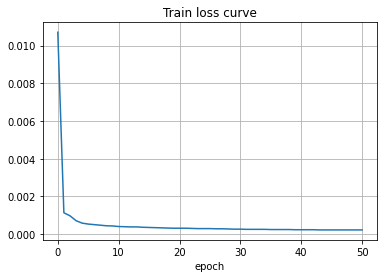

In [50]:
loss = []
for line in history:
    if 'train' in line:
        loss_str = line.split(',')[-2]
        loss.append(float(loss_str[9:]))
import matplotlib.pyplot as plt

plt.xlabel('epoch')
plt.title('Train loss curve')
plt.grid(True)
plt.plot(loss[::5])
plt.show()